# Bank Customer Churn Prediction

## The Lifecycle In A Data Science Projects


### 1. Data Gathering
1. Problem Identification/problem understanding
2.	Data collection
3.	Train Val Test split
4.	Just look at the data/try to get a sense of the data/Understand the data
5.	Data cleaning

### 2.EDA

6.	Univariate Analysis
7.	Bi-variate Analysis
8.	Explore Numerical features
9.	Explore Categorical features

### 3.Feature Engineering

10.	Handing Missing values
11.	Handling Outliers
12. Feature transformation
13. Categorical Feature Encoding
14.	Feature scaling
15.	Imbalanced dataset

### 4.Model building

### 5.Feature Selection
16.	Feature Importance
17.	Feature Selection

### 6.Model Evaluation

### 7.Model Saving

### 8.Model Deployment

### 1.Problem Identification/problem understanding

#### Here the problem/challenge is to predict whether a customer will leave the Bank or not given the relevent parameters

### 2.Data collection

#### The dataset is taken from Kaggle 
https://www.kaggle.com/datasets/adammaus/predicting-churn-for-bank-customers

In [2]:
## Importing the required libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.utils import shuffle

# to ignore warnings
import warnings
warnings.filterwarnings('ignore')

# setting the plot style 
# plt.style.use('ggplot')
sns.set_style('darkgrid')

# To display all the columns of the dataframe
pd.pandas.set_option('display.max_columns',None)

### 3.Train Val Test split

#### It's a very good practice to split the data into train val test sets as soon as you get the data to avoid overfitting of the model and data leakage.

In [3]:
# Load the data

df = pd.read_csv('../Data/Bank_Customers_Churn_Prediction/Bank_Customer_Churn.csv')

In [4]:
df

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,9996,15606229,Obijiaku,771,France,Male,39,5,0.00,2,1,0,96270.64,0
9996,9997,15569892,Johnstone,516,France,Male,35,10,57369.61,1,1,1,101699.77,0
9997,9998,15584532,Liu,709,France,Female,36,7,0.00,1,0,1,42085.58,1
9998,9999,15682355,Sabbatini,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1


### Initial thoughts and few question :

By the look of the dataset and initial observation we know we have to predict whether a customer will leave the Bank or not given the relevent parameters

We want to find the answers for the below few questions by the end of EDA

1. What are the few reasons for a customer for leaving the Bank?
2. Seems we have data from Europian countries so from which region/country customers leaving more and from which region/country customers leaving less?
3. And which age group customers leave more or leave less?
4. And how each feature is contributing in analyzing the customer churn behaviour?

In [5]:
df.shape

(10000, 14)

In [6]:
# From the initial observations we can drop ['RowNumber','CustomerId','Surname'] 
# because these features won't be having any predictive power over the target variable

In [7]:
df.drop(['RowNumber','CustomerId','Surname'],axis = 1,inplace=True)

In [8]:
# Renaming the 'Exited' feature to 'target' for the ease

df.rename(columns = {'Exited':'target'}, inplace = True)

In [9]:
# sampling 500 instances from the original dataset for each testing, validation sets and the rest will be traing set

test_df = df.sample(n=500,random_state=5)
new_df = df.drop(test_df.index)
val_df = new_df.sample(n=500,random_state=5)
train_df = new_df.drop(val_df.index)

total_train_df = new_df.drop(val_df.index)

In [10]:
# resetting the index of train, val and test datasets

train_df = train_df.reset_index(drop=True)
total_train_df = total_train_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)
val_df = val_df.reset_index(drop=True)

In [11]:
train_df

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,target
0,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0
...,...,...,...,...,...,...,...,...,...,...,...
8995,771,France,Male,39,5,0.00,2,1,0,96270.64,0
8996,516,France,Male,35,10,57369.61,1,1,1,101699.77,0
8997,709,France,Female,36,7,0.00,1,0,1,42085.58,1
8998,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1


In [12]:
total_train_df

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,target
0,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0
...,...,...,...,...,...,...,...,...,...,...,...
8995,771,France,Male,39,5,0.00,2,1,0,96270.64,0
8996,516,France,Male,35,10,57369.61,1,1,1,101699.77,0
8997,709,France,Female,36,7,0.00,1,0,1,42085.58,1
8998,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1


In [13]:
val_df

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,target
0,729,France,Male,39,4,121404.64,1,1,1,159618.17,0
1,738,Germany,Male,58,2,133745.44,4,1,0,28373.86,1
2,619,Germany,Female,28,6,99152.73,2,1,0,48475.12,0
3,650,Germany,Female,25,2,114330.95,1,1,1,25325.07,0
4,649,Germany,Male,70,9,116854.71,2,0,1,107125.79,0
...,...,...,...,...,...,...,...,...,...,...,...
495,770,France,Male,31,3,155047.56,2,1,1,186064.34,0
496,666,Germany,Female,50,7,109062.28,1,1,1,140136.10,1
497,494,France,Female,35,9,112727.06,2,1,0,183752.91,0
498,612,France,Female,63,2,126473.33,1,0,1,147545.65,0


In [14]:
test_df

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,target
0,769,Spain,Male,38,6,0.00,2,0,0,104393.78,0
1,534,France,Female,34,7,121551.58,2,1,1,70179.00,0
2,729,France,Female,34,9,132121.71,1,0,1,105409.31,0
3,619,France,Female,30,7,70729.17,1,1,1,160948.87,0
4,610,France,Male,36,4,129440.30,2,1,0,102638.35,0
...,...,...,...,...,...,...,...,...,...,...,...
495,697,Germany,Female,74,3,108071.36,2,1,1,16445.79,0
496,556,Spain,Male,46,3,131764.96,1,1,1,108500.66,1
497,689,France,Male,22,4,136444.25,1,1,0,51980.25,1
498,617,France,Female,24,4,137295.19,2,1,1,91195.12,0


### 4.Explore the data/try to get a sense of the data

In [15]:
# prints the first 5 rows/records

train_df.head()

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,target
0,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


In [16]:
# prints the shape of the dataframe (rows, columns)

train_df.shape

(9000, 11)

In [17]:
# Prints the no.of rows, no.of colunmns, and each columns datatype and the no.of non-null values in each column

train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9000 entries, 0 to 8999
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   CreditScore      9000 non-null   int64  
 1   Geography        9000 non-null   object 
 2   Gender           9000 non-null   object 
 3   Age              9000 non-null   int64  
 4   Tenure           9000 non-null   int64  
 5   Balance          9000 non-null   float64
 6   NumOfProducts    9000 non-null   int64  
 7   HasCrCard        9000 non-null   int64  
 8   IsActiveMember   9000 non-null   int64  
 9   EstimatedSalary  9000 non-null   float64
 10  target           9000 non-null   int64  
dtypes: float64(2), int64(7), object(2)
memory usage: 773.6+ KB


#### Note : Its a very good practice to understand what each column represents / means by reading documents provided my subject matter expert or discusing with the domain expert if not do some reaserch. So that we can have an idea of how important each column/feature is and how to deal with it moving forward

#### -- Here we don't have much info. we just have to understand by observing each columns data

1. CreditScore - A credit score is a prediction of your credit behavior, such as how likely you are to pay a loan back on time, based on information from your credit reports. Mean higher the value better the Customer.
2. Geography - Geographical Location of the Customer
3. Gender - Gender of the Customer (1-Male,0-Female)
4. Age - Age of the Customer
5. Tenure - How many years that the customer had been with Bank
6. Balance - Bank Account balance of the Customer at the time of leaving.
7. NumOfProducts - No.of Products that the customer enrolled for like savings account/credit or debit card/ home or peronal loan and so on.
8. HasCrCard - Does the Customer has credit card (1-Yes,0-no)
9. IsActiveMember - Does the Customer is active in using the Banks products/services (1-Yes,0-No)
10. EstimatedSalary - Estimated annual salary of the Customer in Euros (Assuming)
11. target - Indicating 1 - Customer leaves and 0 - Customer will not leave

#### -- And this data set is having 11 no.of features (including "target" ) and we must try to understand what each feature means so that it will be helpfull for us to do the better feature selection

In [18]:
#prints the list of collumns, yes its not exactly a list but Index type

train_df.columns

Index(['CreditScore', 'Geography', 'Gender', 'Age', 'Tenure', 'Balance',
       'NumOfProducts', 'HasCrCard', 'IsActiveMember', 'EstimatedSalary',
       'target'],
      dtype='object')

In [19]:
# prints the no.of null values in each feature
# prints the % of null values in each feature

total = train_df.isnull().sum().sort_values(ascending=False)
percent = np.round_(((train_df.isnull().sum()/train_df.isnull().count())*100),decimals=2).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data

,Total,Percent
CreditScore,0,0.0
Geography,0,0.0
Gender,0,0.0
Age,0,0.0
Tenure,0,0.0
Balance,0,0.0
NumOfProducts,0,0.0
HasCrCard,0,0.0
IsActiveMember,0,0.0
EstimatedSalary,0,0.0


### Observations :

1. From above we can see that the datatypes are represented properly and also no null values 
2. Its a descent size dataset (10,000), we sampled 500 each for validation and testing
3. No data cleaning is required

In [20]:
# sampling the train data for better vizualizations and for faster model training

In [21]:
train_df.loc[train_df['target']==1]

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,target
0,619,France,Female,42,2,0.00,1,1,1,101348.88,1
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
5,645,Spain,Male,44,8,113755.78,2,1,0,149756.71,1
7,376,Germany,Female,29,4,115046.74,4,1,0,119346.88,1
16,653,Germany,Male,58,1,132602.88,1,1,0,5097.67,1
...,...,...,...,...,...,...,...,...,...,...,...
8982,498,Germany,Male,42,3,152039.70,1,1,1,53445.17,1
8983,655,Germany,Female,46,7,137145.12,1,1,0,115146.40,1
8991,597,France,Female,53,4,88381.21,1,1,0,69384.71,1
8997,709,France,Female,36,7,0.00,1,0,1,42085.58,1


In [22]:
target_1_df = train_df.loc[train_df['target']==1].sample(n=1000,random_state=5)

In [23]:
target_0_df = train_df.loc[train_df['target']==0].sample(n=1000,random_state=5)

In [24]:
target_1_df

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,target
761,732,Spain,Female,69,9,137453.43,1,0,1,110932.24,1
2055,538,France,Female,38,8,88758.95,2,0,0,28226.15,1
52,655,Germany,Male,41,8,125561.97,1,0,0,164040.94,1
7573,612,Spain,Female,52,5,144772.69,1,0,0,98302.57,1
8377,824,France,Male,26,7,146266.00,1,1,0,21903.62,1
...,...,...,...,...,...,...,...,...,...,...,...
7505,642,Germany,Female,36,2,124495.98,3,1,1,57904.22,1
3205,554,Germany,Female,43,2,120847.11,1,1,0,7611.61,1
3582,657,Germany,Female,38,5,123770.46,1,0,0,47019.66,1
6190,754,Germany,Female,48,7,141819.02,1,1,0,93550.53,1


In [25]:
target_0_df

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,target
2437,574,Spain,Female,28,7,0.00,2,0,0,185660.30,0
4321,710,France,Female,37,5,0.00,2,1,0,115403.31,0
3720,671,Spain,Male,34,10,153360.02,1,1,0,140509.86,0
8652,741,France,Female,35,1,0.00,2,1,0,36557.55,0
6206,666,Spain,Male,43,5,0.00,2,1,0,29346.10,0
...,...,...,...,...,...,...,...,...,...,...,...
4809,680,Spain,Male,42,0,0.00,1,1,0,136377.21,0
15,616,Germany,Male,45,3,143129.41,2,0,1,64327.26,0
4723,672,Spain,Male,43,5,0.00,2,1,1,64515.50,0
2335,689,Spain,Male,40,2,0.00,2,1,1,164768.82,0


In [26]:
train_df = shuffle(pd.concat([target_0_df,target_1_df]))

In [27]:
train_df = train_df.reset_index(drop=True)
train_df

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,target
0,432,Germany,Female,45,3,110219.14,1,1,0,43046.70,1
1,763,Germany,Male,31,7,143966.30,2,1,1,140262.96,1
2,681,France,Male,32,3,148884.47,2,1,1,90967.37,0
3,627,Germany,Female,35,2,137852.96,1,1,1,172269.21,1
4,631,Spain,Female,41,0,0.00,1,0,0,87959.83,0
...,...,...,...,...,...,...,...,...,...,...,...
1995,548,France,Female,29,4,0.00,2,0,1,48673.18,0
1996,641,France,Female,40,7,0.00,1,1,0,126996.67,0
1997,570,Germany,Female,57,5,86568.75,1,0,1,103660.31,0
1998,778,France,Male,44,8,123863.64,1,1,0,144494.94,0


## EDA Exploratory Data Analysis

1. EDA can be leveraged to check for outliers, patterns, and trends in the given data.
2. EDA helps to find meaningful patterns in data.
3. EDA provides in-depth insights into the data sets to solve our business problems.
4. EDA gives a clue to impute missing values in the dataset 

In [28]:
# Extracting numerical column names

numerical_features = train_df.select_dtypes(include=np.number).columns
print(numerical_features)
print(len(numerical_features))

Index(['CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary', 'target'],
      dtype='object')
9


In [29]:
# Extracting categorical features

categorical_features = train_df.select_dtypes(include='object').columns
print(categorical_features)
print(len(categorical_features))

# No categorical features (less work)

Index(['Geography', 'Gender'], dtype='object')
2


In [30]:
# prints the no.of null values in each feature
# prints the % of null values in each feature

total = train_df.isnull().sum().sort_values(ascending=False)
percent = np.round_(((train_df.isnull().sum()/train_df.isnull().count())*100),decimals=2).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data

,Total,Percent
CreditScore,0,0.0
Geography,0,0.0
Gender,0,0.0
Age,0,0.0
Tenure,0,0.0
Balance,0,0.0
NumOfProducts,0,0.0
HasCrCard,0,0.0
IsActiveMember,0,0.0
EstimatedSalary,0,0.0


In [31]:
# prints the no.of zeros in each feature
# prints the % of zeros in each feature

zeros_count = {}
for col in train_df.columns:
    if col == 'target':
        continue
    count = (train_df[col] == 0).sum()
    zeros_count[col]=count
    df_zeros = pd.DataFrame.from_dict(zeros_count,orient='index',columns=['zeros'])
df_zeros['Percent'] = df_zeros['zeros']/len(train_df)*100
df_zeros.sort_values(by=['zeros'],ascending=False)

,zeros,Percent
IsActiveMember,1071,53.55
target,1000,50.00
Balance,612,30.60
HasCrCard,603,30.15
Tenure,79,3.95
CreditScore,0,0.00
Geography,0,0.00
Gender,0,0.00
Age,0,0.00
NumOfProducts,0,0.00


In [32]:
## The zeros for the above features are accepteble/valid. so we will leave those.

### Statistics summary
#### Statistics summary gives a high-level idea to identify whether the data has any outliers, data entry error, distribution of data such as the data is normally distributed or left/right skewed

In [33]:
# statistical summary of the data (only for Numerical features)

train_df[['CreditScore','Age','Tenure','Balance','EstimatedSalary']].describe().T

,count,mean,std,min,25%,50%,75%,max
CreditScore,2000.0,646.707000,98.553039,350.00,579.00,648.000,714.2500,850.00
Age,2000.0,41.147000,10.483861,18.00,34.00,40.000,48.0000,82.00
Tenure,2000.0,5.045000,2.930575,0.00,2.00,5.000,8.0000,10.00
Balance,2000.0,84392.102355,61285.454154,0.00,0.00,106420.660,129878.9375,250898.09
EstimatedSalary,2000.0,102174.786135,57871.201388,123.07,53563.79,103539.655,151774.0225,199808.10


### Observations :

These are very high level and approx observations. we must do further analysis.

1. Mean CreditScore is 650 with std of 96 ranging from 350-850. seems close to normal dist.
2. Mean Age of the Customers is ~41 with std of 10 ranging from 18-92. and 75% of the customers are lesst than or equal to age 44 and seems a bit right skewed
3. The Avg cutomer Tenure is 5 years with std of 2.8 yrs ranging from 0-10. seems close to normal dist.
4. The avg account balance is 76k Euros (which is high for a savings account or else the data is more of a prime customers) with std of 62k(which is high) ranging from 0-250k. we can see that nearly 25% of the customers having balance 0
5. Avg EstimatedSalary is 100k with std of 57k ranging from 123-200k. with the quantiles seems close to normal dist.

In [34]:
train_df['target'].value_counts(normalize=True)

1    0.5
0    0.5
Name: target, dtype: float64

In [35]:
fig = px.bar(x=train_df['target'].value_counts().index, y=train_df['target'].value_counts().values,
             text = train_df['target'].value_counts(),color=['blue', 'red'],opacity=0.8)
fig.show()

fig = px.pie(train_df, values=train_df['target'].value_counts().values, names=['Wll not Leave','Will Leave'], title='target',opacity=0.8)
fig.show()

In [ ]:
total_train_df['target'].value_counts(normalize=True)

### Observation :
    
1. From above we can see that our train data heavily imbalanced (4:1). we will deal with it later.

### Univariate Analysis of Numerical_features

In [36]:
train_df[numerical_features].nunique().sort_values(ascending=False)

EstimatedSalary    2000
Balance            1388
CreditScore         414
Age                  60
Tenure               11
NumOfProducts         4
HasCrCard             2
IsActiveMember        2
target                2
dtype: int64

In [37]:
## Numerical variables are usually of 2 type
## 1. Continous variable and Discrete Variables

discrete_features = [feature for feature in numerical_features if len(train_df[feature].unique())<20]
print("Discrete Variables Count: {}".format(len(discrete_features)))

Discrete Variables Count: 5


In [38]:
discrete_features

['Tenure', 'NumOfProducts', 'HasCrCard', 'IsActiveMember', 'target']

In [39]:
train_df[discrete_features].head()

,Tenure,NumOfProducts,HasCrCard,IsActiveMember,target
0,3,1,1,0,1
1,7,2,1,1,1
2,3,2,1,1,0
3,2,1,1,1,1
4,0,1,0,0,0


In [40]:
continuous_features=[feature for feature in numerical_features if feature not in discrete_features]
print("Continuous feature Count {}".format(len(continuous_features)))

Continuous feature Count 4


In [41]:
train_df[continuous_features].head()

,CreditScore,Age,Balance,EstimatedSalary
0,432,45,110219.14,43046.70
1,763,31,143966.30,140262.96
2,681,32,148884.47,90967.37
3,627,35,137852.96,172269.21
4,631,41,0.00,87959.83


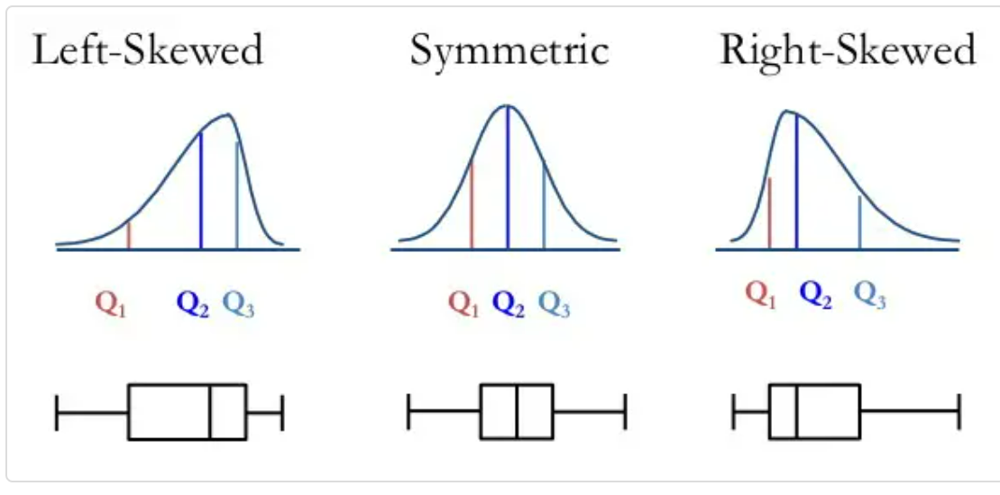

Box plots visually show the distribution of numerical data and skewness through displaying the data quartiles (or percentiles) and averages.

1. When the median is closer to the bottom of the box, and if the whisker is shorter on the lower end of the box, then the distribution is positively skewed (skewed right).

2. When the median is closer to the top of the box, and if the whisker is shorter on the upper end of the box, then the distribution is negatively skewed (skewed left).

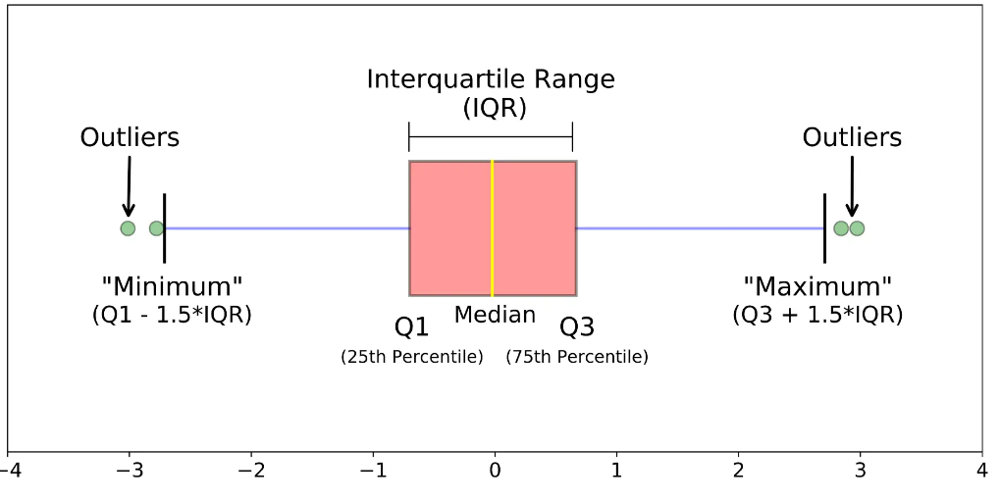

1. If the skewness is between -0.5 and 0.5, the data are fairly symmetrical. If the skewness is between -1 and – 0.5 or between 0.5 and 1, the data are moderately skewed. If the skewness is less than -1 or greater than 1, the data are highly skewed.

2. When the value of the skewness is negative, the tail of the distribution is longer towards the left hand side of the curve. and vice-versa

### Univariate/Bivariate distributions

CreditScore
no.of nulls : 0
% of nulls : 0.0
Skew : -0.08


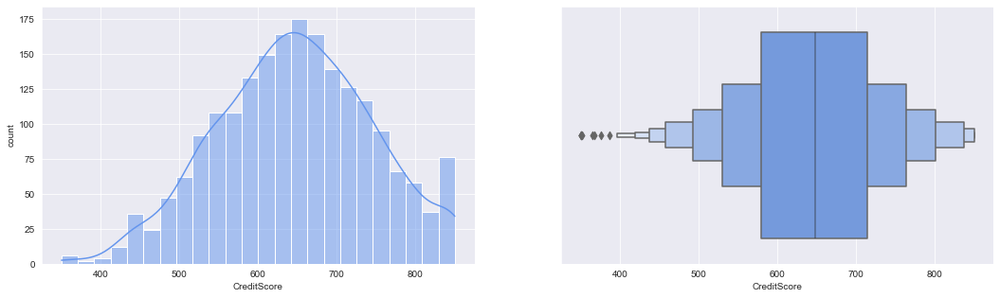

Age
no.of nulls : 0
% of nulls : 0.0
Skew : 0.53


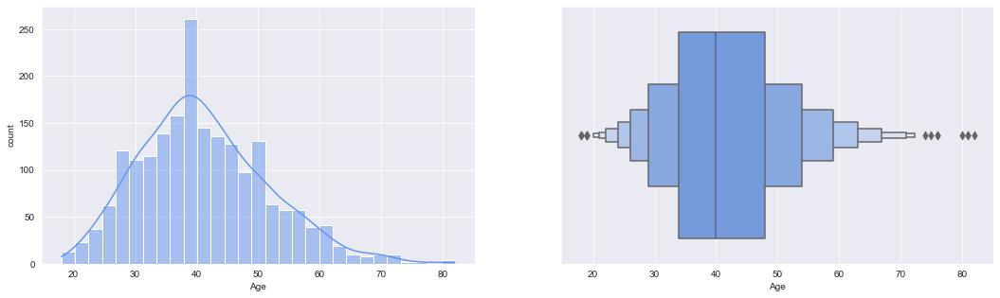

Balance
no.of nulls : 0
% of nulls : 0.0
Skew : -0.34


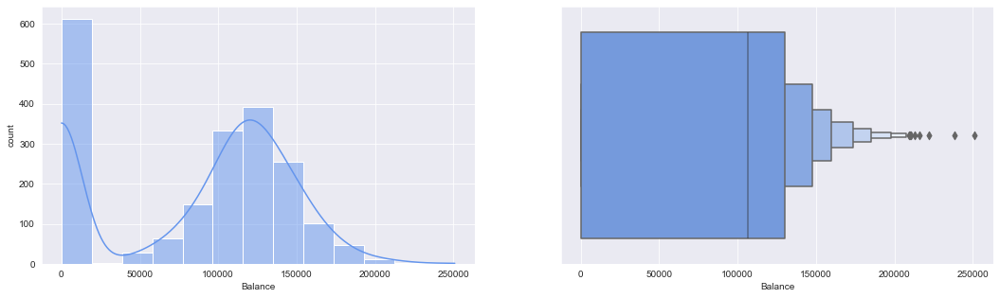

EstimatedSalary
no.of nulls : 0
% of nulls : 0.0
Skew : -0.06


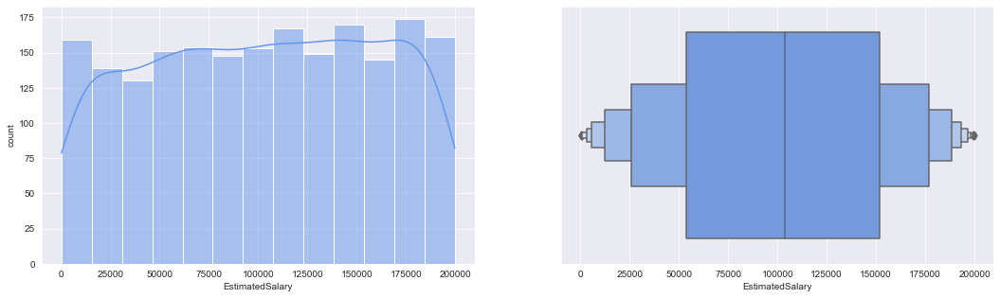

In [42]:
for col in continuous_features:
    print(col)
    print('no.of nulls :',train_df[col].isna().sum())
    print('% of nulls :',np.round_(train_df[col].isna().sum()/len(train_df)*100,decimals=2))
    print('Skew :', round(train_df[col].skew(), 2))
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.histplot(data=train_df, x=col, kde=True,color = 'cornflowerblue')
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxenplot(x=train_df[col],color = 'cornflowerblue')
    plt.show()

### Observations : 
1. From above we can see that Credit_score almost normal dist. 
2. Age is bit right skewed
3. Balance is also normal dist except the zeros 
4. and the EstimatedSalary is uniformly dist.

CreditScore
no.of nulls : 0
% of nulls : 0.0
Skew : -0.08


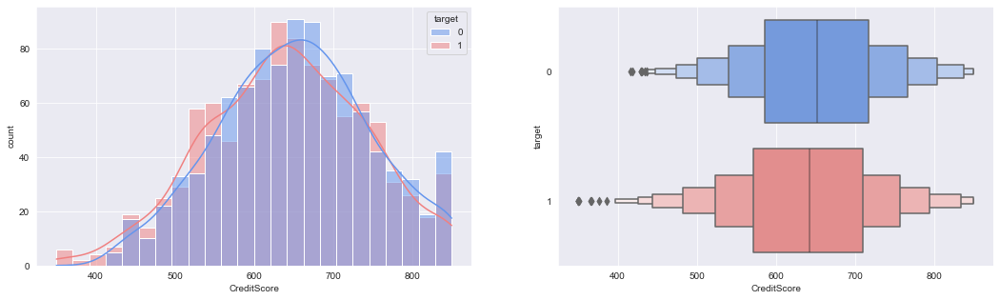

Age
no.of nulls : 0
% of nulls : 0.0
Skew : 0.53


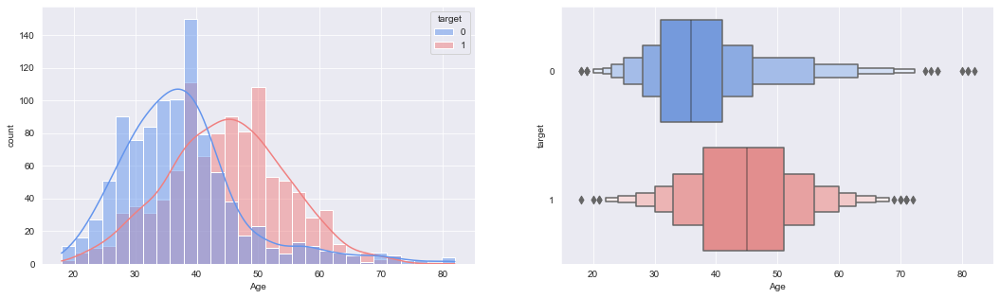

Balance
no.of nulls : 0
% of nulls : 0.0
Skew : -0.34


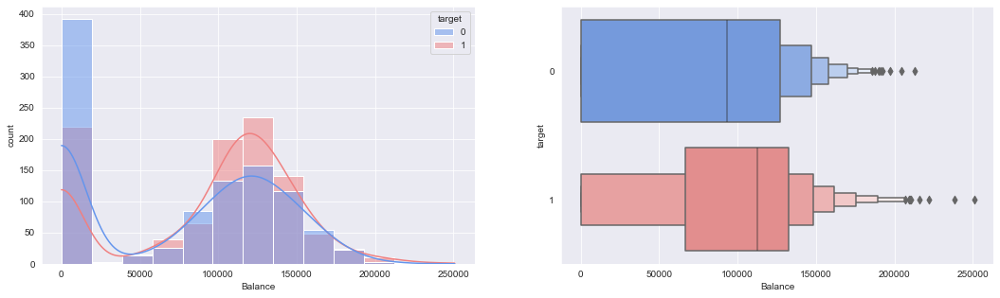

EstimatedSalary
no.of nulls : 0
% of nulls : 0.0
Skew : -0.06


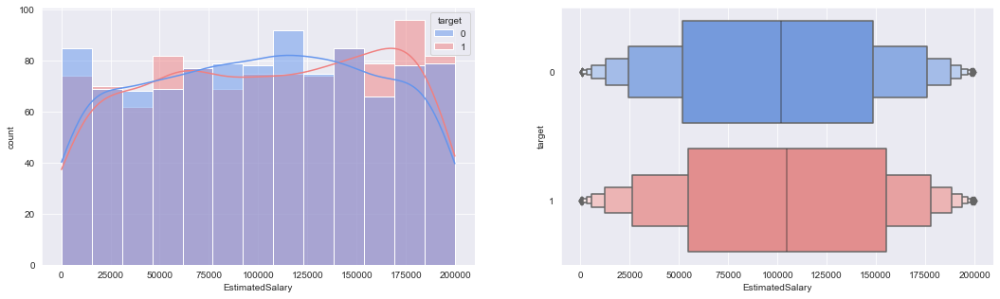

In [43]:
for col in continuous_features:
    print(col)
    print('no.of nulls :',train_df[col].isna().sum())
    print('% of nulls :',np.round_(train_df[col].isna().sum()/len(train_df)*100,decimals=2))
    print('Skew :', round(train_df[col].skew(), 2))
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.histplot(data=train_df, x=col, kde=True,hue='target',palette=['cornflowerblue','lightcoral'])
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxenplot(data=train_df, x=col, y='target', order=[0,1],orient='h',palette=['cornflowerblue','lightcoral'])
    plt.show()

CreditScore
Skew : -0.08


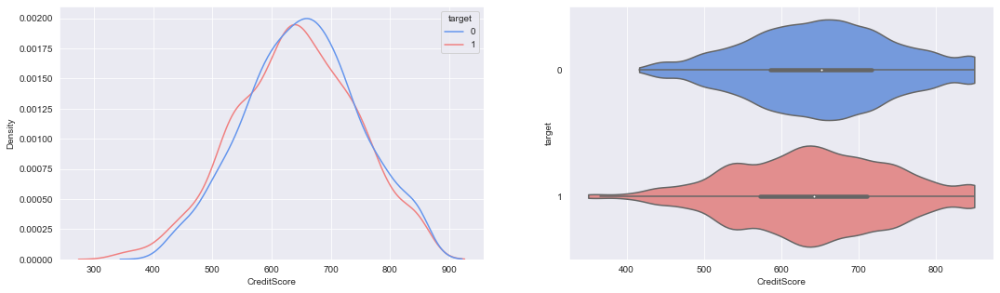

Age
Skew : 0.53


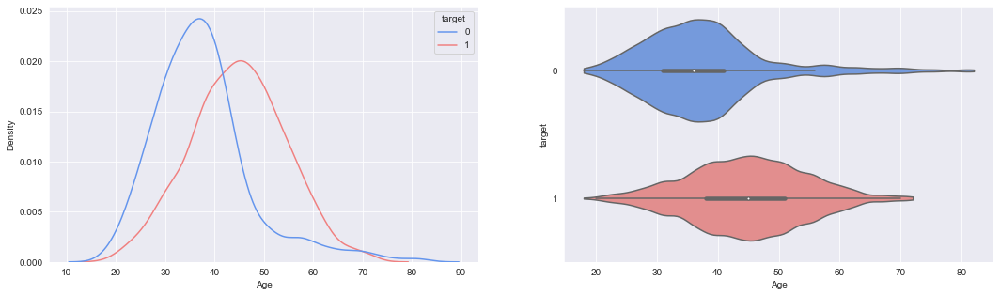

Balance
Skew : -0.34


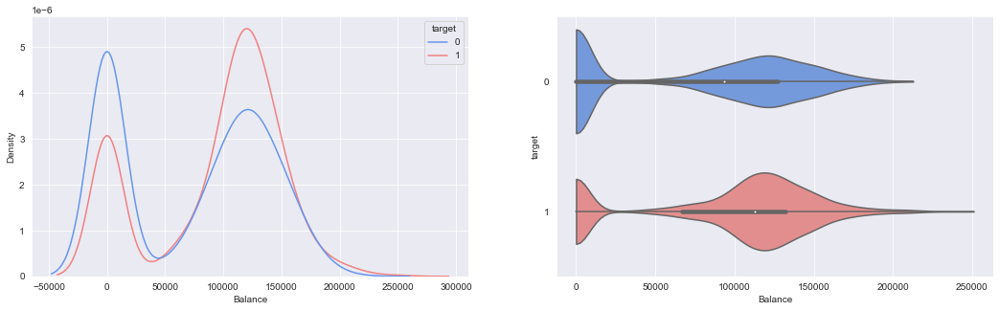

EstimatedSalary
Skew : -0.06


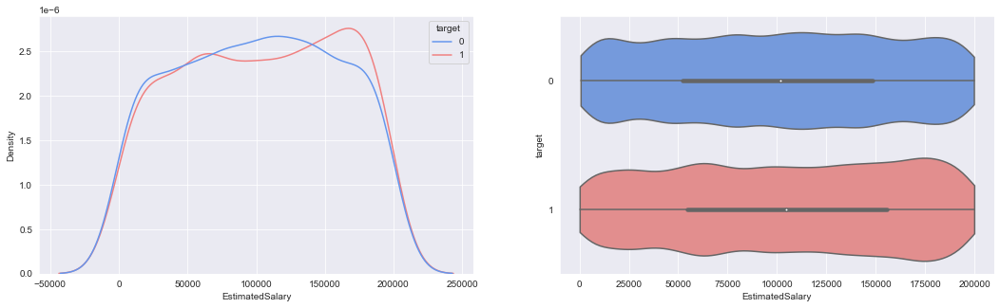

In [44]:
for col in continuous_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.kdeplot(data=train_df, x=col,hue='target',palette=['cornflowerblue','lightcoral'])
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.subplot(1, 2, 2)
    #sns.violinplot(x=train_df[col],saturation=1)
    sns.violinplot(data=train_df, x=col, y='target', order=[0,1],orient='h',palette=['cornflowerblue','lightcoral'], bw=.15,cut=0)
    plt.show()

### Observations :
1. From above we can observe that there is a clear age group diffreneces between customers leaving and not leaving
2. And there is not much differences betwen other features and target

#### If you want to check whether feature is guassian or normal distributed
#### Q-Q plot

In [45]:
import scipy.stats as stat
import pylab 

CreditScore
Skew : -0.08
0.0003545099763070198


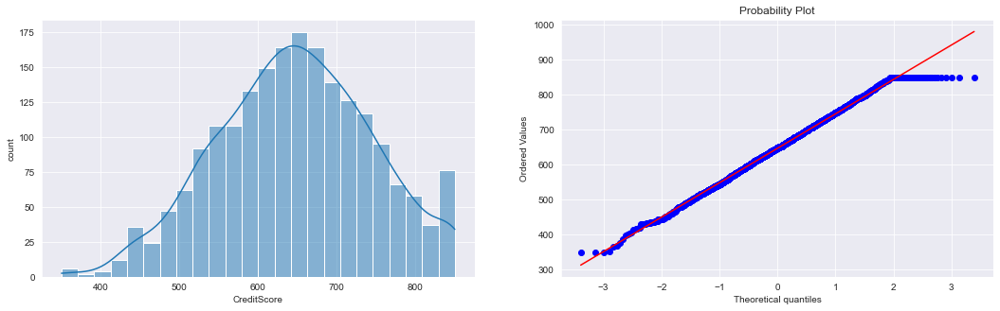

Age
Skew : 0.53
5.961011615266571e-20


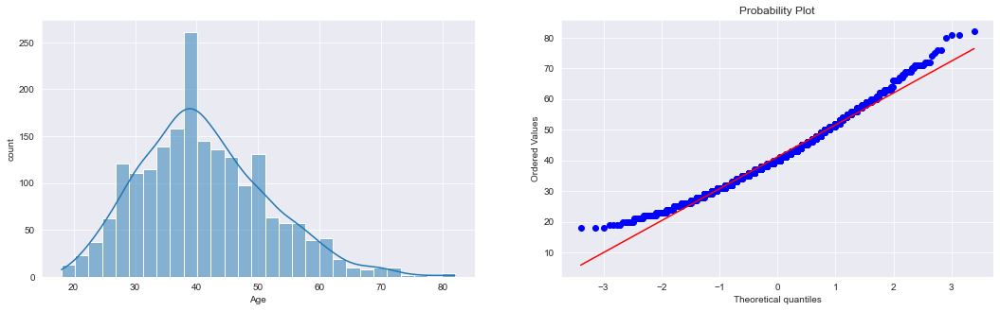

Balance
Skew : -0.34
0.0


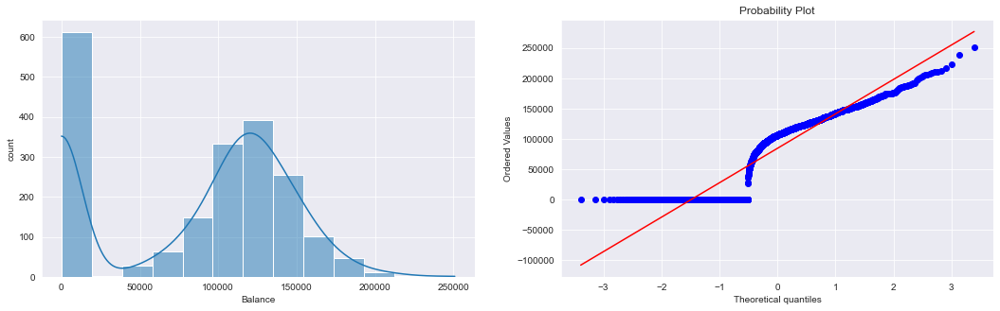

EstimatedSalary
Skew : -0.06
4.0948412605654897e-300


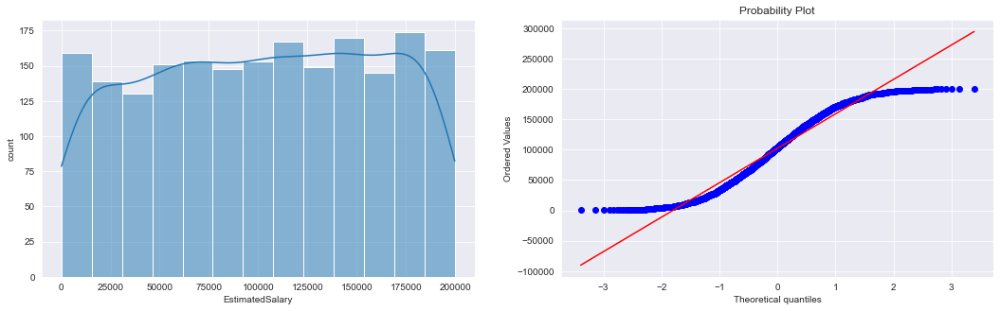

In [46]:
for col in continuous_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    _, p = stat.normaltest(train_df[col].to_numpy())
    print(p)
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.histplot(data=train_df, x=col, kde=True)
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    stat.probplot(train_df[col],dist='norm',plot=pylab)
    plt.show()

In [47]:
train_df.columns

Index(['CreditScore', 'Geography', 'Gender', 'Age', 'Tenure', 'Balance',
       'NumOfProducts', 'HasCrCard', 'IsActiveMember', 'EstimatedSalary',
       'target'],
      dtype='object')

### Visualizing bivariate/multivariate distributions

Text(0, 0.5, 'No.of Heart Disease people')

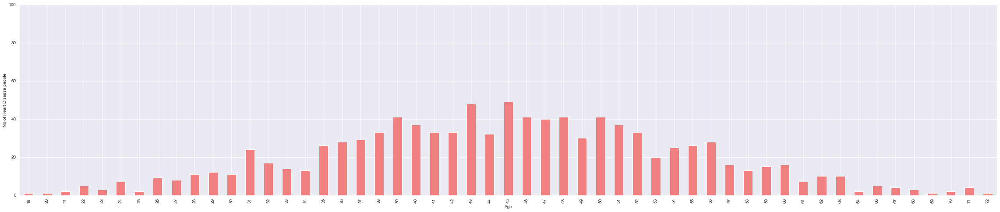

In [48]:
plt.figure(figsize = (40,8))
train_df.loc[train_df['target']==1]['Age'].value_counts().sort_index().plot.bar(color = 'lightcoral')

plt.ylim(0, 100)

plt.xlabel('Age')
plt.ylabel('No.of Heart Disease people')

# Double click on the plot/graph to zoom in

Text(0, 0.5, 'No.of Healthy people')

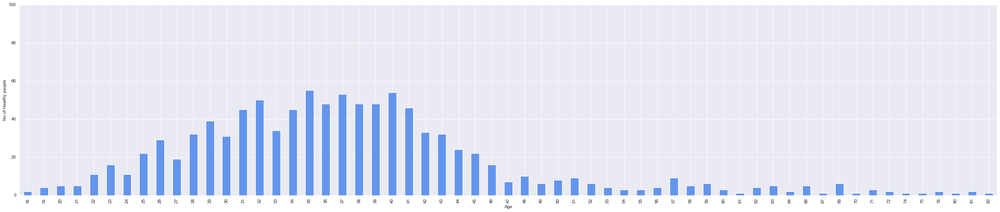

In [49]:
plt.figure(figsize = (40,8))
train_df.loc[train_df['target']==0]['Age'].value_counts().sort_index().plot.bar(color = 'cornflowerblue')

plt.ylim(0, 100)

plt.xlabel('Age')
plt.ylabel('No.of Healthy people')

# Double click on the plot/graph to zoom in

In [50]:
# From above we can see that age group of 40-60 people are leaving the bank more
# And the banks majot customers are 30-40 age people

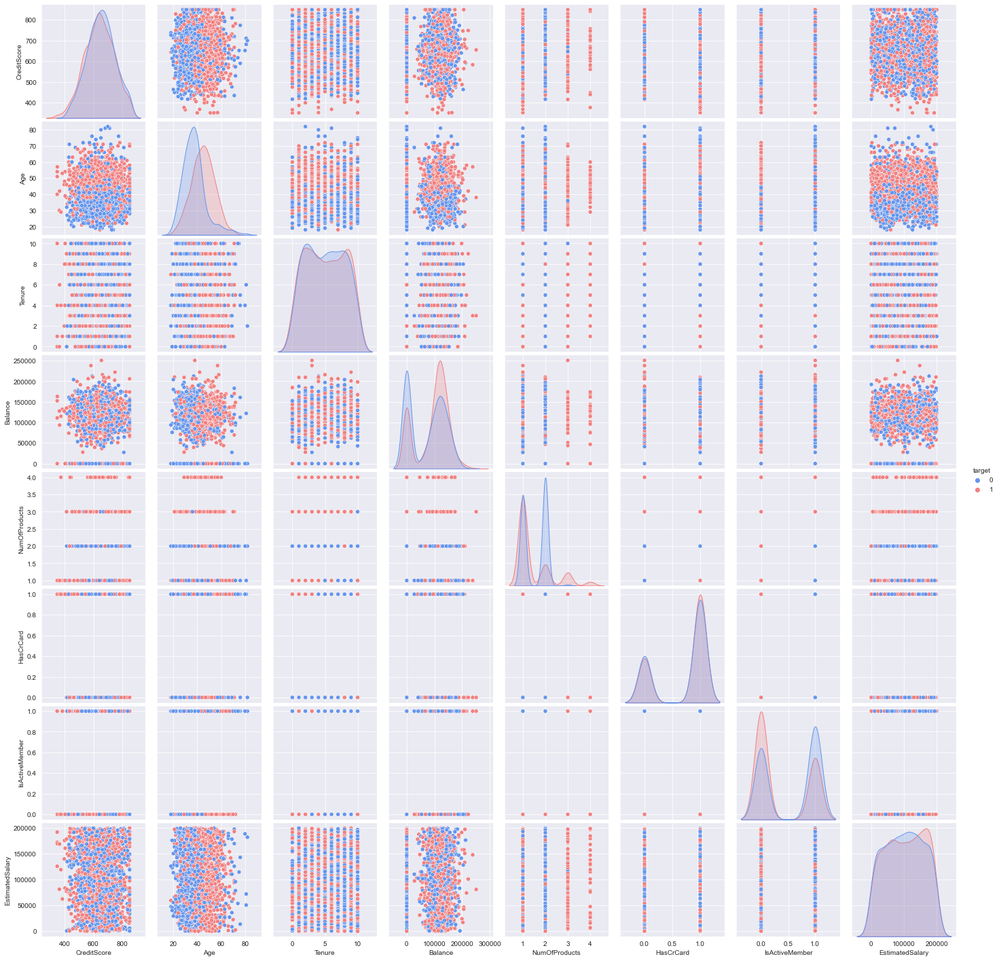

In [51]:
sns.pairplot(train_df, hue='target',palette=['cornflowerblue','lightcoral'])

# Its not clear to observe graphs closely we will plot indvidual plots for some features

CreditScore


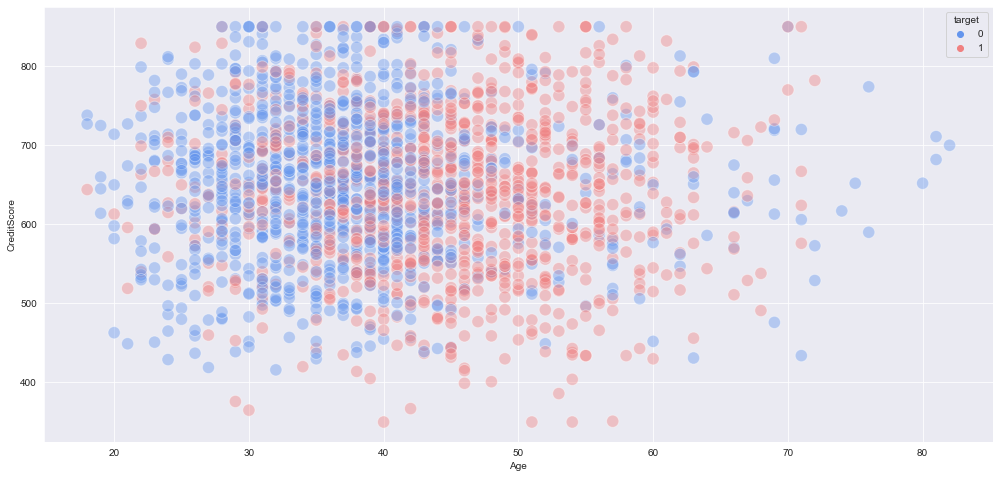

Age


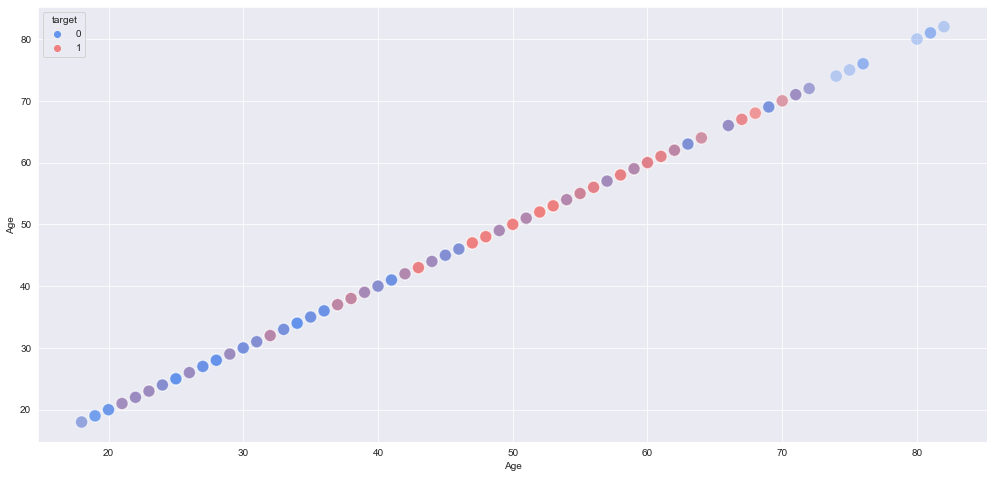

Balance


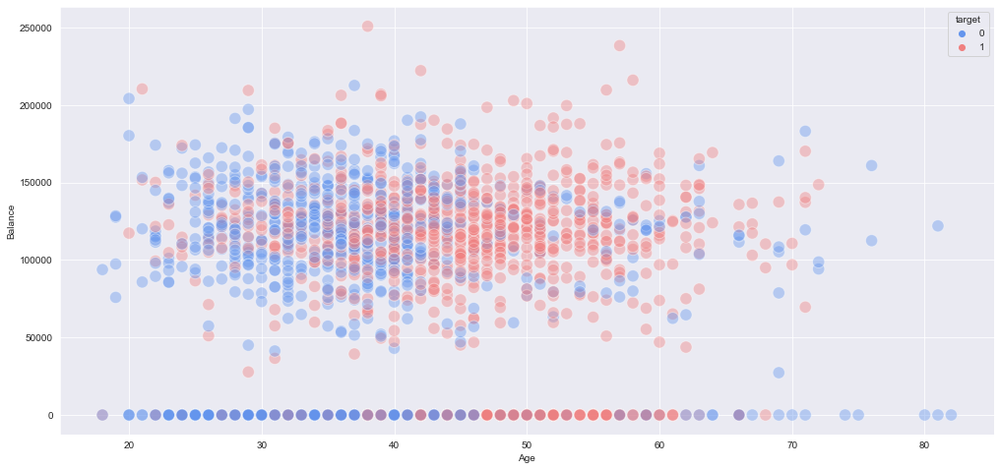

EstimatedSalary


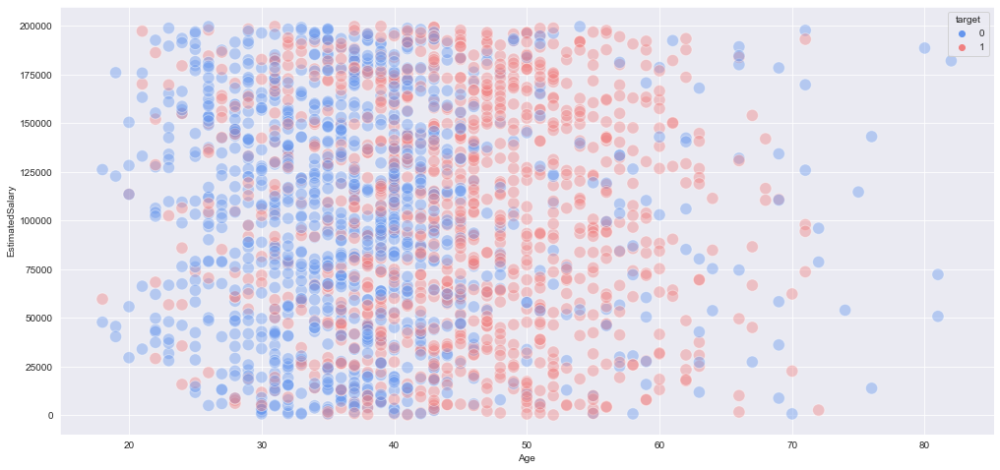

In [52]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='Age',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('Age')
    plt.ylabel(col)
    plt.show()

CreditScore


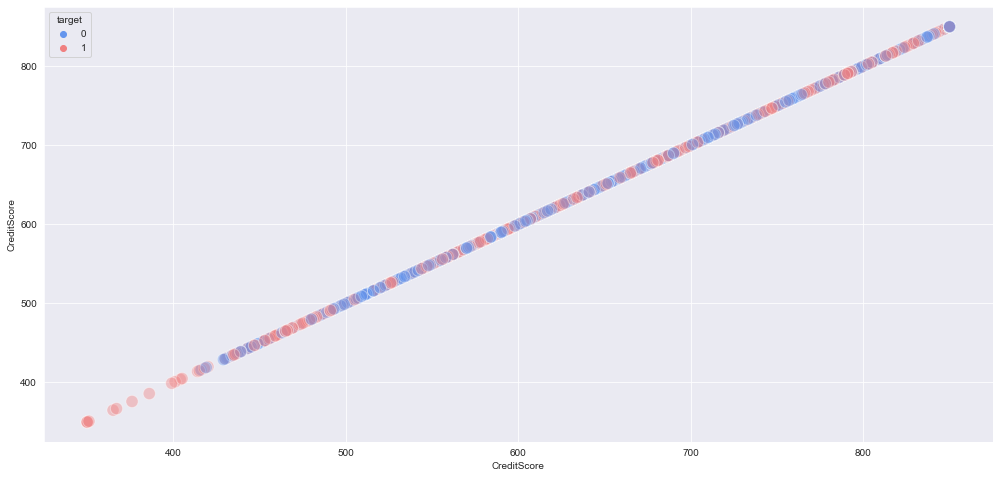

Age


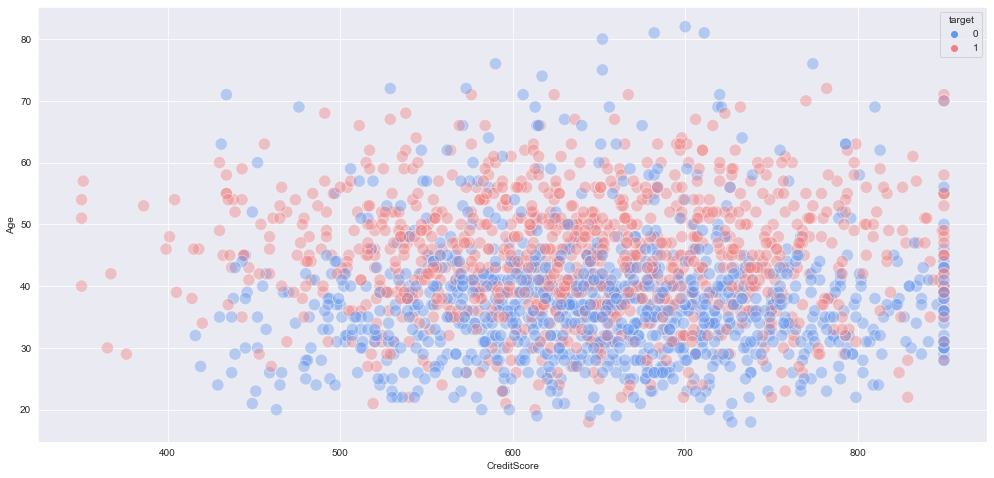

Balance


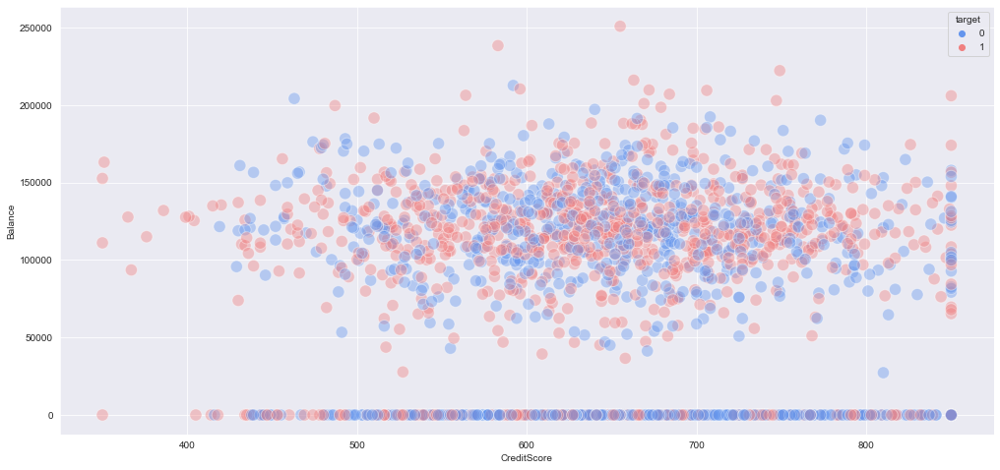

EstimatedSalary


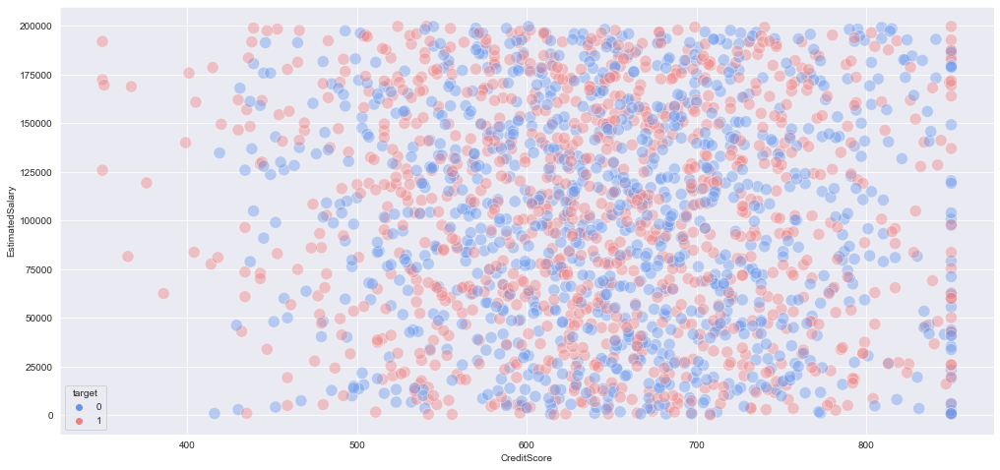

In [53]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='CreditScore',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('CreditScore')
    plt.ylabel(col)
    plt.show()

### Observations :

1. From above we can observe that Credit_Score less than 400 are striaght away churn customers

CreditScore


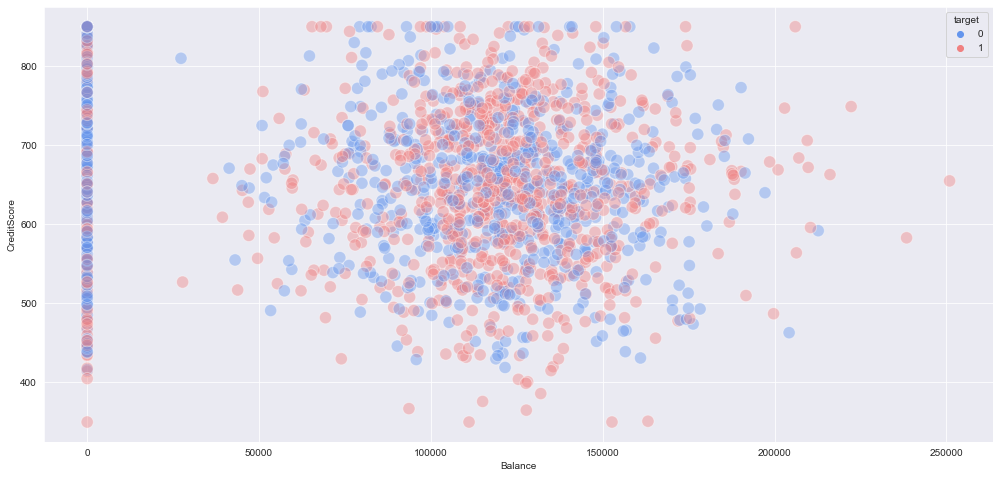

Age


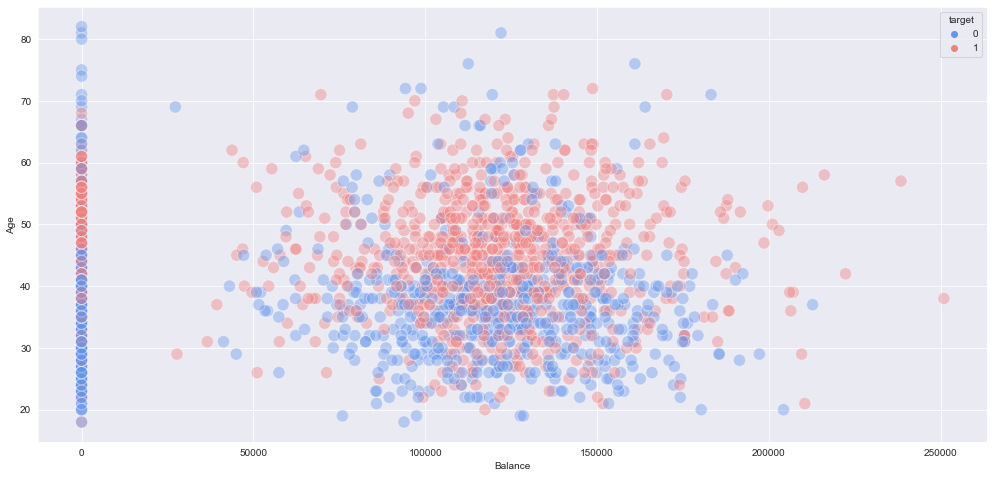

Balance


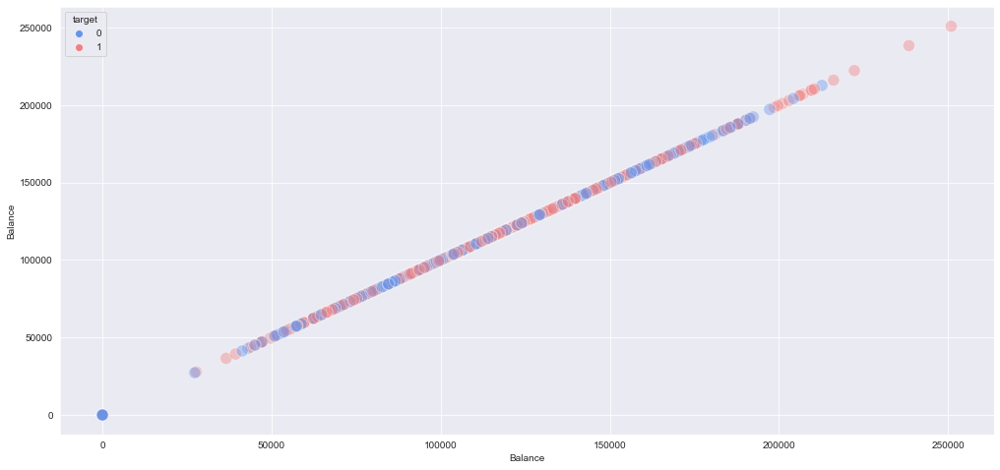

EstimatedSalary


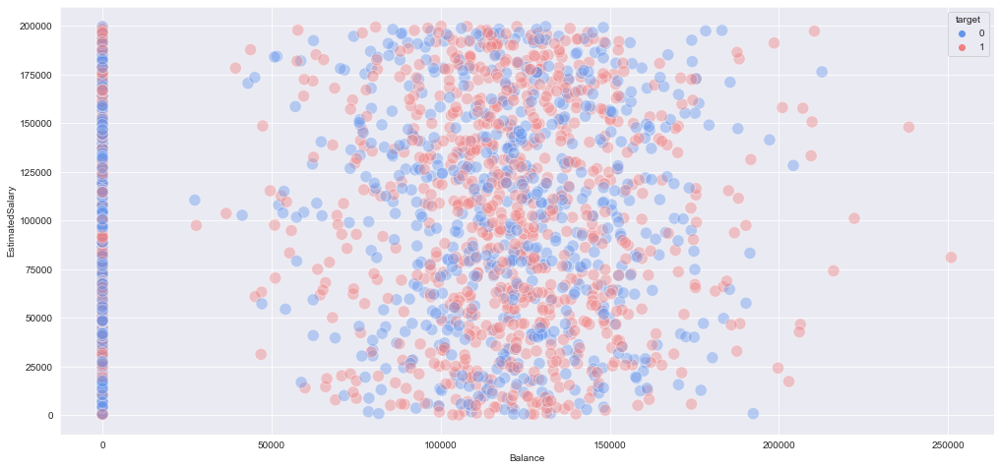

In [54]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='Balance',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('Balance')
    plt.ylabel(col)
    plt.show()

CreditScore


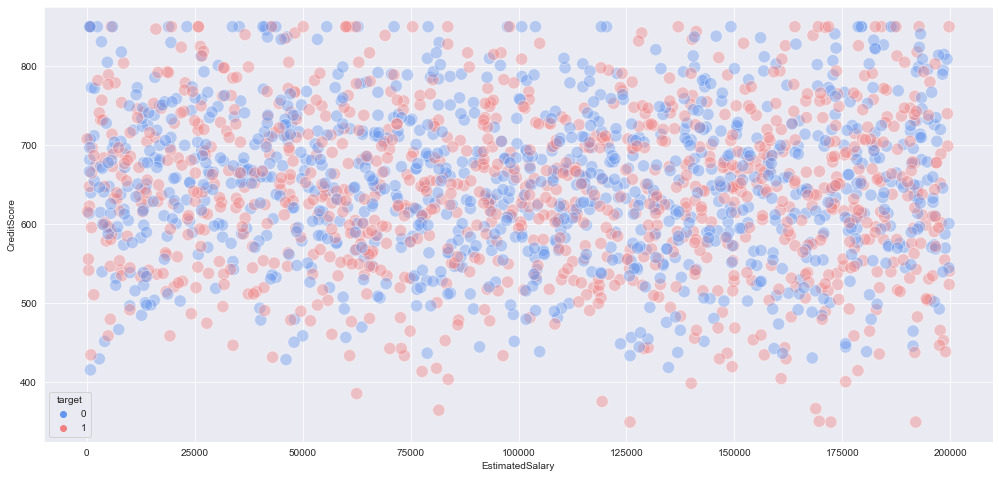

Age


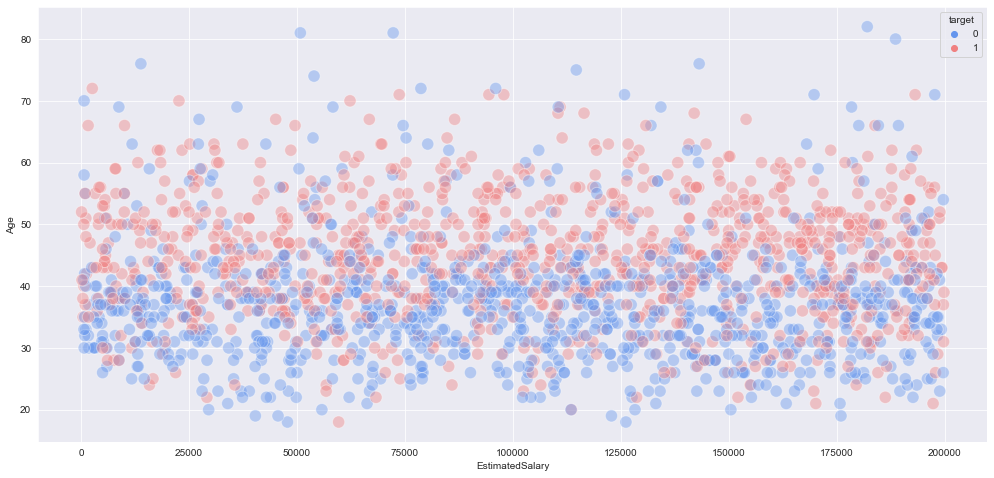

Balance


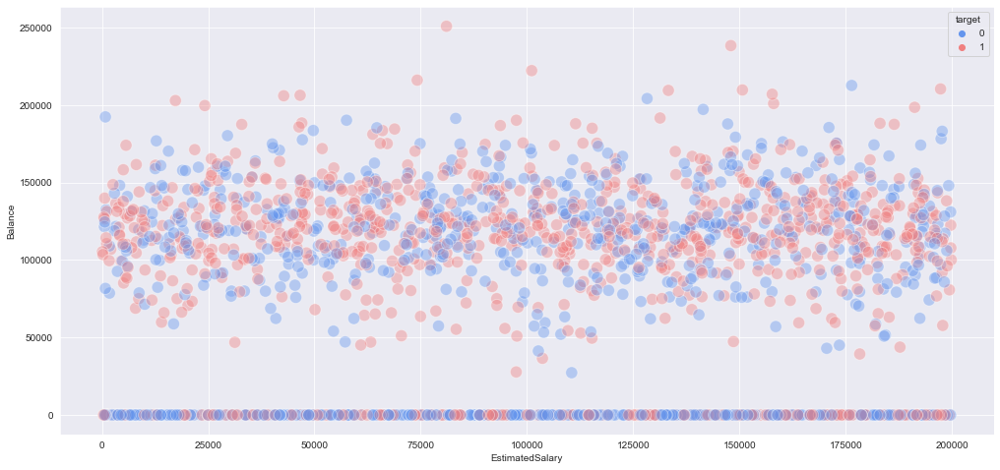

EstimatedSalary


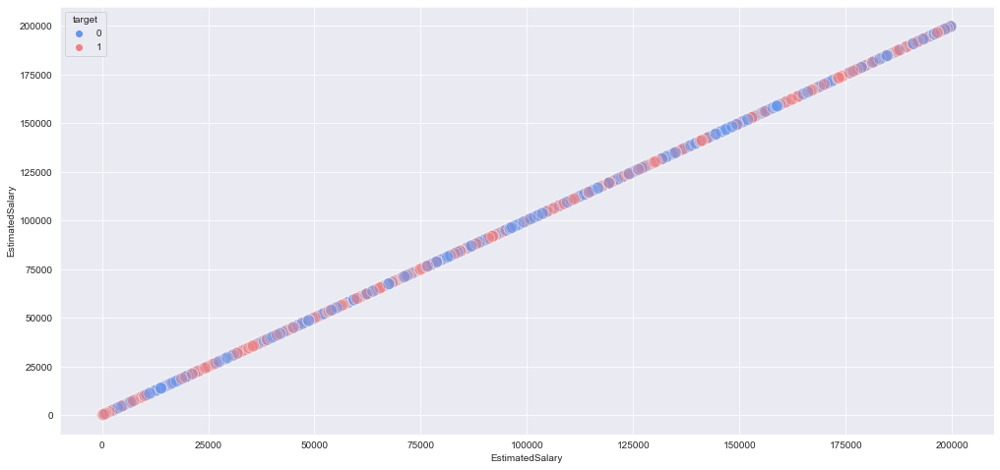

In [55]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (17,8))
    sns.scatterplot(data=train_df, x='EstimatedSalary',y=col,hue='target',palette=['cornflowerblue','lightcoral'],alpha=0.4,s=150)
    plt.xlabel('EstimatedSalary')
    plt.ylabel(col)
    plt.show()

In [56]:
train_df.columns

Index(['CreditScore', 'Geography', 'Gender', 'Age', 'Tenure', 'Balance',
       'NumOfProducts', 'HasCrCard', 'IsActiveMember', 'EstimatedSalary',
       'target'],
      dtype='object')

In [57]:
fig = px.scatter_3d(train_df, x="Age", y="CreditScore", z="Balance", color="target")
fig.show()

### Discrete_features

### Univariate/Bivariate analysis

In [58]:
train_df[discrete_features].nunique().sort_values(ascending=False)

Tenure            11
NumOfProducts      4
HasCrCard          2
IsActiveMember     2
target             2
dtype: int64

In [59]:
discrete_features = ['Tenure', 'NumOfProducts', 'HasCrCard', 'IsActiveMember']

discrete_features

['Tenure', 'NumOfProducts', 'HasCrCard', 'IsActiveMember']

Tenure


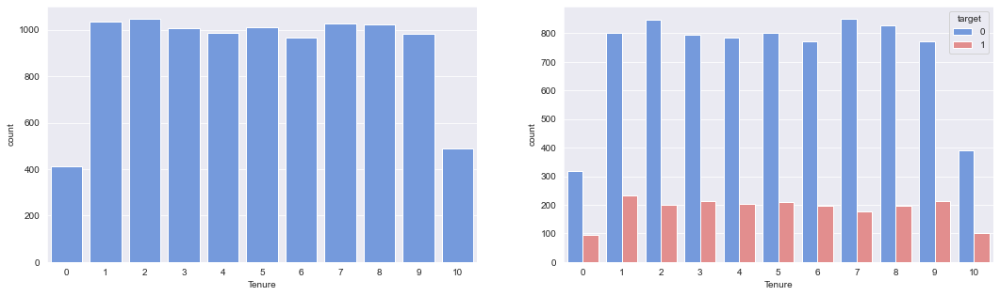

NumOfProducts


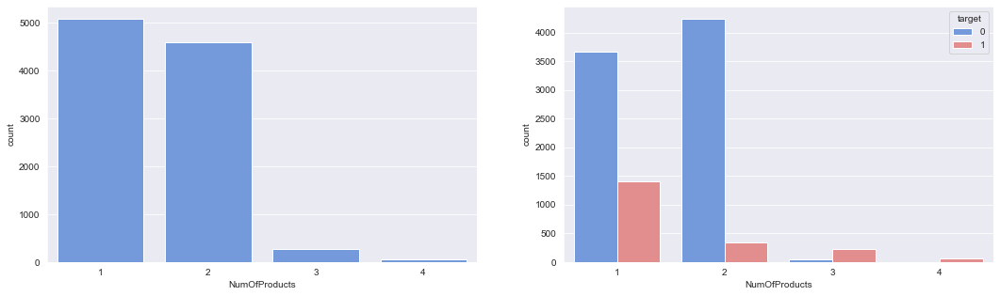

HasCrCard


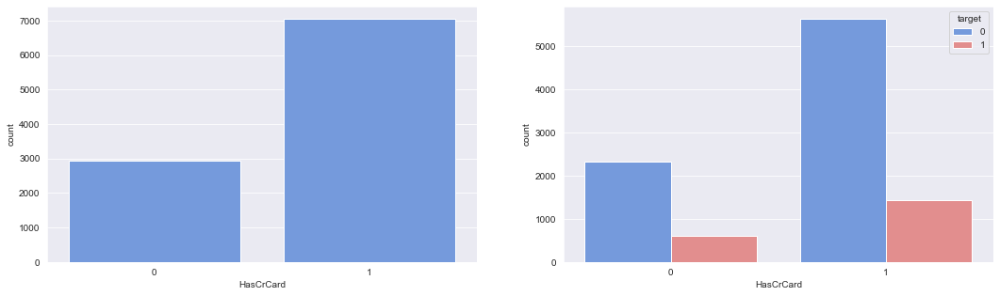

IsActiveMember


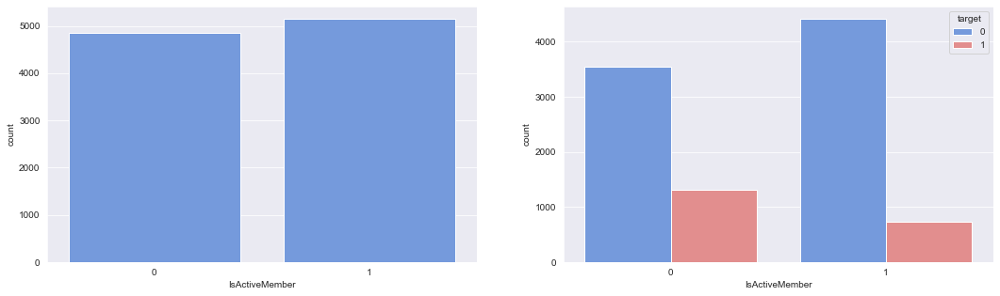

In [60]:
for col in discrete_features:
    print(col)
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.countplot(data=df, x=col,color='cornflowerblue')
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.countplot(data=df, x=col, hue="target",palette=['cornflowerblue','lightcoral'])
    plt.show()

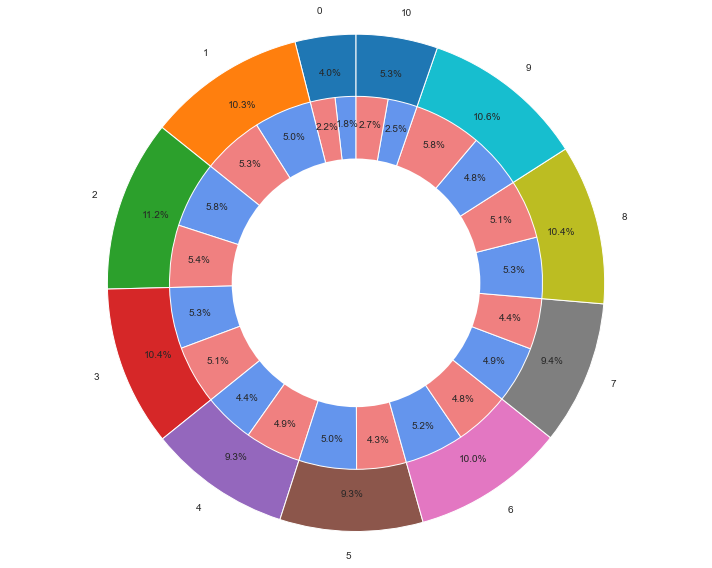

In [61]:
labels = train_df['Tenure'].value_counts().sort_index().index
sizes = train_df['Tenure'].value_counts().sort_index().values
labels_gender = [0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1,0,1]
sizes_gender = train_df.groupby(['Tenure','target'])['target'].count().values
colors_gender = ['cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue',
                 'lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

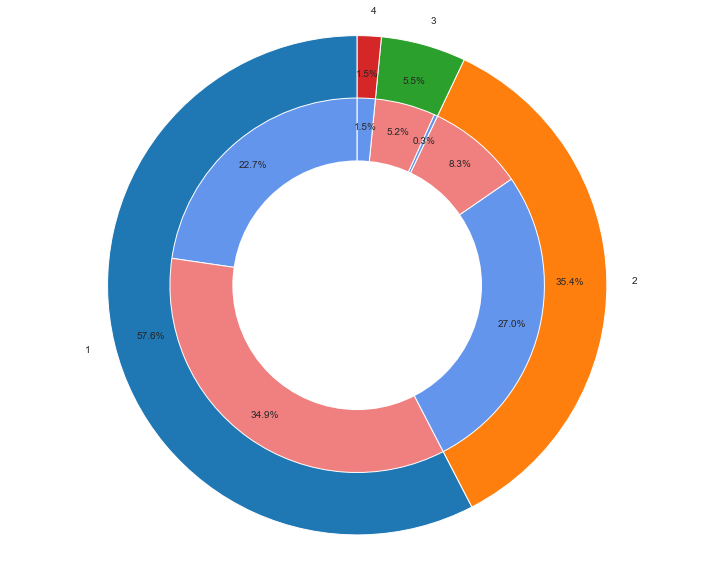

In [62]:
labels = train_df['NumOfProducts'].value_counts().sort_index().index
sizes = train_df['NumOfProducts'].value_counts().sort_index().values
labels_gender = [0,1,0,1,0,1,0,1]
sizes_gender = train_df.groupby(['NumOfProducts','target'])['target'].count().values
colors_gender = ['cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral','cornflowerblue','lightcoral']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

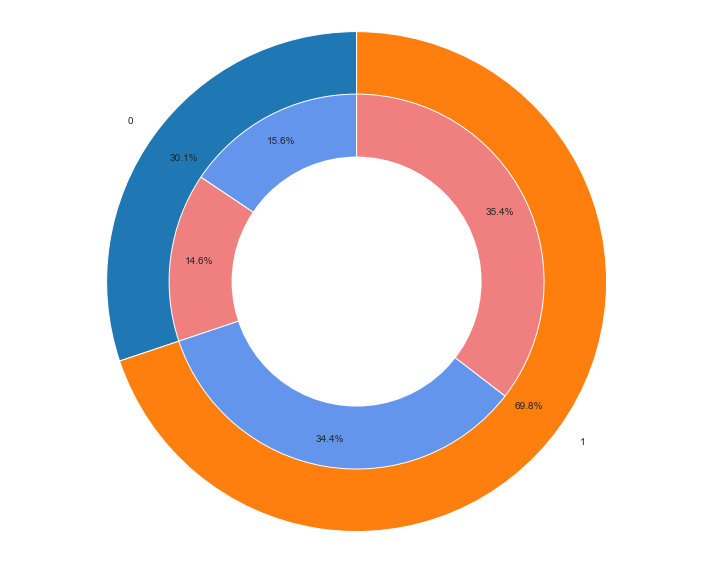

In [63]:
labels = train_df['HasCrCard'].value_counts().sort_index().index
sizes = train_df['HasCrCard'].value_counts().sort_index().values
labels_gender = [0,1,0,1]
sizes_gender = train_df.groupby(['HasCrCard','target'])['target'].count().values
colors_gender = ['cornflowerblue','lightcoral','cornflowerblue','lightcoral']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

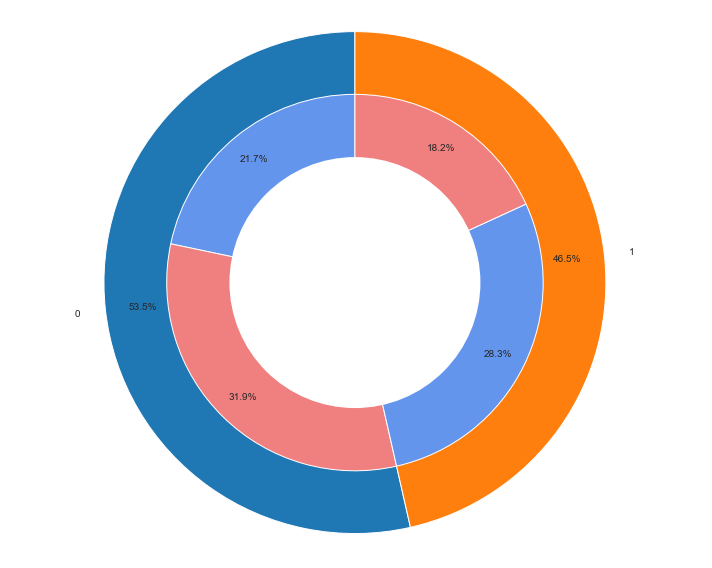

In [64]:
labels = train_df['IsActiveMember'].value_counts().sort_index().index
sizes = train_df['IsActiveMember'].value_counts().sort_index().values
labels_gender = [0,1,0,1]
sizes_gender = train_df.groupby(['IsActiveMember','target'])['target'].count().values
colors_gender = ['cornflowerblue','lightcoral','cornflowerblue','lightcoral']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

### Obersvations :
1. From above we can see that customers having 'NumOfProducts' 3 and 4 are leaving more this may be becoz they are old and just closing their accounts. and churn rate is more for cutomers having NumOfProducts 1 compared to 2
2. InActive customers are leaving more compared to Active customers.

In [65]:
discrete_features

['Tenure', 'NumOfProducts', 'HasCrCard', 'IsActiveMember']

Tenure


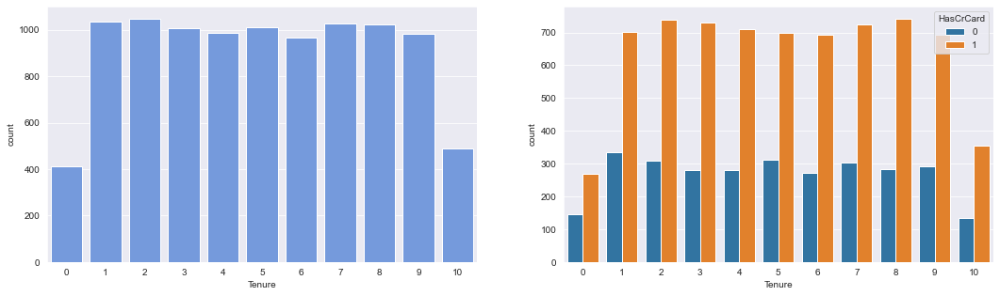

NumOfProducts


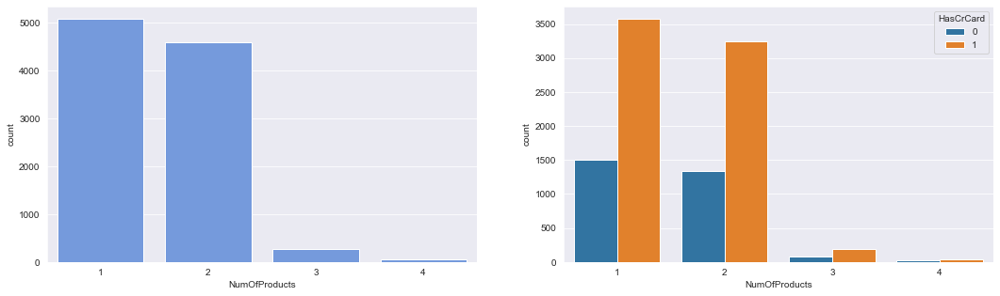

HasCrCard


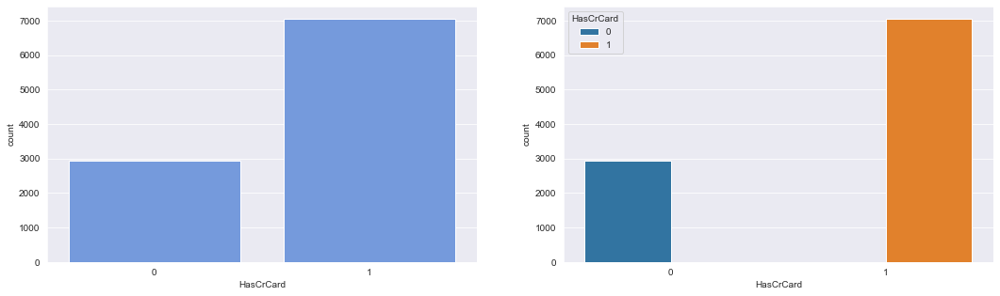

IsActiveMember


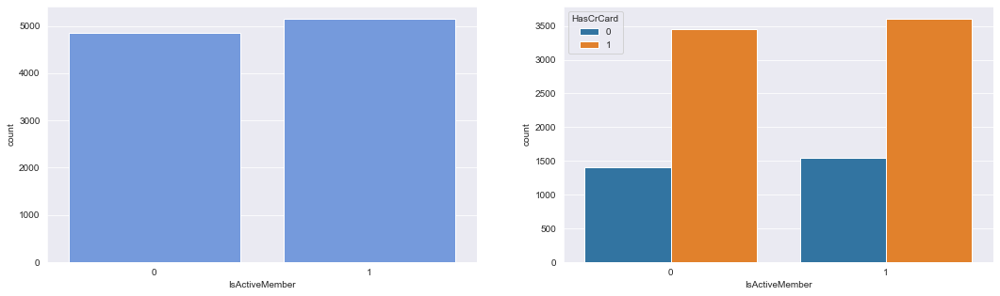

In [66]:
for col in discrete_features:
    print(col)
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.countplot(data=df, x=col,color='cornflowerblue')
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.countplot(data=df, x=col, hue="HasCrCard")
    plt.show()

Tenure


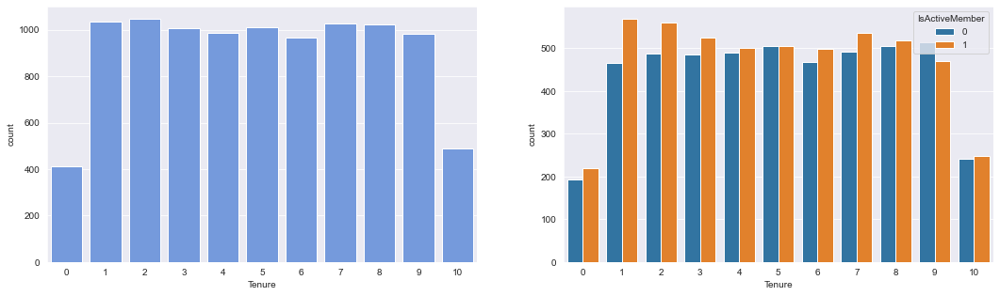

NumOfProducts


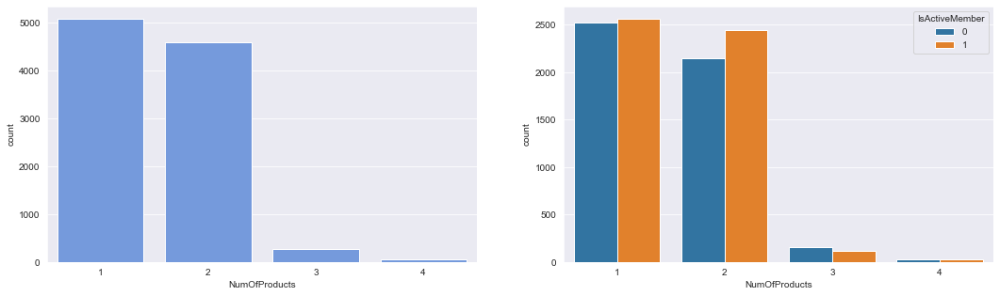

HasCrCard


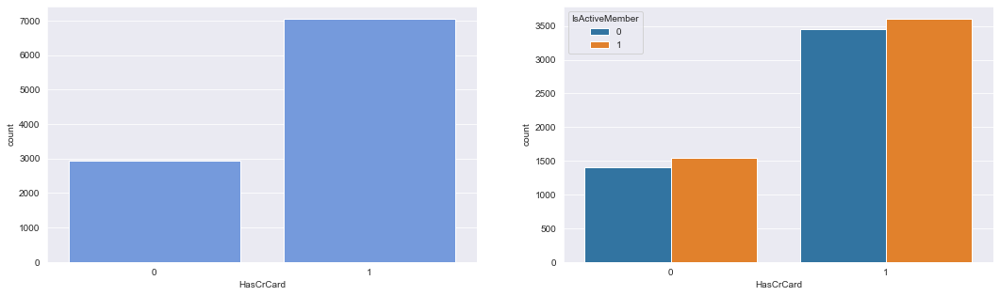

IsActiveMember


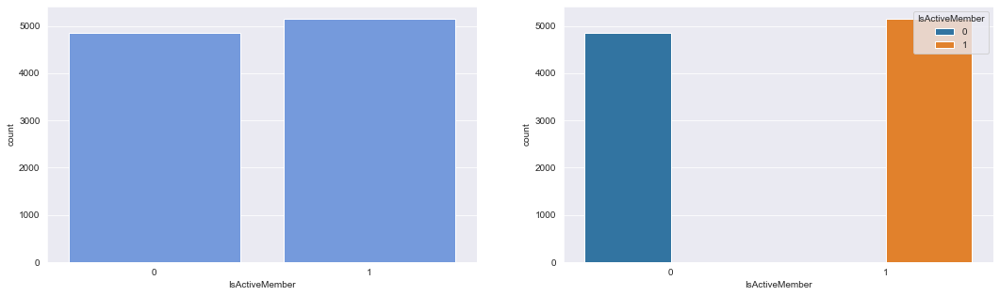

In [67]:
for col in discrete_features:
    print(col)
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.countplot(data=df, x=col,color='cornflowerblue')
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.countplot(data=df, x=col, hue="IsActiveMember")
    plt.show()

Tenure


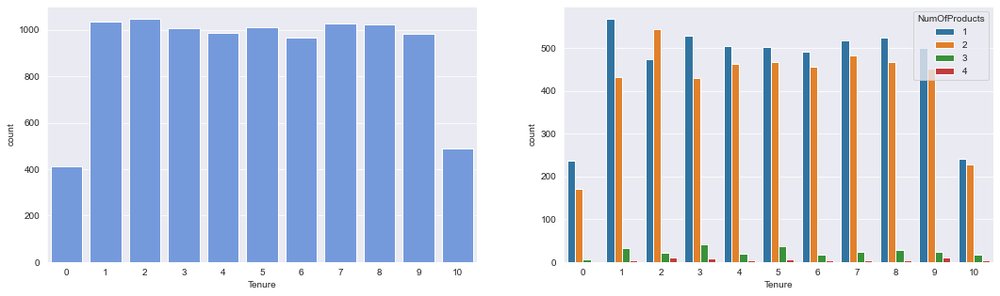

NumOfProducts


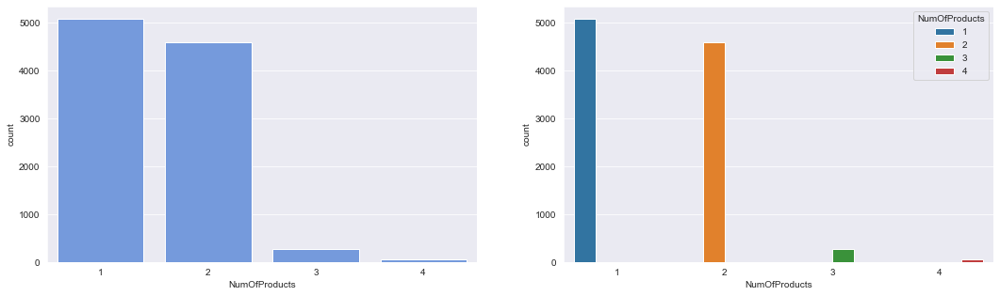

HasCrCard


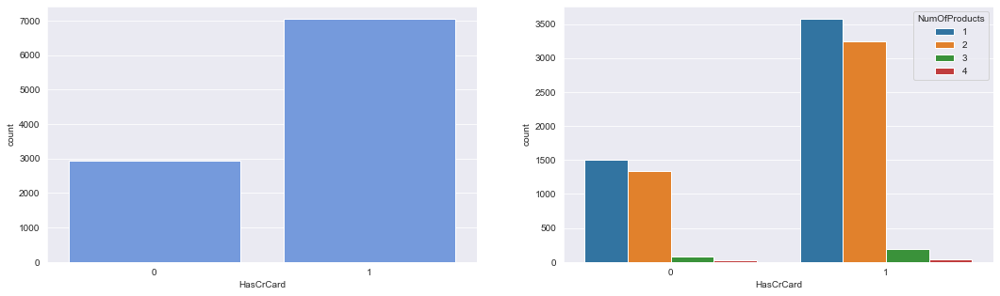

IsActiveMember


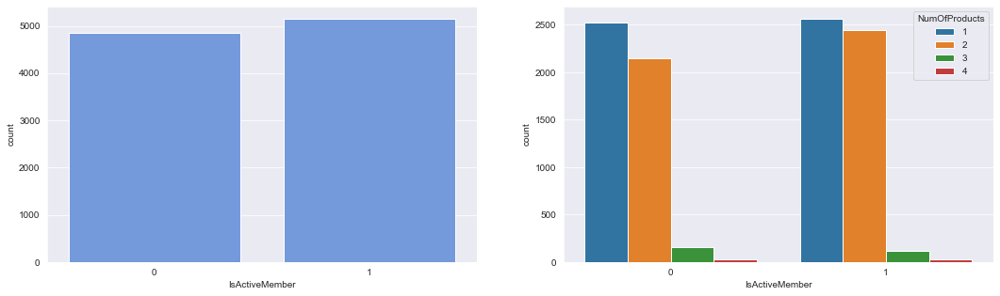

In [68]:
for col in discrete_features:
    print(col)
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.countplot(data=df, x=col,color='cornflowerblue')
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.countplot(data=df, x=col, hue="NumOfProducts")
    plt.show()

Tenure


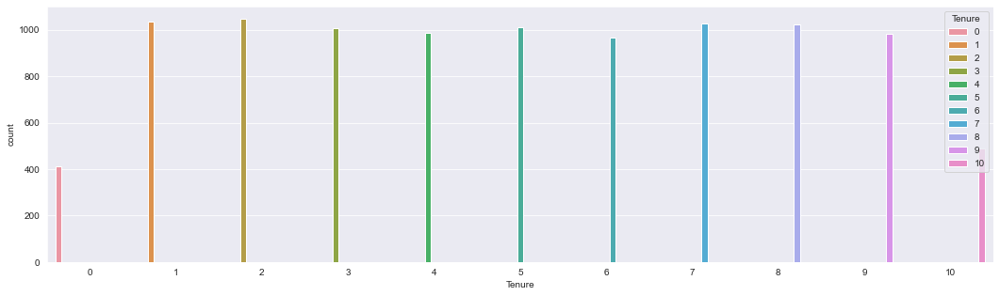

NumOfProducts


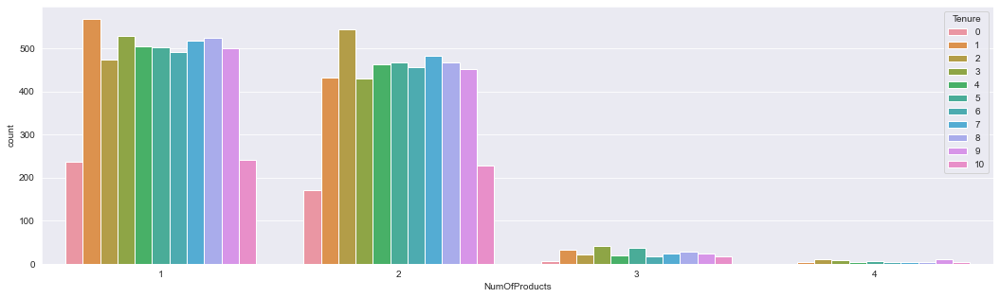

HasCrCard


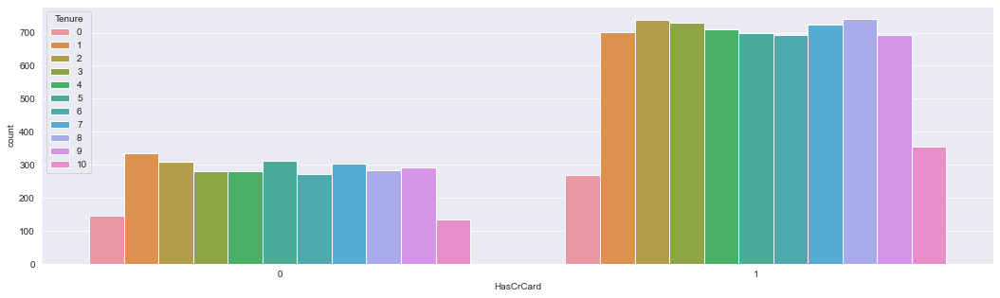

IsActiveMember


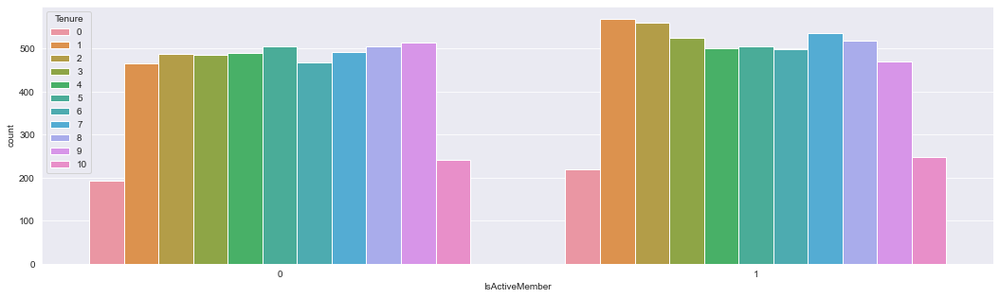

In [69]:
for col in discrete_features:
    print(col)
    plt.figure(figsize = (18,5))
    plt.xlabel(col)
    plt.ylabel('count')
    sns.countplot(data=df, x=col, hue="Tenure")
    plt.show()

In [70]:
continuous_features

['CreditScore', 'Age', 'Balance', 'EstimatedSalary']

In [71]:
discrete_features

['Tenure', 'NumOfProducts', 'HasCrCard', 'IsActiveMember']

CreditScore


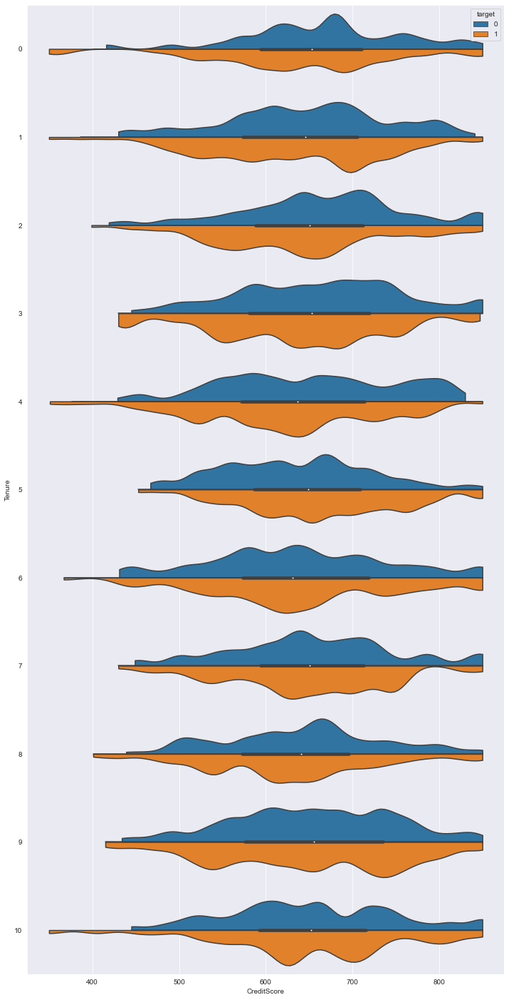

Age


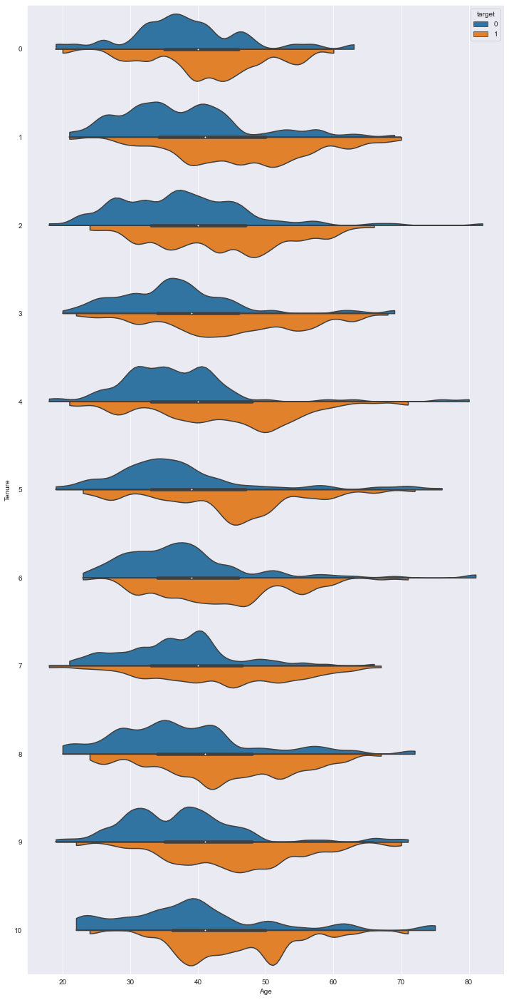

Balance


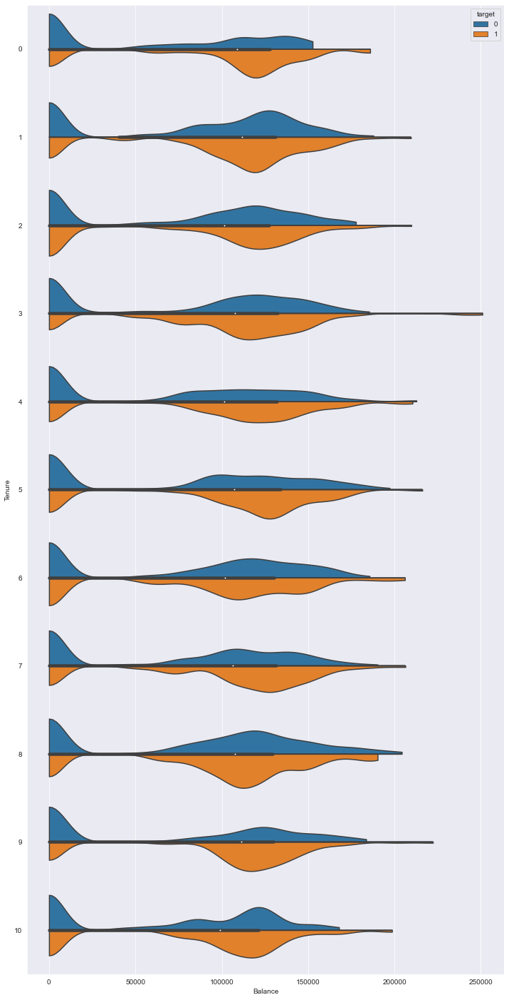

EstimatedSalary


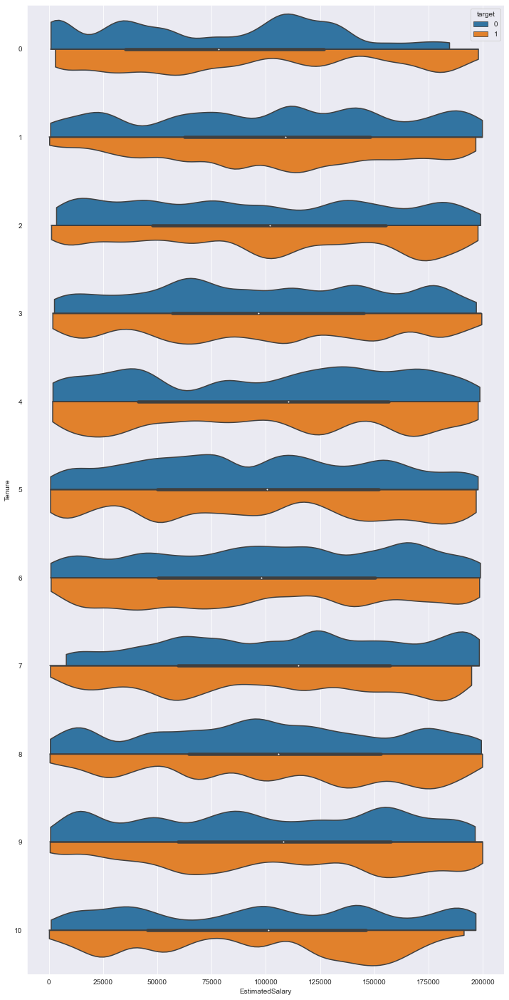

In [72]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,25))
    sns.violinplot(data=train_df, x=col, y="Tenure", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('Tenure')
    plt.show()

CreditScore


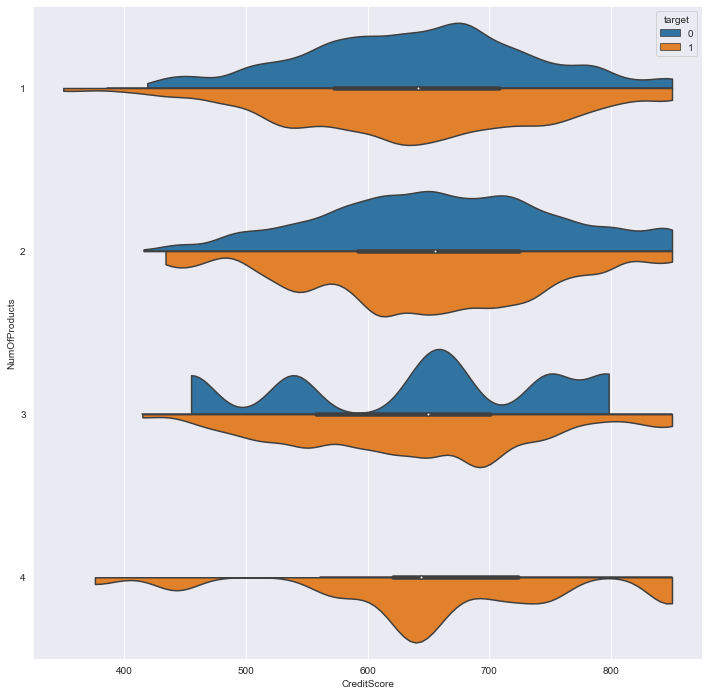

Age


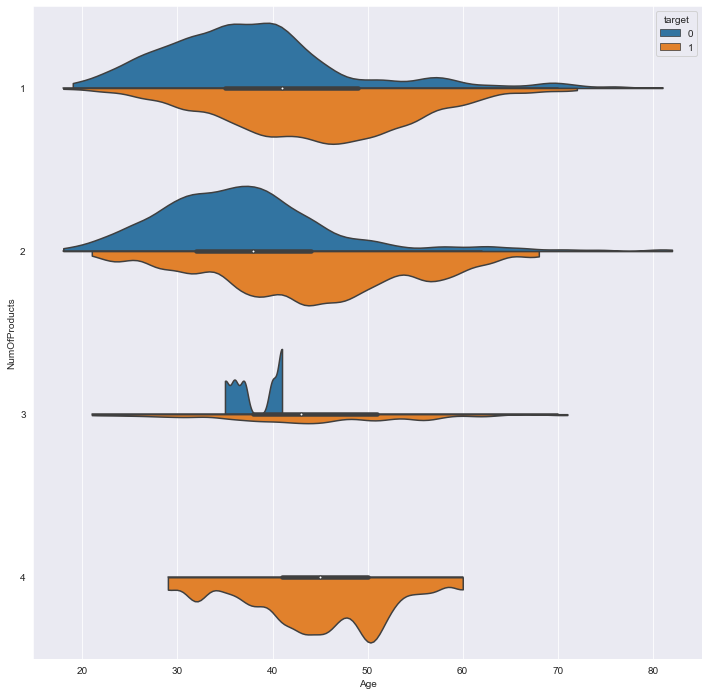

Balance


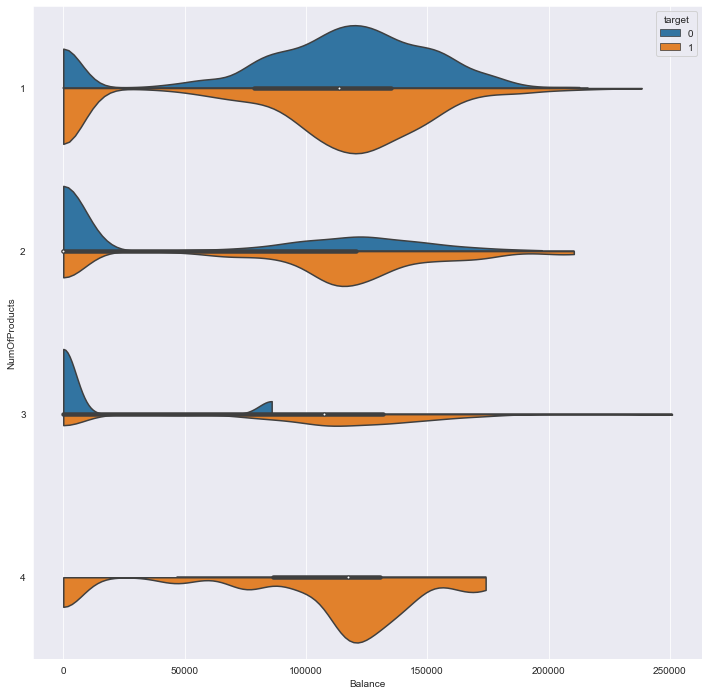

EstimatedSalary


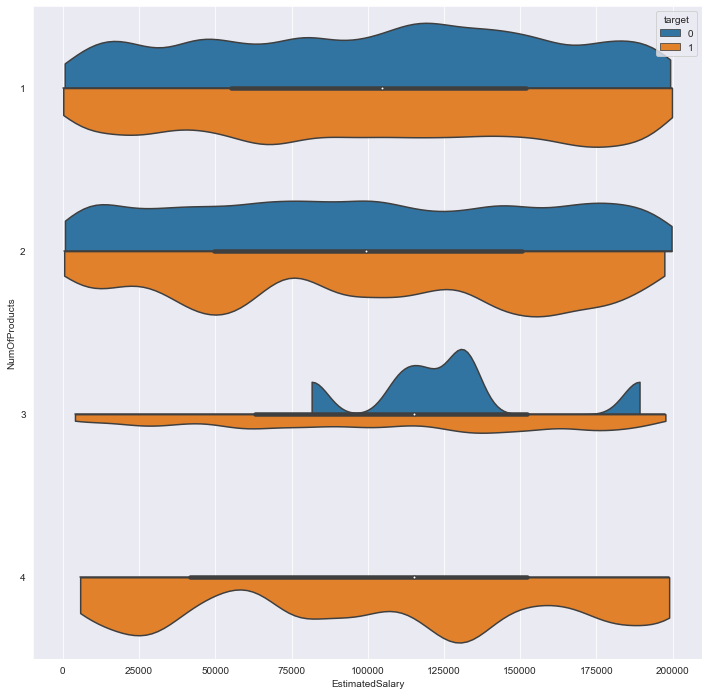

In [73]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,12))
    sns.violinplot(data=train_df, x=col, y="NumOfProducts", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('NumOfProducts')
    plt.show()

CreditScore


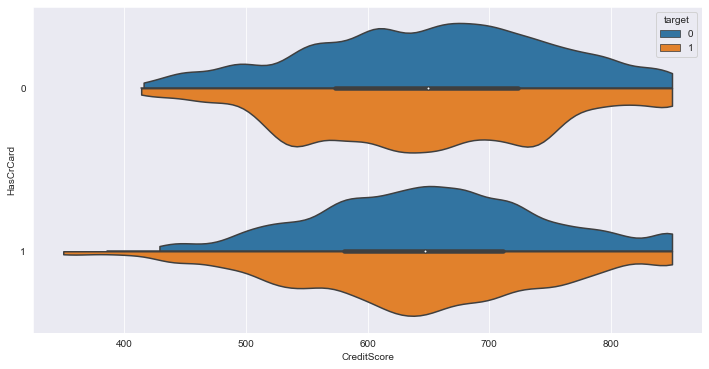

Age


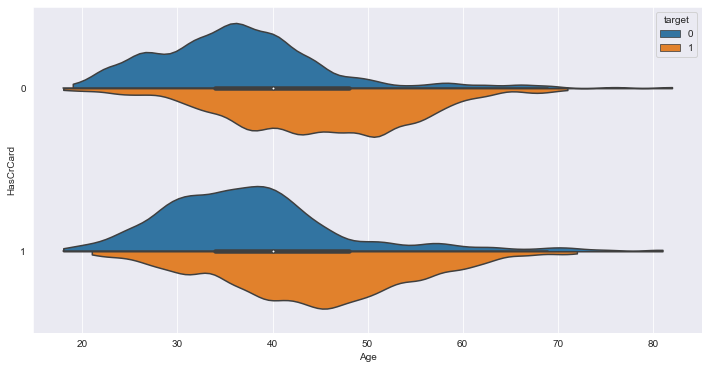

Balance


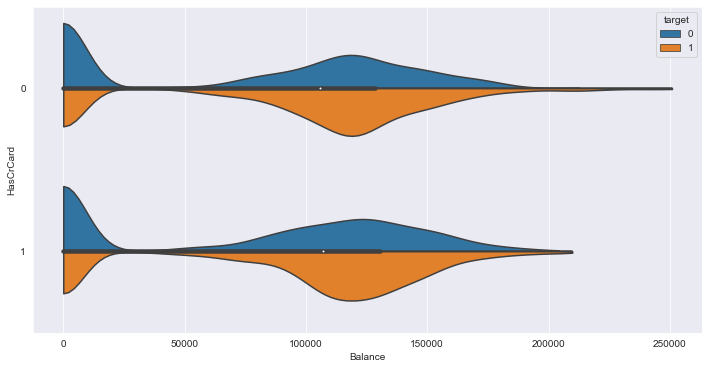

EstimatedSalary


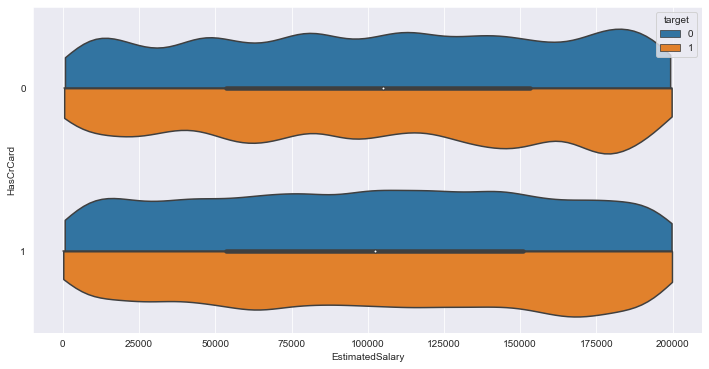

In [74]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,6))
    sns.violinplot(data=train_df, x=col, y="HasCrCard", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('HasCrCard')
    plt.show()

CreditScore


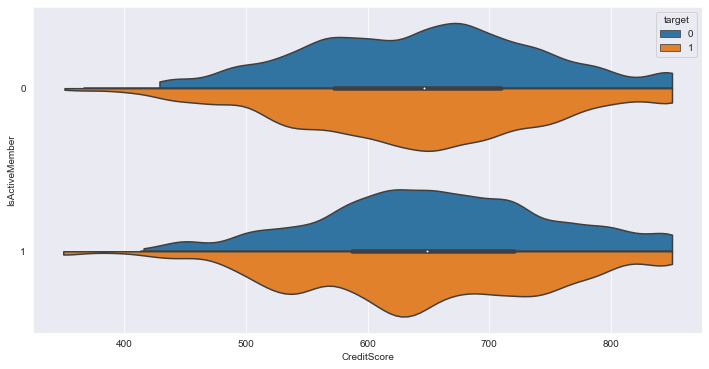

Age


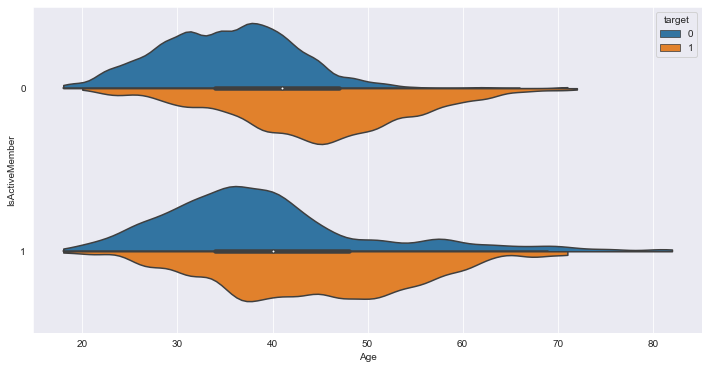

Balance


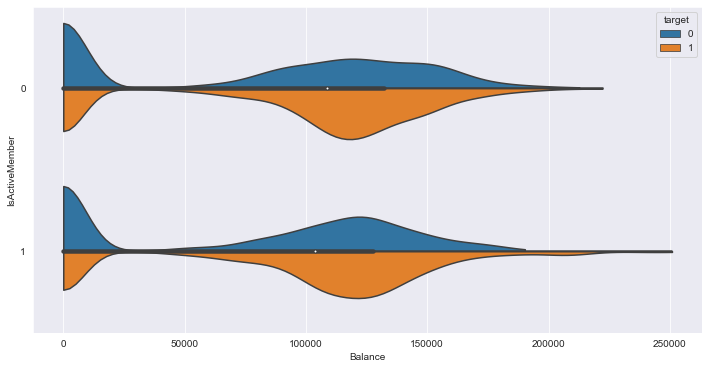

EstimatedSalary


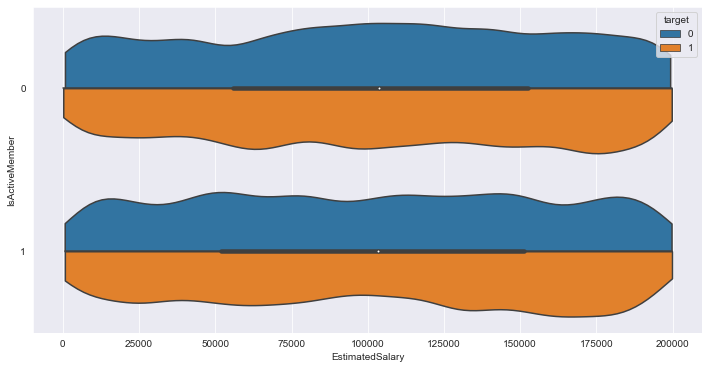

In [75]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,6))
    sns.violinplot(data=train_df, x=col, y="IsActiveMember", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('IsActiveMember')
    plt.show()

### Observation :

1. From the above Balance vs NumOfProducts we can observe that Customets having 2 and 3 products got less balance and more chance of leaving. Customers having 4 products are leaving more.

In [76]:
numerical_features

Index(['CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary', 'target'],
      dtype='object')

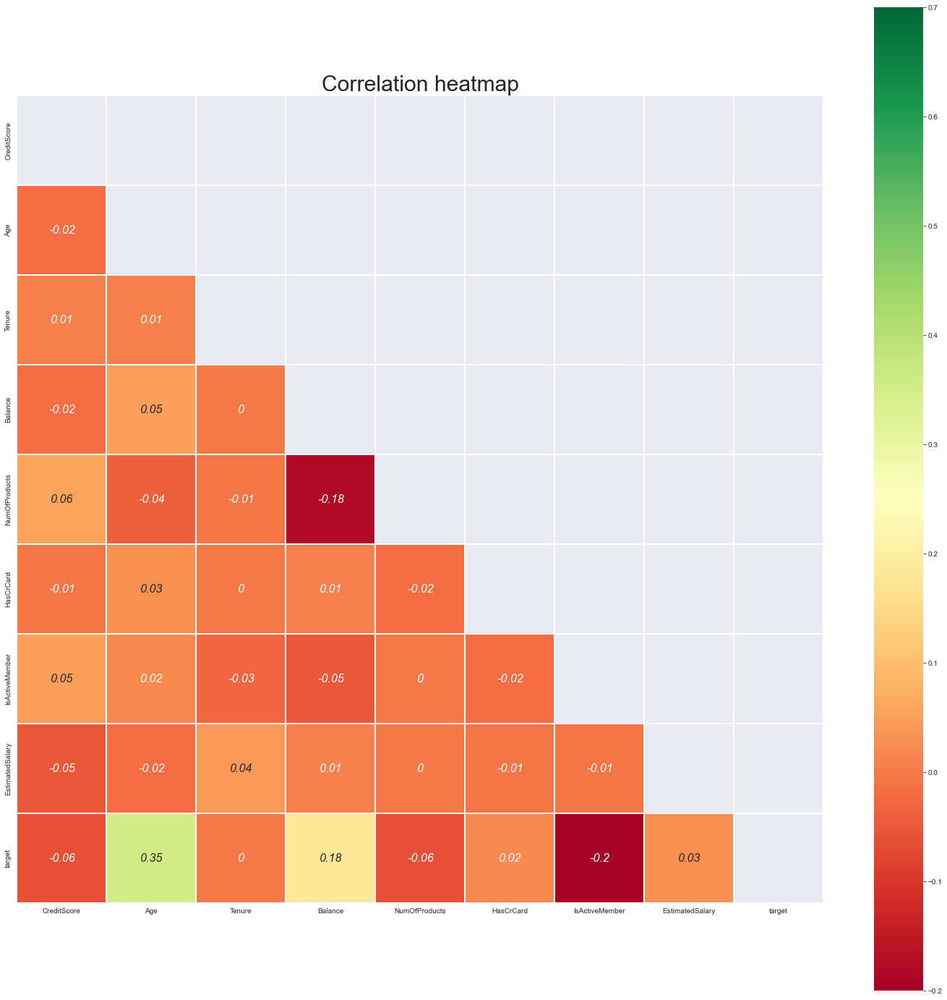

In [77]:
# Finds correlation between Independent and dependent attributes

mask = np.zeros_like(train_df[numerical_features].corr(),dtype = np.bool_)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize = (25,25))
plt.title('Correlation heatmap', fontsize = 30)

sns.heatmap(np.round_(train_df[numerical_features].corr(),decimals=2),cmap='RdYlGn',linewidths=0.25,square=True,annot=True,
            vmax=0.7,linecolor='w',annot_kws={'size':16,'style':'oblique'},mask=mask)

plt.show()

### Observation :

1. We can see there is positive correlation between 'Age' and 'target'
2. And there is slight -ve correlation between 'IsActiveMember' and 'target'

### Multicollinearity

4. there is slight negative correlation between ('NumOfProducts','Balance')

#### We need to be very careful with this Multicollinearity when using 'Linear ML Models'

## Categorical_features

### Univariate/Bivariate analysis

In [78]:
categorical_features

Index(['Geography', 'Gender'], dtype='object')

In [79]:
train_df[categorical_features].nunique().sort_values(ascending=False)

Geography    3
Gender       2
dtype: int64

Geography


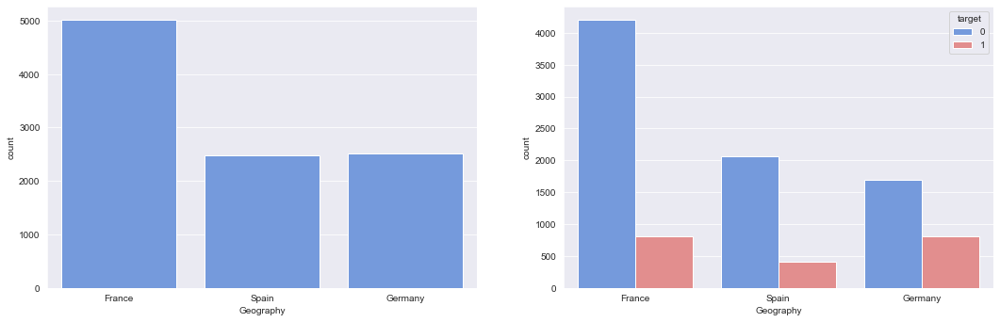

Gender


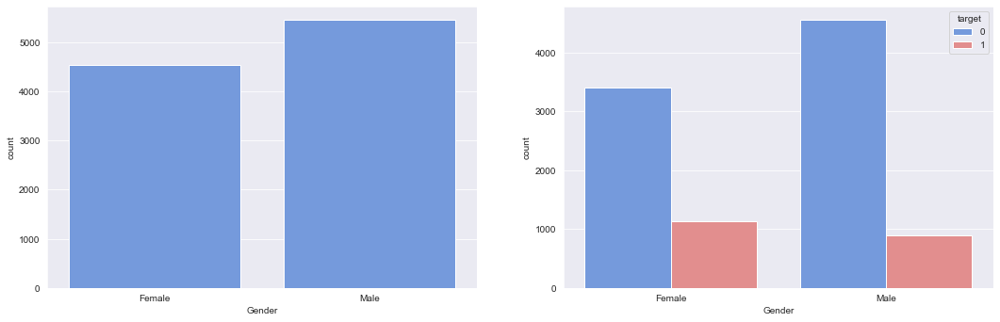

In [80]:
for col in categorical_features:
    print(col)
    plt.figure(figsize = (18,5.5))
    plt.subplot(1, 2, 1)
    sns.countplot(data=df, x=col,color='cornflowerblue')
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.countplot(data=df, x=col, hue="target",palette=['cornflowerblue','lightcoral'])
    plt.show()

In [81]:
def plot_categorical_features(train_df,col):
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    
    plt.pie(train_df[col].value_counts().values, labels=train_df[col].value_counts().index,
        autopct='%1.1f%%', pctdistance=0.85)
    centre_circle = plt.Circle((0, 0), 0.70, fc='white')
    fig = plt.gcf()
    fig.gca().add_artist(centre_circle)
    
    plt.subplot(1, 2, 2)
    sns.countplot(data=df, x=col,color='cornflowerblue')
    plt.show()

Geography
no.of nulls : 0
% of nulls : 0.0


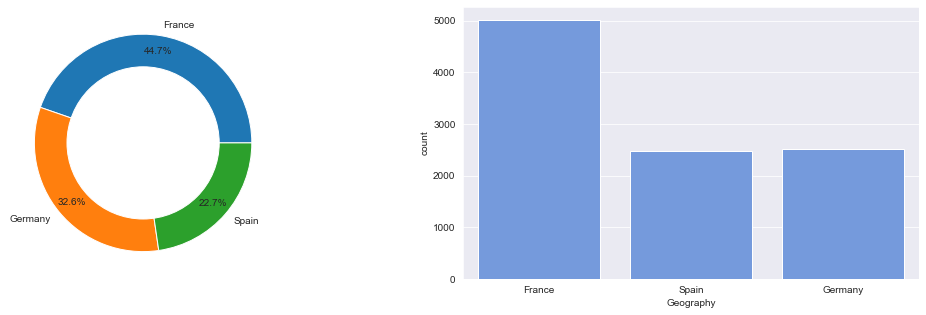

Gender
no.of nulls : 0
% of nulls : 0.0


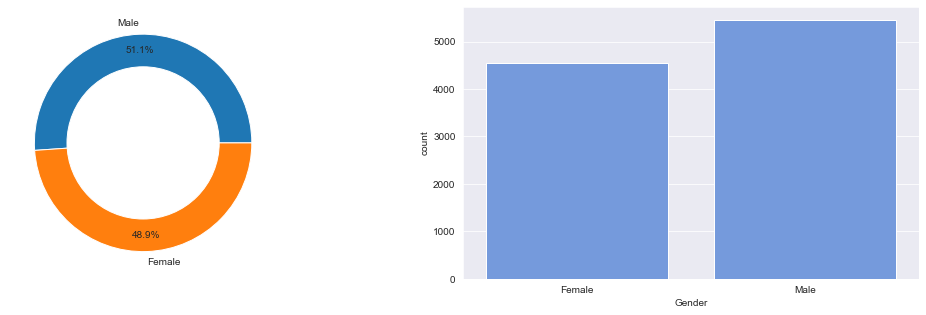

In [82]:
for col in categorical_features:
    print(col)
    print('no.of nulls :',train_df[col].isna().sum())
    print('% of nulls :',np.round_(train_df[col].isna().sum()/len(train_df)*100,decimals=2))
    plot_categorical_features(train_df,col)

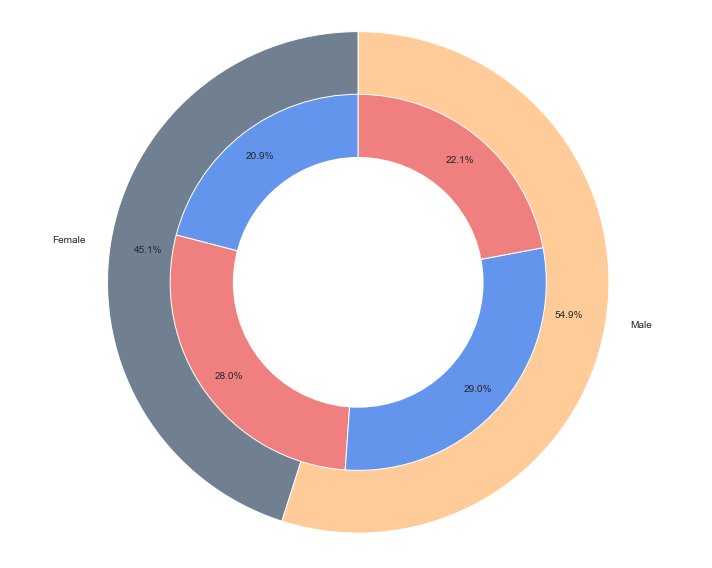

In [83]:
labels = ['Female','Male']
sizes = ['4057','4943']
labels_gender = [0,1,0,1]
sizes_gender = train_df.groupby(['Gender','target'])['target'].count().values
colors = ['slategrey', '#ffcc99']
colors_gender = ['cornflowerblue','lightcoral','cornflowerblue','lightcoral']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, colors=colors, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

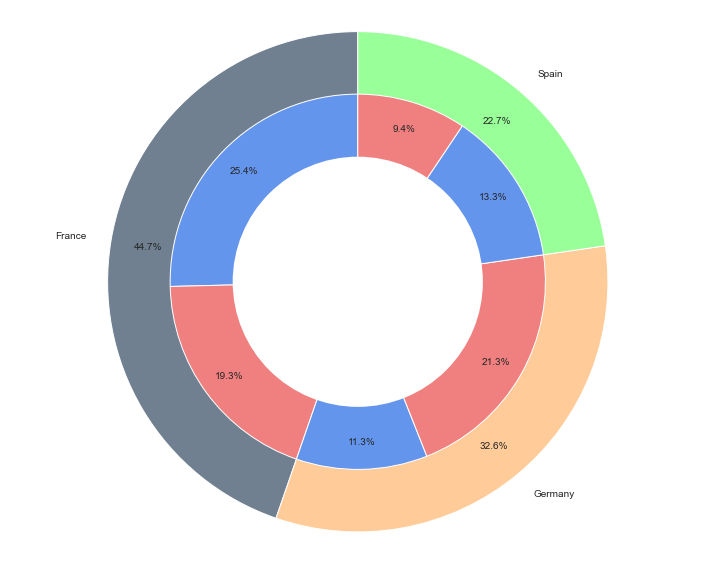

In [84]:
labels = train_df['Geography'].value_counts().index
sizes = train_df['Geography'].value_counts().values
labels_gender = [0,1,0,1,0,1]
sizes_gender = train_df.groupby(['Geography','target'])['target'].count().values
colors = ['slategrey', '#ffcc99', '#99ff99']
colors_gender = ['cornflowerblue','lightcoral','cornflowerblue','lightcoral', 'cornflowerblue','lightcoral']
 
# Plot
plt.figure(figsize = (10,8))
plt.pie(sizes, labels=labels, colors=colors, startangle=90,frame=True,autopct='%1.1f%%', pctdistance=0.85)
plt.pie(sizes_gender,colors=colors_gender,radius=0.75,startangle=90,autopct='%1.1f%%', pctdistance=0.85)
centre_circle = plt.Circle((0,0),0.5,color='black', fc='white',linewidth=0)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
 
plt.axis('equal')
plt.tight_layout()
plt.show()

### Observations :
1. We can observe that 50% of the customers from France and 25% from Germany and another 25% from Spain
2. Customers from Germany are leaving more
3. Female Customers are leaving more.

In [85]:
categorical_features

Index(['Geography', 'Gender'], dtype='object')

CreditScore


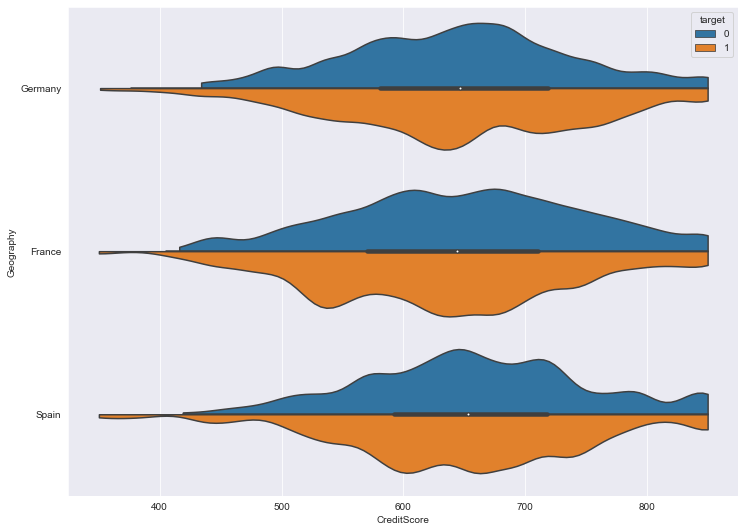

Age


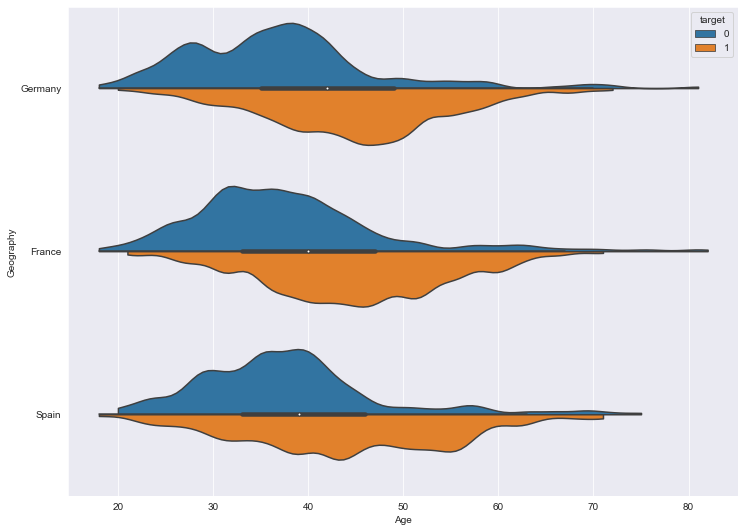

Balance


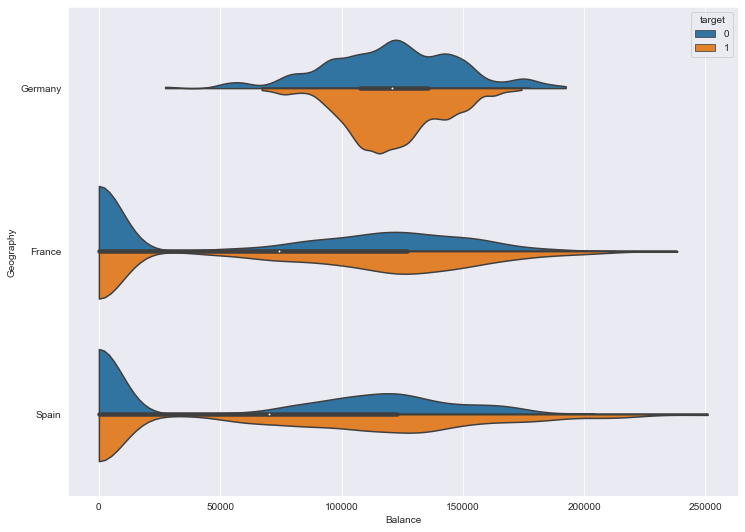

EstimatedSalary


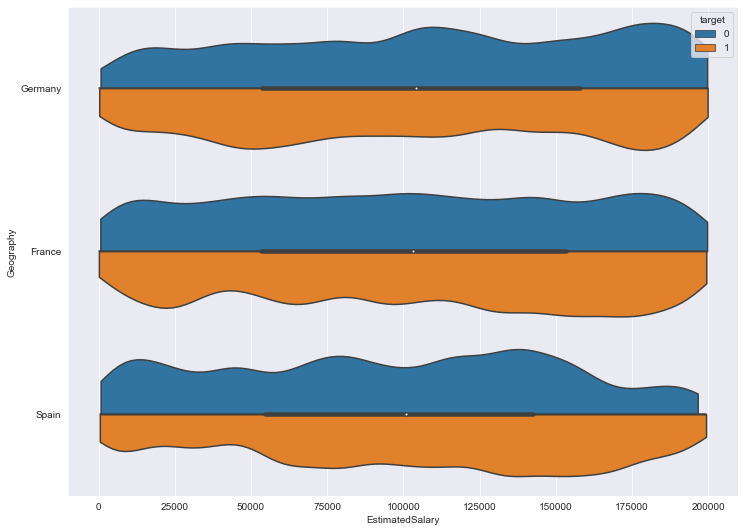

In [86]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,9))
    sns.violinplot(data=train_df, x=col, y="Geography", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('Geography')
    plt.show()

CreditScore


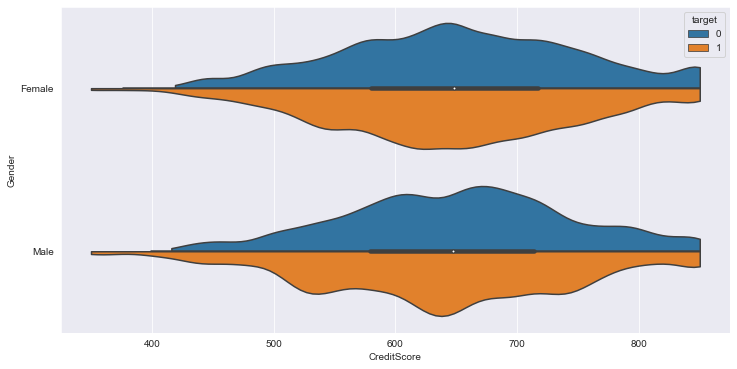

Age


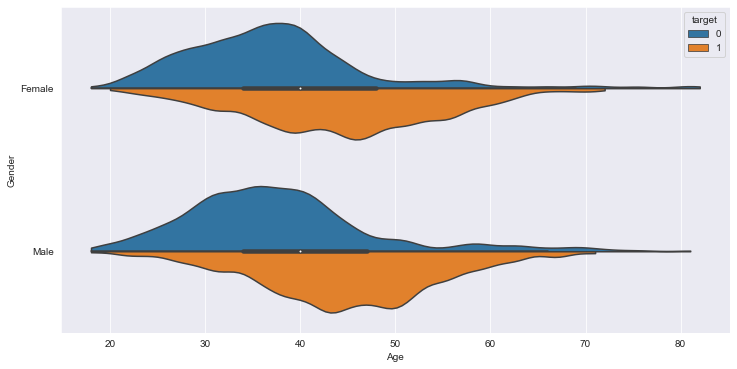

Balance


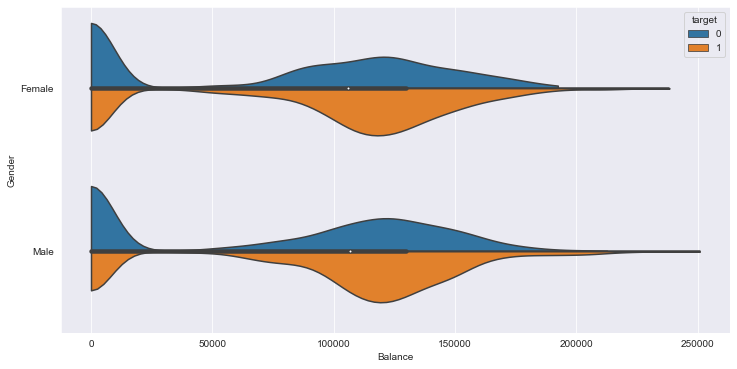

EstimatedSalary


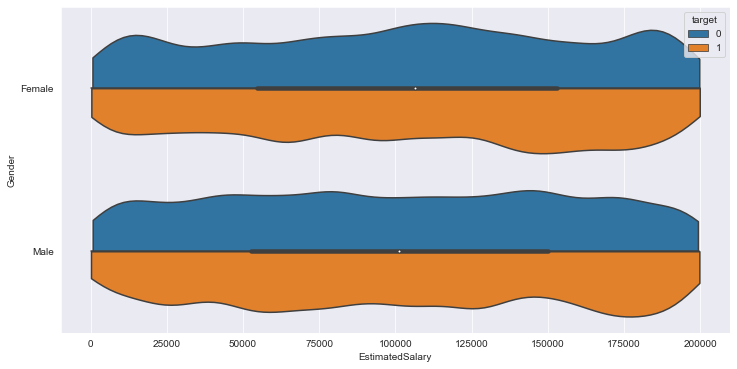

In [87]:
for col in continuous_features:
    print(col)
    plt.figure(figsize = (12,6))
    sns.violinplot(data=train_df, x=col, y="Gender", hue="target", split=True,orient='h', bw=.15,cut=0)
    plt.xlabel(col)
    plt.ylabel('Gender')
    plt.show()

In [88]:
categorical_features

Index(['Geography', 'Gender'], dtype='object')

In [89]:
discrete_features

['Tenure', 'NumOfProducts', 'HasCrCard', 'IsActiveMember']

Tenure


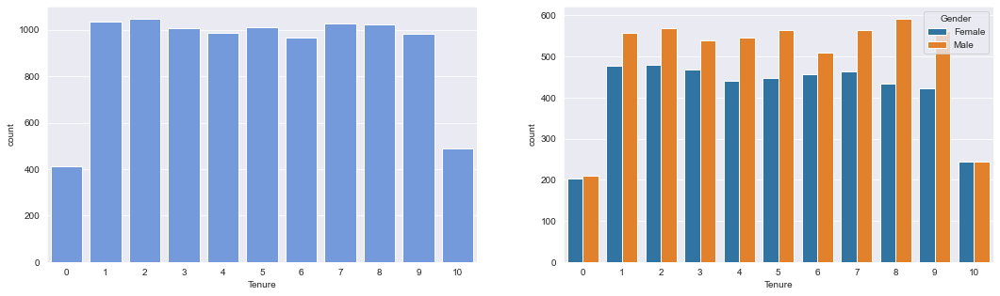

NumOfProducts


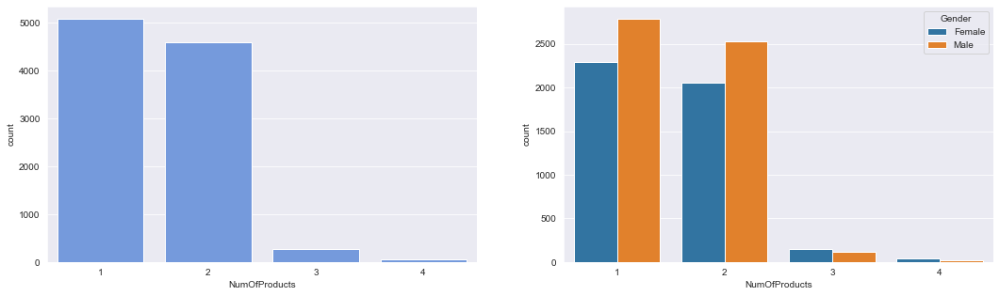

HasCrCard


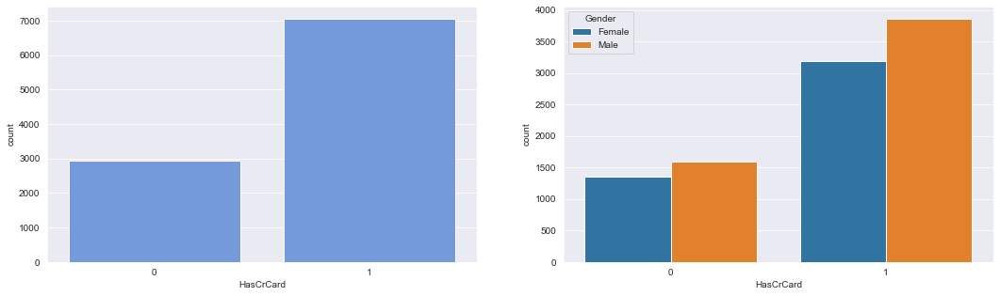

IsActiveMember


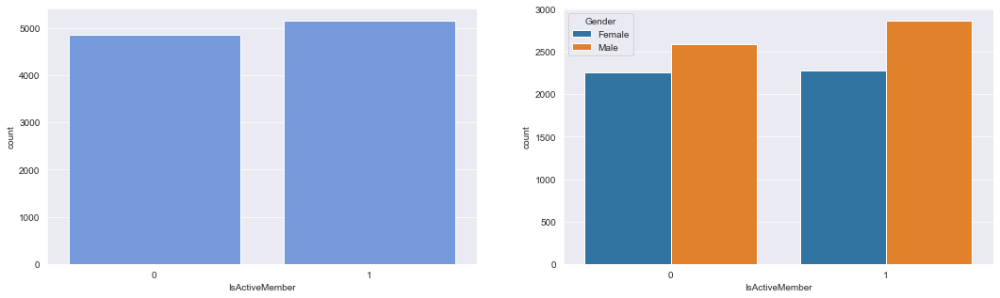

In [90]:
for col in discrete_features:
    print(col)
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.countplot(data=df, x=col,color='cornflowerblue')
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.countplot(data=df, x=col, hue="Gender")
    plt.show()

Tenure


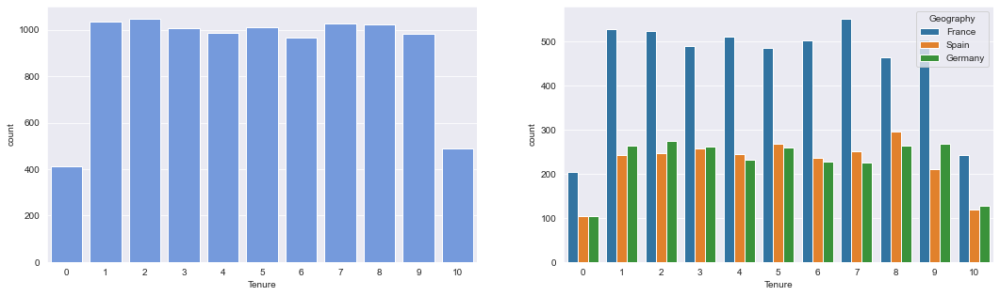

NumOfProducts


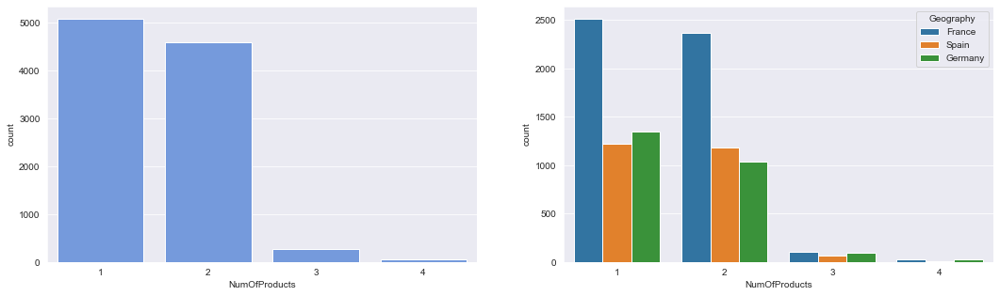

HasCrCard


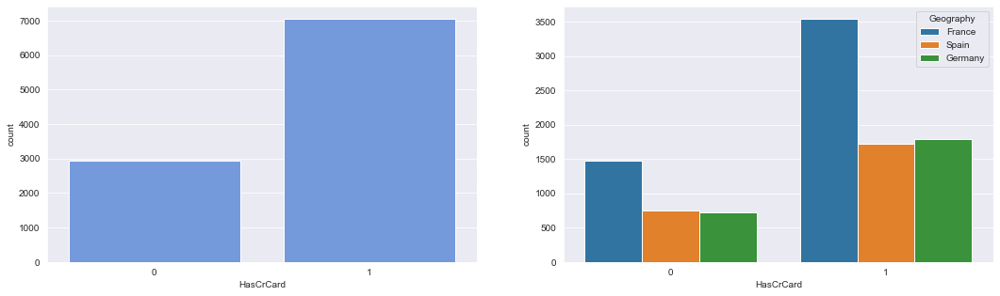

IsActiveMember


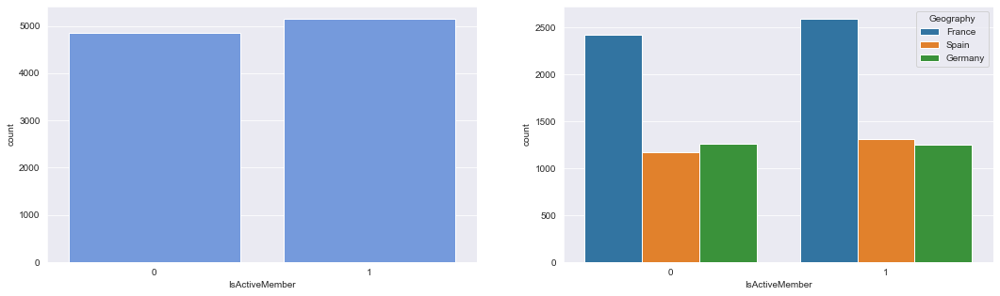

In [91]:
for col in discrete_features:
    print(col)
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.countplot(data=df, x=col,color='cornflowerblue')
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.countplot(data=df, x=col, hue="Geography")
    plt.show()

In [92]:
train_df.naakgkug()

AttributeError: 'DataFrame' object has no attribute 'naakgkug'

In [93]:
train_df

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,target
0,432,Germany,Female,45,3,110219.14,1,1,0,43046.70,1
1,763,Germany,Male,31,7,143966.30,2,1,1,140262.96,1
2,681,France,Male,32,3,148884.47,2,1,1,90967.37,0
3,627,Germany,Female,35,2,137852.96,1,1,1,172269.21,1
4,631,Spain,Female,41,0,0.00,1,0,0,87959.83,0
...,...,...,...,...,...,...,...,...,...,...,...
1995,548,France,Female,29,4,0.00,2,0,1,48673.18,0
1996,641,France,Female,40,7,0.00,1,1,0,126996.67,0
1997,570,Germany,Female,57,5,86568.75,1,0,1,103660.31,0
1998,778,France,Male,44,8,123863.64,1,1,0,144494.94,0


In [94]:
total_train_df

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,target
0,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0
...,...,...,...,...,...,...,...,...,...,...,...
8995,771,France,Male,39,5,0.00,2,1,0,96270.64,0
8996,516,France,Male,35,10,57369.61,1,1,1,101699.77,0
8997,709,France,Female,36,7,0.00,1,0,1,42085.58,1
8998,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1


In [95]:
val_df

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,target
0,729,France,Male,39,4,121404.64,1,1,1,159618.17,0
1,738,Germany,Male,58,2,133745.44,4,1,0,28373.86,1
2,619,Germany,Female,28,6,99152.73,2,1,0,48475.12,0
3,650,Germany,Female,25,2,114330.95,1,1,1,25325.07,0
4,649,Germany,Male,70,9,116854.71,2,0,1,107125.79,0
...,...,...,...,...,...,...,...,...,...,...,...
495,770,France,Male,31,3,155047.56,2,1,1,186064.34,0
496,666,Germany,Female,50,7,109062.28,1,1,1,140136.10,1
497,494,France,Female,35,9,112727.06,2,1,0,183752.91,0
498,612,France,Female,63,2,126473.33,1,0,1,147545.65,0


In [96]:
test_df

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,target
0,769,Spain,Male,38,6,0.00,2,0,0,104393.78,0
1,534,France,Female,34,7,121551.58,2,1,1,70179.00,0
2,729,France,Female,34,9,132121.71,1,0,1,105409.31,0
3,619,France,Female,30,7,70729.17,1,1,1,160948.87,0
4,610,France,Male,36,4,129440.30,2,1,0,102638.35,0
...,...,...,...,...,...,...,...,...,...,...,...
495,697,Germany,Female,74,3,108071.36,2,1,1,16445.79,0
496,556,Spain,Male,46,3,131764.96,1,1,1,108500.66,1
497,689,France,Male,22,4,136444.25,1,1,0,51980.25,1
498,617,France,Female,24,4,137295.19,2,1,1,91195.12,0


In [97]:
# writing the train_df to a file

train_df.to_csv('../Data/Bank_Customers_Churn_Prediction/train_df.csv',index=False)

In [98]:
# writing the train_df to a file

total_train_df.to_csv('../Data/Bank_Customers_Churn_Prediction/total_train_df.csv',index=False)

In [99]:
# writing the val_df to a file

val_df.to_csv('../Data/Bank_Customers_Churn_Prediction/val_df.csv',index=False)

In [100]:
# writing the test_df to a file

test_df.to_csv('../Data/Bank_Customers_Churn_Prediction/test_df.csv',index=False)

# Feature Engineering

In [101]:
# Preprocessing imports
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import FunctionTransformer,QuantileTransformer,PowerTransformer
from sklearn.preprocessing import OneHotEncoder,OrdinalEncoder,LabelEncoder
from sklearn.preprocessing import StandardScaler,RobustScaler,MinMaxScaler

# Models
from sklearn.linear_model import LogisticRegression,SGDClassifier,RidgeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB,BernoulliNB,CategoricalNB,MultinomialNB
from sklearn.tree import DecisionTreeClassifier,ExtraTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier,RandomForestClassifier,IsolationForest,ExtraTreesClassifier,AdaBoostClassifier
from xgboost import XGBClassifier,XGBRFClassifier

# Cross-validation
from sklearn.model_selection import cross_val_score

# Hyperparameter tuning
from sklearn.model_selection import GridSearchCV

# Pipeline
from sklearn.pipeline import Pipeline,make_pipeline
from sklearn.compose import ColumnTransformer,TransformedTargetRegressor

# Metrics
from sklearn.metrics import accuracy_score,classification_report,precision_score,recall_score,f1_score,precision_recall_curve

from imblearn.over_sampling import SMOTE

# Visualize Pipeline
from sklearn import set_config

# PCA - for dimensionality reduction
from sklearn.decomposition import PCA

# to calculate VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

# To calculate the Verinces of each feature
from sklearn.feature_selection import VarianceThreshold

# Mutual Information for classification - For Feature Selection
from sklearn.feature_selection import mutual_info_classif

In [102]:
train_df = pd.read_csv('../Data/Bank_Customers_Churn_Prediction/train_df.csv')
X_train = train_df.drop('target',axis=1)
y_train = train_df['target']

In [103]:
val_df = pd.read_csv('../Data/Bank_Customers_Churn_Prediction/val_df.csv')
X_val = val_df.drop('target',axis=1)
y_val = val_df['target']

In [104]:
test_df = pd.read_csv('../Data/Bank_Customers_Churn_Prediction/test_df.csv')
X_test = test_df.drop('target',axis=1)
y_test = test_df['target']

In [105]:
numerical_features = ['CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard','IsActiveMember',
                      'EstimatedSalary']
numerical_features

['CreditScore',
 'Age',
 'Tenure',
 'Balance',
 'NumOfProducts',
 'HasCrCard',
 'IsActiveMember',
 'EstimatedSalary']

In [106]:
categorical_features

Index(['Geography', 'Gender'], dtype='object')

In [107]:
X_train

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary
0,432,Germany,Female,45,3,110219.14,1,1,0,43046.70
1,763,Germany,Male,31,7,143966.30,2,1,1,140262.96
2,681,France,Male,32,3,148884.47,2,1,1,90967.37
3,627,Germany,Female,35,2,137852.96,1,1,1,172269.21
4,631,Spain,Female,41,0,0.00,1,0,0,87959.83
...,...,...,...,...,...,...,...,...,...,...
1995,548,France,Female,29,4,0.00,2,0,1,48673.18
1996,641,France,Female,40,7,0.00,1,1,0,126996.67
1997,570,Germany,Female,57,5,86568.75,1,0,1,103660.31
1998,778,France,Male,44,8,123863.64,1,1,0,144494.94


In [108]:
y_train

0       1
1       1
2       0
3       1
4       0
       ..
1995    0
1996    0
1997    0
1998    0
1999    1
Name: target, Length: 2000, dtype: int64

In [109]:
X_val

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary
0,729,France,Male,39,4,121404.64,1,1,1,159618.17
1,738,Germany,Male,58,2,133745.44,4,1,0,28373.86
2,619,Germany,Female,28,6,99152.73,2,1,0,48475.12
3,650,Germany,Female,25,2,114330.95,1,1,1,25325.07
4,649,Germany,Male,70,9,116854.71,2,0,1,107125.79
...,...,...,...,...,...,...,...,...,...,...
495,770,France,Male,31,3,155047.56,2,1,1,186064.34
496,666,Germany,Female,50,7,109062.28,1,1,1,140136.10
497,494,France,Female,35,9,112727.06,2,1,0,183752.91
498,612,France,Female,63,2,126473.33,1,0,1,147545.65


In [110]:
y_val

0      0
1      1
2      0
3      0
4      0
      ..
495    0
496    1
497    0
498    0
499    0
Name: target, Length: 500, dtype: int64

In [111]:
X_test

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary
0,769,Spain,Male,38,6,0.00,2,0,0,104393.78
1,534,France,Female,34,7,121551.58,2,1,1,70179.00
2,729,France,Female,34,9,132121.71,1,0,1,105409.31
3,619,France,Female,30,7,70729.17,1,1,1,160948.87
4,610,France,Male,36,4,129440.30,2,1,0,102638.35
...,...,...,...,...,...,...,...,...,...,...
495,697,Germany,Female,74,3,108071.36,2,1,1,16445.79
496,556,Spain,Male,46,3,131764.96,1,1,1,108500.66
497,689,France,Male,22,4,136444.25,1,1,0,51980.25
498,617,France,Female,24,4,137295.19,2,1,1,91195.12


In [112]:
y_test

0      0
1      0
2      0
3      0
4      0
      ..
495    0
496    1
497    1
498    0
499    1
Name: target, Length: 500, dtype: int64

In [113]:
len(numerical_features)

8

In [114]:
len(categorical_features)

2

### Building preprocessing pipeline

In [115]:
numeric_processor=Pipeline([("imputation_mean",SimpleImputer(strategy='median',add_indicator=True)),
                           ("quantiletransformer",QuantileTransformer(output_distribution='normal'))])

categorical_processor=Pipeline([("imputation_consatnt",SimpleImputer(fill_value="missing",strategy="constant")),
                                ("onehotencoder",OneHotEncoder(handle_unknown='ignore',sparse_output=False,min_frequency=0.01,max_categories=15))])

preprocessor=ColumnTransformer([("numeric_processor",numeric_processor,numerical_features),
                               ("categorical_processor",categorical_processor,categorical_features)])

final_pipe=Pipeline([("preprocessor",preprocessor),
                     ("scaler",RobustScaler())])

In [116]:
final_pipe

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numeric_processor',
                                                  Pipeline(steps=[('imputation_mean',
                                                                   SimpleImputer(add_indicator=True,
                                                                                 strategy='median')),
                                                                  ('quantiletransformer',
                                                                   QuantileTransformer(output_distribution='normal'))]),
                                                  ['CreditScore', 'Age',
                                                   'Tenure', 'Balance',
                                                   'NumOfProducts', 'HasCrCard',
                                                   'IsActiveMember',
                                                   'EstimatedSalary']),
                                                 ('categorical_processor',
                                                  Pipeline(steps=[('imputation_consatnt',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 max_categories=15,
                                                                                 min_frequency=0.01,
                                                                                 sparse_output=False))]),
                                                  Index(['Geography', 'Gender'], dtype='object'))])),
                ('scaler', RobustScaler())])

In [117]:
X_train_FE = pd.DataFrame(final_pipe.fit_transform(X_train),columns=final_pipe.get_feature_names_out(X_train.columns))

In [118]:
X_val_FE = pd.DataFrame(final_pipe.transform(X_val),columns=final_pipe.get_feature_names_out(X_val.columns))

In [119]:
X_test_FE = pd.DataFrame(final_pipe.transform(X_test),columns=final_pipe.get_feature_names_out(X_test.columns))

In [120]:
X_train_FE

,numeric_processor__CreditScore,numeric_processor__Age,numeric_processor__Tenure,numeric_processor__Balance,numeric_processor__NumOfProducts,numeric_processor__HasCrCard,numeric_processor__IsActiveMember,numeric_processor__EstimatedSalary,categorical_processor__Geography_France,categorical_processor__Geography_Germany,categorical_processor__Geography_Spain,categorical_processor__Gender_Female,categorical_processor__Gender_Male
0,-1.691912,0.344075,-0.303125,0.016526,0.0,0.0,0.0,-0.620590,0.0,1.0,0.0,1.0,-1.0
1,0.851275,-0.706151,0.304489,0.177537,1.0,0.0,1.0,0.358956,0.0,1.0,0.0,0.0,0.0
2,0.247391,-0.610650,-0.303125,0.206355,1.0,0.0,1.0,-0.124747,1.0,0.0,0.0,0.0,0.0
3,-0.156397,-0.400738,-0.509330,0.151887,0.0,0.0,1.0,0.766967,0.0,1.0,0.0,1.0,-1.0
4,-0.125169,0.077222,-3.145979,-0.885225,0.0,-1.0,0.0,-0.145627,0.0,0.0,1.0,1.0,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,-0.712515,-0.873206,-0.142839,-0.885225,1.0,-1.0,1.0,-0.545019,1.0,0.0,0.0,1.0,-1.0
1996,-0.055843,0.000000,0.304489,-0.885225,0.0,0.0,0.0,0.224496,1.0,0.0,0.0,1.0,-1.0
1997,-0.568396,1.039637,0.000000,-0.050559,0.0,-1.0,1.0,0.002387,0.0,1.0,0.0,1.0,-1.0
1998,0.950995,0.279893,0.490670,0.083301,0.0,0.0,0.0,0.414318,1.0,0.0,0.0,0.0,0.0


In [121]:
y_train

0       1
1       1
2       0
3       1
4       0
       ..
1995    0
1996    0
1997    0
1998    0
1999    1
Name: target, Length: 2000, dtype: int64

In [122]:
X_val_FE

,numeric_processor__CreditScore,numeric_processor__Age,numeric_processor__Tenure,numeric_processor__Balance,numeric_processor__NumOfProducts,numeric_processor__HasCrCard,numeric_processor__IsActiveMember,numeric_processor__EstimatedSalary,categorical_processor__Geography_France,categorical_processor__Geography_Germany,categorical_processor__Geography_Spain,categorical_processor__Gender_Female,categorical_processor__Gender_Male
0,0.604791,-0.083742,-0.142839,0.068875,0.000000,0.0,1.0,0.593193,1.0,0.0,0.0,0.0,0.0
1,0.666794,1.097771,-0.509330,0.132272,1.767726,0.0,0.0,-0.796414,0.0,1.0,0.0,0.0,0.0
2,-0.217799,-0.971465,0.148050,-0.023841,1.000000,0.0,0.0,-0.549620,0.0,1.0,0.0,1.0,-1.0
3,0.017672,-1.259291,-0.509330,0.032833,0.000000,0.0,1.0,-0.862623,0.0,1.0,0.0,1.0,-1.0
4,0.009300,1.735096,0.762146,0.044880,1.000000,-1.0,1.0,0.028635,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,0.902461,-0.706151,-0.303125,0.239677,1.000000,0.0,1.0,1.085974,1.0,0.0,0.0,0.0,0.0
496,0.137539,0.631675,0.304489,0.011570,0.000000,0.0,1.0,0.357780,0.0,1.0,0.0,1.0,-1.0
497,-1.131019,-0.400738,0.762146,0.025838,1.000000,0.0,0.0,1.024561,1.0,0.0,0.0,1.0,-1.0
498,-0.276730,1.402458,-0.509330,0.094301,0.000000,-1.0,1.0,0.443315,1.0,0.0,0.0,1.0,-1.0


In [123]:
y_val

0      0
1      1
2      0
3      0
4      0
      ..
495    0
496    1
497    0
498    0
499    0
Name: target, Length: 500, dtype: int64

In [124]:
X_test_FE

,numeric_processor__CreditScore,numeric_processor__Age,numeric_processor__Tenure,numeric_processor__Balance,numeric_processor__NumOfProducts,numeric_processor__HasCrCard,numeric_processor__IsActiveMember,numeric_processor__EstimatedSalary,categorical_processor__Geography_France,categorical_processor__Geography_Germany,categorical_processor__Geography_Spain,categorical_processor__Gender_Female,categorical_processor__Gender_Male
0,0.898121,-0.162061,0.148050,-0.885225,1.0,-1.0,0.0,0.011417,0.0,0.0,1.0,0.0,0.0
1,-0.830313,-0.476860,0.304489,0.070026,1.0,0.0,1.0,-0.315584,1.0,0.0,0.0,1.0,-1.0
2,0.604791,-0.476860,0.762146,0.126298,0.0,-1.0,1.0,0.018505,1.0,0.0,0.0,1.0,-1.0
3,-0.217799,-0.791962,0.304489,-0.071242,0.0,0.0,1.0,0.609776,1.0,0.0,0.0,1.0,-1.0
4,-0.292726,-0.318624,-0.142839,0.112106,1.0,0.0,0.0,-0.005977,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,0.358867,1.989369,-0.303125,0.005625,1.0,0.0,1.0,-1.018914,0.0,1.0,0.0,1.0,-1.0
496,-0.653023,0.409917,-0.303125,0.124533,0.0,0.0,1.0,0.041254,0.0,0.0,1.0,0.0,0.0
497,0.308349,-1.613157,-0.142839,0.143020,0.0,0.0,0.0,-0.516960,1.0,0.0,0.0,0.0,0.0
498,-0.234343,-1.355341,-0.142839,0.148524,1.0,0.0,1.0,-0.122736,1.0,0.0,0.0,1.0,-1.0


In [125]:
y_test

0      0
1      0
2      0
3      0
4      0
      ..
495    0
496    1
497    1
498    0
499    1
Name: target, Length: 500, dtype: int64

In [126]:
y_train.value_counts()

1    1000
0    1000
Name: target, dtype: int64

In [127]:
models = [['LogisticRegression',LogisticRegression()],
         ['RidgeClassifier', RidgeClassifier()],
         ['SGDClassifier',SGDClassifier()],
         ['SVC',SVC()],
         ['GaussianNB',GaussianNB()],
         ['KNeighborsClassifier', KNeighborsClassifier()],
         ['DecisionTreeClassifier',DecisionTreeClassifier()],
         ['RandomForestClassifier', RandomForestClassifier()],
         ['AdaBoostClassifier',AdaBoostClassifier()],
         ['ExtraTreesClassifier',ExtraTreesClassifier()],
         ['GradientBoostingClassifier',GradientBoostingClassifier()],
         ['XGBClassifier', XGBClassifier()]]

In [128]:
results = pd.DataFrame(index=None, columns=['Model','cv_results','Train_Accuracy','Precision','Recall','F1_score','Val_Accuracy'])

for mod in models:
    name = mod[0]
    model = mod[1]
    cv_results = cross_val_score(model, X_train_FE, y_train, cv=3, scoring='f1_macro',n_jobs=-1).mean()
    model.fit(X_train_FE,y_train)
    y_train_pred = model.predict(X_train_FE)
    train_score = accuracy_score(y_train,y_train_pred)
    
    precision = precision_score(y_train,y_train_pred,average='macro')
    recall = recall_score(y_train,y_train_pred,average='macro')
    f1 = f1_score(y_train,y_train_pred,average='macro')
    
    print(name)
    print(classification_report(y_train,y_train_pred))
    
    y_val_pred = model.predict(X_val_FE)
    val_score = accuracy_score(y_val,y_val_pred)
    
    print(classification_report(y_val,y_val_pred))
    
    print('train_score : ',train_score)
    print('val_score : ',val_score)
    
    print("===============================================")
            
    results = results.append(pd.Series({'Model':name,'cv_results':cv_results,'Train_Accuracy':train_score,'Precision':precision,'Recall':recall,'F1_score':f1,'Val_Accuracy':val_score}),ignore_index=True )

LogisticRegression
              precision    recall  f1-score   support

           0       0.72      0.72      0.72      1000
           1       0.72      0.72      0.72      1000

    accuracy                           0.72      2000
   macro avg       0.72      0.72      0.72      2000
weighted avg       0.72      0.72      0.72      2000

              precision    recall  f1-score   support

           0       0.92      0.73      0.82       413
           1       0.35      0.69      0.47        87

    accuracy                           0.73       500
   macro avg       0.64      0.71      0.64       500
weighted avg       0.82      0.73      0.75       500

train_score :  0.7205
val_score :  0.726
RidgeClassifier
              precision    recall  f1-score   support

           0       0.72      0.72      0.72      1000
           1       0.72      0.73      0.72      1000

    accuracy                           0.72      2000
   macro avg       0.72      0.72      0.72      200

XGBClassifier
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1000
           1       1.00      1.00      1.00      1000

    accuracy                           1.00      2000
   macro avg       1.00      1.00      1.00      2000
weighted avg       1.00      1.00      1.00      2000

              precision    recall  f1-score   support

           0       0.94      0.77      0.85       413
           1       0.41      0.78      0.54        87

    accuracy                           0.77       500
   macro avg       0.68      0.77      0.69       500
weighted avg       0.85      0.77      0.79       500

train_score :  0.9995
val_score :  0.77


In [129]:
results.style.highlight_max(color = 'lightgreen', axis = 0)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
0,LogisticRegression,0.711955,0.720500,0.720518,0.720500,0.720494,0.726000
1,RidgeClassifier,0.714463,0.721500,0.721527,0.721500,0.721492,0.724000
2,SGDClassifier,0.663463,0.682500,0.691004,0.682500,0.678926,0.618000
3,SVC,0.719788,0.772500,0.773211,0.772500,0.772352,0.728000
4,GaussianNB,0.681907,0.687500,0.687532,0.687500,0.687487,0.682000
5,KNeighborsClassifier,0.662351,0.782000,0.782651,0.782000,0.781874,0.702000
6,DecisionTreeClassifier,0.687970,1.000000,1.000000,1.000000,1.000000,0.680000
7,RandomForestClassifier,0.746072,1.000000,1.000000,1.000000,1.000000,0.786000
8,AdaBoostClassifier,0.759855,0.783500,0.783889,0.783500,0.783426,0.760000
9,ExtraTreesClassifier,0.726213,1.000000,1.000000,1.000000,1.000000,0.766000


In [130]:
results.sort_values(by=['cv_results'],ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
10,GradientBoostingClassifier,0.761289,0.83,0.830428,0.83,0.829945,0.792
8,AdaBoostClassifier,0.759855,0.7835,0.783889,0.7835,0.783426,0.76
7,RandomForestClassifier,0.746072,1.0,1.0,1.0,1.0,0.786
11,XGBClassifier,0.744287,0.9995,0.9995,0.9995,0.9995,0.77
9,ExtraTreesClassifier,0.726213,1.0,1.0,1.0,1.0,0.766
3,SVC,0.719788,0.7725,0.773211,0.7725,0.772352,0.728
1,RidgeClassifier,0.714463,0.7215,0.721527,0.7215,0.721492,0.724
0,LogisticRegression,0.711955,0.7205,0.720518,0.7205,0.720494,0.726
6,DecisionTreeClassifier,0.68797,1.0,1.0,1.0,1.0,0.68
4,GaussianNB,0.681907,0.6875,0.687532,0.6875,0.687487,0.682


In [131]:
results.sort_values(by=['Val_Accuracy'],ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
10,GradientBoostingClassifier,0.761289,0.83,0.830428,0.83,0.829945,0.792
7,RandomForestClassifier,0.746072,1.0,1.0,1.0,1.0,0.786
11,XGBClassifier,0.744287,0.9995,0.9995,0.9995,0.9995,0.77
9,ExtraTreesClassifier,0.726213,1.0,1.0,1.0,1.0,0.766
8,AdaBoostClassifier,0.759855,0.7835,0.783889,0.7835,0.783426,0.76
3,SVC,0.719788,0.7725,0.773211,0.7725,0.772352,0.728
0,LogisticRegression,0.711955,0.7205,0.720518,0.7205,0.720494,0.726
1,RidgeClassifier,0.714463,0.7215,0.721527,0.7215,0.721492,0.724
5,KNeighborsClassifier,0.662351,0.782,0.782651,0.782,0.781874,0.702
4,GaussianNB,0.681907,0.6875,0.687532,0.6875,0.687487,0.682


In [132]:
# writing results to a file

results.to_csv('../Data/Bank_Customers_Churn_Prediction/results.csv',index=False)

## Building the model on total train data

In [133]:
train_df

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,target
0,432,Germany,Female,45,3,110219.14,1,1,0,43046.70,1
1,763,Germany,Male,31,7,143966.30,2,1,1,140262.96,1
2,681,France,Male,32,3,148884.47,2,1,1,90967.37,0
3,627,Germany,Female,35,2,137852.96,1,1,1,172269.21,1
4,631,Spain,Female,41,0,0.00,1,0,0,87959.83,0
...,...,...,...,...,...,...,...,...,...,...,...
1995,548,France,Female,29,4,0.00,2,0,1,48673.18,0
1996,641,France,Female,40,7,0.00,1,1,0,126996.67,0
1997,570,Germany,Female,57,5,86568.75,1,0,1,103660.31,0
1998,778,France,Male,44,8,123863.64,1,1,0,144494.94,0


In [134]:
total_train_df = pd.read_csv('../Data/Bank_Customers_Churn_Prediction/total_train_df.csv')
X_train = train_df.drop('target',axis=1)
y_train = train_df['target']

In [135]:
total_train_df

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,target
0,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0
...,...,...,...,...,...,...,...,...,...,...,...
8995,771,France,Male,39,5,0.00,2,1,0,96270.64,0
8996,516,France,Male,35,10,57369.61,1,1,1,101699.77,0
8997,709,France,Female,36,7,0.00,1,0,1,42085.58,1
8998,772,Germany,Male,42,3,75075.31,2,1,0,92888.52,1


In [136]:
X_train = total_train_df.drop('target',axis=1)
y_train = total_train_df['target']

In [137]:
X_train

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary
0,619,France,Female,42,2,0.00,1,1,1,101348.88
1,608,Spain,Female,41,1,83807.86,1,0,1,112542.58
2,502,France,Female,42,8,159660.80,3,1,0,113931.57
3,699,France,Female,39,1,0.00,2,0,0,93826.63
4,850,Spain,Female,43,2,125510.82,1,1,1,79084.10
...,...,...,...,...,...,...,...,...,...,...
8995,771,France,Male,39,5,0.00,2,1,0,96270.64
8996,516,France,Male,35,10,57369.61,1,1,1,101699.77
8997,709,France,Female,36,7,0.00,1,0,1,42085.58
8998,772,Germany,Male,42,3,75075.31,2,1,0,92888.52


In [138]:
y_train

0       1
1       0
2       1
3       0
4       0
       ..
8995    0
8996    0
8997    1
8998    1
8999    0
Name: target, Length: 9000, dtype: int64

In [139]:
y_train.value_counts(normalize=True)

0    0.795111
1    0.204889
Name: target, dtype: float64

In [140]:
final_pipe

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numeric_processor',
                                                  Pipeline(steps=[('imputation_mean',
                                                                   SimpleImputer(add_indicator=True,
                                                                                 strategy='median')),
                                                                  ('quantiletransformer',
                                                                   QuantileTransformer(output_distribution='normal'))]),
                                                  ['CreditScore', 'Age',
                                                   'Tenure', 'Balance',
                                                   'NumOfProducts', 'HasCrCard',
                                                   'IsActiveMember',
                                                   'EstimatedSalary']),
                                                 ('categorical_processor',
                                                  Pipeline(steps=[('imputation_consatnt',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 max_categories=15,
                                                                                 min_frequency=0.01,
                                                                                 sparse_output=False))]),
                                                  Index(['Geography', 'Gender'], dtype='object'))])),
                ('scaler', RobustScaler())])

In [141]:
X_train_FE = pd.DataFrame(final_pipe.fit_transform(X_train),columns=final_pipe.get_feature_names_out(X_train.columns))

In [142]:
X_val_FE = pd.DataFrame(final_pipe.transform(X_val),columns=final_pipe.get_feature_names_out(X_val.columns))

In [143]:
X_test_FE = pd.DataFrame(final_pipe.transform(X_test),columns=final_pipe.get_feature_names_out(X_test.columns))

In [144]:
X_train_FE

,numeric_processor__CreditScore,numeric_processor__Age,numeric_processor__Tenure,numeric_processor__Balance,numeric_processor__NumOfProducts,numeric_processor__HasCrCard,numeric_processor__IsActiveMember,numeric_processor__EstimatedSalary,categorical_processor__Geography_France,categorical_processor__Geography_Germany,categorical_processor__Geography_Spain,categorical_processor__Gender_Female,categorical_processor__Gender_Male
0,-0.246478,0.408415,-0.815181,-0.885167,0.000000,0.0,0.0,0.012255,1.0,0.0,0.0,1.0,-1.0
1,-0.321912,0.337396,-1.269531,-0.027113,0.000000,-1.0,0.0,0.117401,0.0,0.0,1.0,1.0,-1.0
2,-1.114734,0.408415,0.806944,0.266434,1.244781,0.0,-1.0,0.130126,1.0,0.0,0.0,1.0,-1.0
3,0.351726,0.174769,-1.269531,-0.885167,1.000000,-1.0,-1.0,-0.054900,1.0,0.0,0.0,1.0,-1.0
4,3.873264,0.477393,-0.815181,0.105790,0.000000,0.0,0.0,-0.200341,0.0,0.0,1.0,1.0,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8995,0.892572,0.174769,0.000000,-0.885167,1.000000,0.0,-1.0,-0.032285,1.0,0.0,0.0,0.0,0.0
8996,-1.001818,-0.177368,4.970018,-0.055082,0.000000,0.0,0.0,0.015397,1.0,0.0,0.0,0.0,0.0
8997,0.429980,-0.088813,0.496913,-0.885167,0.000000,-1.0,0.0,-0.605270,1.0,0.0,0.0,1.0,-1.0
8998,0.898338,0.408415,-0.503087,-0.041312,1.000000,0.0,-1.0,-0.066745,0.0,1.0,0.0,0.0,0.0


In [145]:
y_train

0       1
1       0
2       1
3       0
4       0
       ..
8995    0
8996    0
8997    1
8998    1
8999    0
Name: target, Length: 9000, dtype: int64

In [146]:
X_val_FE

,numeric_processor__CreditScore,numeric_processor__Age,numeric_processor__Tenure,numeric_processor__Balance,numeric_processor__NumOfProducts,numeric_processor__HasCrCard,numeric_processor__IsActiveMember,numeric_processor__EstimatedSalary,categorical_processor__Geography_France,categorical_processor__Geography_Germany,categorical_processor__Geography_Spain,categorical_processor__Gender_Female,categorical_processor__Gender_Male
0,0.580536,0.174769,-0.242460,0.087210,0.000000,0.0,0.0,0.616268,1.0,0.0,0.0,0.0,0.0
1,0.646049,1.177880,-0.815181,0.143641,1.779552,0.0,-1.0,-0.794256,0.0,1.0,0.0,0.0,0.0
2,-0.246478,-0.867611,0.238899,0.006391,1.000000,0.0,-1.0,-0.526760,0.0,1.0,0.0,1.0,-1.0
3,-0.016820,-1.177819,-0.815181,0.058781,0.000000,0.0,0.0,-0.854822,0.0,1.0,0.0,1.0,-1.0
4,-0.022429,1.664369,1.233657,0.068546,1.000000,-1.0,0.0,0.068463,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,0.886859,-0.558887,-0.503087,0.246692,1.000000,0.0,0.0,1.092840,1.0,0.0,0.0,0.0,0.0
496,0.101214,0.861852,0.496913,0.039974,0.000000,0.0,0.0,0.391849,0.0,1.0,0.0,1.0,-1.0
497,-1.188989,-0.177368,1.233657,0.052827,1.000000,0.0,-1.0,1.039091,1.0,0.0,0.0,1.0,-1.0
498,-0.295424,1.400805,-0.815181,0.109683,0.000000,-1.0,0.0,0.476345,1.0,0.0,0.0,1.0,-1.0


In [147]:
y_val

0      0
1      1
2      0
3      0
4      0
      ..
495    0
496    1
497    0
498    0
499    0
Name: target, Length: 500, dtype: int64

In [148]:
X_test_FE

,numeric_processor__CreditScore,numeric_processor__Age,numeric_processor__Tenure,numeric_processor__Balance,numeric_processor__NumOfProducts,numeric_processor__HasCrCard,numeric_processor__IsActiveMember,numeric_processor__EstimatedSalary,categorical_processor__Geography_France,categorical_processor__Geography_Germany,categorical_processor__Geography_Spain,categorical_processor__Gender_Female,categorical_processor__Gender_Male
0,0.877451,0.089346,0.238899,-0.885167,1.0,-1.0,-1.0,0.043544,0.0,0.0,1.0,0.0,0.0
1,-0.860814,-0.267902,0.496913,0.087848,1.0,0.0,0.0,-0.288632,1.0,0.0,0.0,1.0,-1.0
2,0.580536,-0.267902,1.233657,0.136300,0.0,-1.0,0.0,0.053735,1.0,0.0,0.0,1.0,-1.0
3,-0.246478,-0.658856,0.496913,-0.045857,0.0,0.0,0.0,0.632931,1.0,0.0,0.0,1.0,-1.0
4,-0.308619,-0.088813,-0.242460,0.124130,1.0,0.0,-1.0,0.025389,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,0.336142,1.889322,-0.503087,0.035965,1.0,0.0,0.0,-1.026115,0.0,1.0,0.0,1.0,-1.0
496,-0.688857,0.660353,-0.503087,0.134849,0.0,0.0,0.0,0.080721,0.0,0.0,1.0,0.0,0.0
497,0.281180,-1.532882,-0.242460,0.154437,0.0,0.0,-1.0,-0.487039,1.0,0.0,0.0,0.0,0.0
498,-0.257366,-1.290636,-0.242460,0.158355,1.0,0.0,0.0,-0.082673,1.0,0.0,0.0,1.0,-1.0


In [149]:
y_test

0      0
1      0
2      0
3      0
4      0
      ..
495    0
496    1
497    1
498    0
499    1
Name: target, Length: 500, dtype: int64

In [150]:
y_train.value_counts()

0    7156
1    1844
Name: target, dtype: int64

In [151]:
models = [['LogisticRegression',LogisticRegression()],
         ['RidgeClassifier', RidgeClassifier()],
         ['SGDClassifier',SGDClassifier()],
         ['SVC',SVC()],
         ['GaussianNB',GaussianNB()],
         ['KNeighborsClassifier', KNeighborsClassifier()],
         ['DecisionTreeClassifier',DecisionTreeClassifier()],
         ['RandomForestClassifier', RandomForestClassifier()],
         ['AdaBoostClassifier',AdaBoostClassifier()],
         ['ExtraTreesClassifier',ExtraTreesClassifier()],
         ['GradientBoostingClassifier',GradientBoostingClassifier()],
         ['XGBClassifier', XGBClassifier()]]

In [152]:
results2 = pd.DataFrame(index=None, columns=['Model','cv_results','Train_Accuracy','Precision','Recall','F1_score','Val_Accuracy'])

for mod in models:
    name = mod[0]
    model = mod[1]
    cv_results = cross_val_score(model, X_train_FE, y_train, cv=3, scoring='f1_macro',n_jobs=-1).mean()
    model.fit(X_train_FE,y_train)
    y_train_pred = model.predict(X_train_FE)
    train_score = accuracy_score(y_train,y_train_pred)
    
    precision = precision_score(y_train,y_train_pred,average='macro')
    recall = recall_score(y_train,y_train_pred,average='macro')
    f1 = f1_score(y_train,y_train_pred,average='macro')
    
    print(name)
    print(classification_report(y_train,y_train_pred))
    
    y_val_pred = model.predict(X_val_FE)
    val_score = accuracy_score(y_val,y_val_pred)
    
    print(classification_report(y_val,y_val_pred))
    
    print('train_score : ',train_score)
    print('val_score : ',val_score)
    
    print("===============================================")
            
    results2 = results2.append(pd.Series({'Model':name,'cv_results':cv_results,'Train_Accuracy':train_score,'Precision':precision,'Recall':recall,'F1_score':f1,'Val_Accuracy':val_score}),ignore_index=True )

LogisticRegression
              precision    recall  f1-score   support

           0       0.84      0.96      0.89      7156
           1       0.65      0.26      0.37      1844

    accuracy                           0.82      9000
   macro avg       0.74      0.61      0.63      9000
weighted avg       0.80      0.82      0.79      9000

              precision    recall  f1-score   support

           0       0.86      0.96      0.91       413
           1       0.58      0.24      0.34        87

    accuracy                           0.84       500
   macro avg       0.72      0.60      0.62       500
weighted avg       0.81      0.84      0.81       500

train_score :  0.8197777777777778
val_score :  0.838
RidgeClassifier
              precision    recall  f1-score   support

           0       0.82      0.99      0.89      7156
           1       0.73      0.14      0.23      1844

    accuracy                           0.81      9000
   macro avg       0.77      0.56      0

XGBClassifier
              precision    recall  f1-score   support

           0       0.95      0.99      0.97      7156
           1       0.96      0.78      0.86      1844

    accuracy                           0.95      9000
   macro avg       0.95      0.89      0.92      9000
weighted avg       0.95      0.95      0.95      9000

              precision    recall  f1-score   support

           0       0.90      0.95      0.93       413
           1       0.70      0.51      0.59        87

    accuracy                           0.88       500
   macro avg       0.80      0.73      0.76       500
weighted avg       0.87      0.88      0.87       500

train_score :  0.9487777777777778
val_score :  0.876


In [153]:
results2.style.highlight_max(color = 'lightgreen', axis = 0)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
0,LogisticRegression,0.628288,0.819778,0.742012,0.612930,0.634244,0.838000
1,RidgeClassifier,0.563680,0.812778,0.770782,0.562637,0.563210,0.842000
2,SGDClassifier,0.489256,0.801889,0.693212,0.552166,0.548721,0.816000
3,SVC,0.644261,0.842667,0.839808,0.636985,0.668898,0.858000
4,GaussianNB,0.646596,0.797667,0.677390,0.633444,0.647964,0.806000
5,KNeighborsClassifier,0.647892,0.860000,0.822954,0.706658,0.741612,0.826000
6,DecisionTreeClassifier,0.686829,1.000000,1.000000,1.000000,1.000000,0.790000
7,RandomForestClassifier,0.750125,1.000000,1.000000,1.000000,1.000000,0.870000
8,AdaBoostClassifier,0.741685,0.859444,0.808314,0.721002,0.750900,0.870000
9,ExtraTreesClassifier,0.721787,1.000000,1.000000,1.000000,1.000000,0.870000


In [154]:
results2.sort_values(by=['cv_results'],ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
10,GradientBoostingClassifier,0.754969,0.872889,0.84473,0.734086,0.770218,0.878
7,RandomForestClassifier,0.750125,1.0,1.0,1.0,1.0,0.87
11,XGBClassifier,0.746678,0.948778,0.954289,0.886272,0.915245,0.876
8,AdaBoostClassifier,0.741685,0.859444,0.808314,0.721002,0.7509,0.87
9,ExtraTreesClassifier,0.721787,1.0,1.0,1.0,1.0,0.87
6,DecisionTreeClassifier,0.686829,1.0,1.0,1.0,1.0,0.79
5,KNeighborsClassifier,0.647892,0.86,0.822954,0.706658,0.741612,0.826
4,GaussianNB,0.646596,0.797667,0.67739,0.633444,0.647964,0.806
3,SVC,0.644261,0.842667,0.839808,0.636985,0.668898,0.858
0,LogisticRegression,0.628288,0.819778,0.742012,0.61293,0.634244,0.838


In [155]:
results2.sort_values(by=['Val_Accuracy'],ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
10,GradientBoostingClassifier,0.754969,0.872889,0.84473,0.734086,0.770218,0.878
11,XGBClassifier,0.746678,0.948778,0.954289,0.886272,0.915245,0.876
7,RandomForestClassifier,0.750125,1.0,1.0,1.0,1.0,0.87
8,AdaBoostClassifier,0.741685,0.859444,0.808314,0.721002,0.7509,0.87
9,ExtraTreesClassifier,0.721787,1.0,1.0,1.0,1.0,0.87
3,SVC,0.644261,0.842667,0.839808,0.636985,0.668898,0.858
1,RidgeClassifier,0.56368,0.812778,0.770782,0.562637,0.56321,0.842
0,LogisticRegression,0.628288,0.819778,0.742012,0.61293,0.634244,0.838
5,KNeighborsClassifier,0.647892,0.86,0.822954,0.706658,0.741612,0.826
2,SGDClassifier,0.489256,0.801889,0.693212,0.552166,0.548721,0.816


In [156]:
# writing results to a file

results2.to_csv('../Data/Bank_Customers_Churn_Prediction/results2.csv',index=False)

## Handling Imbalanced dataset

In [157]:
X_train_FE

,numeric_processor__CreditScore,numeric_processor__Age,numeric_processor__Tenure,numeric_processor__Balance,numeric_processor__NumOfProducts,numeric_processor__HasCrCard,numeric_processor__IsActiveMember,numeric_processor__EstimatedSalary,categorical_processor__Geography_France,categorical_processor__Geography_Germany,categorical_processor__Geography_Spain,categorical_processor__Gender_Female,categorical_processor__Gender_Male
0,-0.246478,0.408415,-0.815181,-0.885167,0.000000,0.0,0.0,0.012255,1.0,0.0,0.0,1.0,-1.0
1,-0.321912,0.337396,-1.269531,-0.027113,0.000000,-1.0,0.0,0.117401,0.0,0.0,1.0,1.0,-1.0
2,-1.114734,0.408415,0.806944,0.266434,1.244781,0.0,-1.0,0.130126,1.0,0.0,0.0,1.0,-1.0
3,0.351726,0.174769,-1.269531,-0.885167,1.000000,-1.0,-1.0,-0.054900,1.0,0.0,0.0,1.0,-1.0
4,3.873264,0.477393,-0.815181,0.105790,0.000000,0.0,0.0,-0.200341,0.0,0.0,1.0,1.0,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8995,0.892572,0.174769,0.000000,-0.885167,1.000000,0.0,-1.0,-0.032285,1.0,0.0,0.0,0.0,0.0
8996,-1.001818,-0.177368,4.970018,-0.055082,0.000000,0.0,0.0,0.015397,1.0,0.0,0.0,0.0,0.0
8997,0.429980,-0.088813,0.496913,-0.885167,0.000000,-1.0,0.0,-0.605270,1.0,0.0,0.0,1.0,-1.0
8998,0.898338,0.408415,-0.503087,-0.041312,1.000000,0.0,-1.0,-0.066745,0.0,1.0,0.0,0.0,0.0


In [158]:
y_train

0       1
1       0
2       1
3       0
4       0
       ..
8995    0
8996    0
8997    1
8998    1
8999    0
Name: target, Length: 9000, dtype: int64

In [159]:
y_train.value_counts()

0    7156
1    1844
Name: target, dtype: int64

In [160]:
y_train.value_counts(normalize=True)

0    0.795111
1    0.204889
Name: target, dtype: float64

In [161]:
smote = SMOTE(sampling_strategy='minority',random_state=5,n_jobs=-1)
X_train_balanced, y_train_balanced = smote.fit_resample(X_train_FE, y_train)

In [162]:
X_train_balanced

,numeric_processor__CreditScore,numeric_processor__Age,numeric_processor__Tenure,numeric_processor__Balance,numeric_processor__NumOfProducts,numeric_processor__HasCrCard,numeric_processor__IsActiveMember,numeric_processor__EstimatedSalary,categorical_processor__Geography_France,categorical_processor__Geography_Germany,categorical_processor__Geography_Spain,categorical_processor__Gender_Female,categorical_processor__Gender_Male
0,-0.246478,0.408415,-0.815181,-0.885167,0.000000,0.000000,0.0,0.012255,1.0,0.0,0.0,1.0,-1.0
1,-0.321912,0.337396,-1.269531,-0.027113,0.000000,-1.000000,0.0,0.117401,0.0,0.0,1.0,1.0,-1.0
2,-1.114734,0.408415,0.806944,0.266434,1.244781,0.000000,-1.0,0.130126,1.0,0.0,0.0,1.0,-1.0
3,0.351726,0.174769,-1.269531,-0.885167,1.000000,-1.000000,-1.0,-0.054900,1.0,0.0,0.0,1.0,-1.0
4,3.873264,0.477393,-0.815181,0.105790,0.000000,0.000000,0.0,-0.200341,0.0,0.0,1.0,1.0,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
14307,-1.521201,0.786997,0.475221,0.285828,0.000000,0.000000,-1.0,-0.987677,0.0,1.0,0.0,1.0,-1.0
14308,0.138835,0.431784,0.900942,0.179743,1.362583,-0.220284,-1.0,0.587827,1.0,0.0,0.0,0.0,0.0
14309,0.086727,0.130758,0.000000,0.143096,0.000000,-0.082167,-1.0,0.858370,0.0,1.0,0.0,1.0,-1.0
14310,0.261125,0.855048,0.084537,0.183972,0.000000,-1.000000,-1.0,-0.512548,0.0,1.0,0.0,1.0,-1.0


In [163]:
y_train_balanced

0        1
1        0
2        1
3        0
4        0
        ..
14307    1
14308    1
14309    1
14310    1
14311    1
Name: target, Length: 14312, dtype: int64

In [164]:
y_train_balanced.value_counts()

1    7156
0    7156
Name: target, dtype: int64

In [165]:
models = [['LogisticRegression',LogisticRegression()],
         ['RidgeClassifier', RidgeClassifier()],
         ['SGDClassifier',SGDClassifier()],
         ['SVC',SVC()],
         ['GaussianNB',GaussianNB()],
         ['KNeighborsClassifier', KNeighborsClassifier()],
         ['DecisionTreeClassifier',DecisionTreeClassifier()],
         ['RandomForestClassifier', RandomForestClassifier()],
         ['AdaBoostClassifier',AdaBoostClassifier()],
         ['ExtraTreesClassifier',ExtraTreesClassifier()],
         ['GradientBoostingClassifier',GradientBoostingClassifier()],
         ['XGBClassifier', XGBClassifier()]]

In [166]:
results3 = pd.DataFrame(index=None, columns=['Model','cv_results','Train_Accuracy','Precision','Recall','F1_score','Val_Accuracy'])

for mod in models:
    name = mod[0]
    model = mod[1]
    cv_results = cross_val_score(model, X_train_FE, y_train, cv=3, scoring='f1_macro',n_jobs=-1).mean()
    model.fit(X_train_FE,y_train)
    y_train_pred = model.predict(X_train_FE)
    train_score = accuracy_score(y_train,y_train_pred)
    
    precision = precision_score(y_train,y_train_pred,average='macro')
    recall = recall_score(y_train,y_train_pred,average='macro')
    f1 = f1_score(y_train,y_train_pred,average='macro')
    
    print(name)
    print(classification_report(y_train,y_train_pred))
    
    y_val_pred = model.predict(X_val_FE)
    val_score = accuracy_score(y_val,y_val_pred)
    
    print(classification_report(y_val,y_val_pred))
    
    print('train_score : ',train_score)
    print('val_score : ',val_score)
    
    print("===============================================")
            
    results3 = results3.append(pd.Series({'Model':name,'cv_results':cv_results,'Train_Accuracy':train_score,'Precision':precision,'Recall':recall,'F1_score':f1,'Val_Accuracy':val_score}),ignore_index=True )

LogisticRegression
              precision    recall  f1-score   support

           0       0.84      0.96      0.89      7156
           1       0.65      0.26      0.37      1844

    accuracy                           0.82      9000
   macro avg       0.74      0.61      0.63      9000
weighted avg       0.80      0.82      0.79      9000

              precision    recall  f1-score   support

           0       0.86      0.96      0.91       413
           1       0.58      0.24      0.34        87

    accuracy                           0.84       500
   macro avg       0.72      0.60      0.62       500
weighted avg       0.81      0.84      0.81       500

train_score :  0.8197777777777778
val_score :  0.838
RidgeClassifier
              precision    recall  f1-score   support

           0       0.82      0.99      0.89      7156
           1       0.73      0.14      0.23      1844

    accuracy                           0.81      9000
   macro avg       0.77      0.56      0

XGBClassifier
              precision    recall  f1-score   support

           0       0.95      0.99      0.97      7156
           1       0.96      0.78      0.86      1844

    accuracy                           0.95      9000
   macro avg       0.95      0.89      0.92      9000
weighted avg       0.95      0.95      0.95      9000

              precision    recall  f1-score   support

           0       0.90      0.95      0.93       413
           1       0.70      0.51      0.59        87

    accuracy                           0.88       500
   macro avg       0.80      0.73      0.76       500
weighted avg       0.87      0.88      0.87       500

train_score :  0.9487777777777778
val_score :  0.876


In [167]:
results3.style.highlight_max(color = 'lightgreen', axis = 0)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
0,LogisticRegression,0.628288,0.819778,0.742012,0.612930,0.634244,0.838000
1,RidgeClassifier,0.563680,0.812778,0.770782,0.562637,0.563210,0.842000
2,SGDClassifier,0.582641,0.799444,0.745020,0.517016,0.480246,0.832000
3,SVC,0.644261,0.842667,0.839808,0.636985,0.668898,0.858000
4,GaussianNB,0.646596,0.797667,0.677390,0.633444,0.647964,0.806000
5,KNeighborsClassifier,0.647892,0.860000,0.822954,0.706658,0.741612,0.826000
6,DecisionTreeClassifier,0.692176,1.000000,1.000000,1.000000,1.000000,0.786000
7,RandomForestClassifier,0.748896,0.999889,0.999930,0.999729,0.999829,0.864000
8,AdaBoostClassifier,0.741685,0.859444,0.808314,0.721002,0.750900,0.870000
9,ExtraTreesClassifier,0.728977,1.000000,1.000000,1.000000,1.000000,0.862000


In [168]:
results3.sort_values(by='cv_results',ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
10,GradientBoostingClassifier,0.754969,0.872889,0.84473,0.734086,0.770218,0.876
7,RandomForestClassifier,0.748896,0.999889,0.99993,0.999729,0.999829,0.864
11,XGBClassifier,0.746678,0.948778,0.954289,0.886272,0.915245,0.876
8,AdaBoostClassifier,0.741685,0.859444,0.808314,0.721002,0.7509,0.87
9,ExtraTreesClassifier,0.728977,1.0,1.0,1.0,1.0,0.862
6,DecisionTreeClassifier,0.692176,1.0,1.0,1.0,1.0,0.786
5,KNeighborsClassifier,0.647892,0.86,0.822954,0.706658,0.741612,0.826
4,GaussianNB,0.646596,0.797667,0.67739,0.633444,0.647964,0.806
3,SVC,0.644261,0.842667,0.839808,0.636985,0.668898,0.858
0,LogisticRegression,0.628288,0.819778,0.742012,0.61293,0.634244,0.838


In [169]:
results3.sort_values(by='Val_Accuracy',ascending=False)

,Model,cv_results,Train_Accuracy,Precision,Recall,F1_score,Val_Accuracy
10,GradientBoostingClassifier,0.754969,0.872889,0.84473,0.734086,0.770218,0.876
11,XGBClassifier,0.746678,0.948778,0.954289,0.886272,0.915245,0.876
8,AdaBoostClassifier,0.741685,0.859444,0.808314,0.721002,0.7509,0.87
7,RandomForestClassifier,0.748896,0.999889,0.99993,0.999729,0.999829,0.864
9,ExtraTreesClassifier,0.728977,1.0,1.0,1.0,1.0,0.862
3,SVC,0.644261,0.842667,0.839808,0.636985,0.668898,0.858
1,RidgeClassifier,0.56368,0.812778,0.770782,0.562637,0.56321,0.842
0,LogisticRegression,0.628288,0.819778,0.742012,0.61293,0.634244,0.838
2,SGDClassifier,0.582641,0.799444,0.74502,0.517016,0.480246,0.832
5,KNeighborsClassifier,0.647892,0.86,0.822954,0.706658,0.741612,0.826


In [170]:
# writing results to a file

results3.to_csv('../Data/Bank_Customers_Churn_Prediction/results3.csv',index=False)

## Hyperparameter Tuning

In [ ]:
# Here I am not doing any Hyperparameter tuning becoz of the dataset size. if you want you can do with the help of below code

In [ ]:
model_params = {
    'svc': {
        'model': SVC(),
        'params' : {
            'C': [1,5,10,15,20,25],
            'kernel': ['rbf','linear','poly','sigmoid'],
            'gamma':['scale','auto']
        }  
    },
    'random_forest': {
        'model': RandomForestClassifier(bootstrap=True,oob_score=True,n_jobs=-1),
        'params' : {
            'n_estimators': [200,400,600,800,1000],
            'max_depth':[20,25,30,35]
        }
    },
    'GB_clf': {
        'model': GradientBoostingClassifier(),
        'params' : {
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    },
    'XGB_clf': {
        'model': XGBClassifier(),
        'params' : {
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    },
    'AdaBoost_clf': {
        'model': AdaBoostClassifier(),
        'params' : {
            'n_estimators': [300,350,400,500,600],
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
        }  
    },
    'ExtraTrees_clf': {
        'model': ExtraTreesClassifier(),
        'params' : {
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    }
}

In [ ]:
model_params = {
    'GB_clf': {
        'model': GradientBoostingClassifier(),
        'params' : {
            'learning_rate': list(np.linspace(0.01, 0.19, num=5)),
            'n_estimators': [600,800,1000,1500,2000],
            'max_depth':[4,6,8,10,15]
        }  
    }
}

In [ ]:
results4 = pd.DataFrame(index=None, columns=['Model','cv_results','Train_Accuracy','Precision','Recall','F1_score','Val_Accuracy'])

for model_name, mp in model_params.items():
    clf =  GridSearchCV(mp['model'], mp['params'], cv=3,scoring='f1_macro',n_jobs=-1)
    clf.fit(X_train_balanced, y_train_balanced)
    
    print(model_name+' - '+str(np.round(clf.best_score_,6)))
    print(clf.best_params_)
    
    y_train_pred = clf.predict(X_train_balanced)
    train_score = accuracy_score(y_train_balanced,y_train_pred)
    
    precision = precision_score(y_train_balanced,y_train_pred,average='macro')
    recall = recall_score(y_train_balanced,y_train_pred,average='macro')
    f1 = f1_score(y_train_balanced,y_train_pred,average='macro')
    print(classification_report(y_train_balanced,y_train_pred))

    y_val_pred = clf.predict(X_val_FE)
    val_score = accuracy_score(y_val,y_val_pred)
    
    print('train_score - ',train_score)
    print('val_score - ',val_score)
    
    print(classification_report(y_val,y_val_pred))
    
    print("============================================")
    
    results4 = results4.append(pd.Series({'Model':model_name,'cv_results':clf.best_score_,'Train_Accuracy':train_score,'Precision':precision,
                                        'Recall':recall,'F1_score':f1,'Val_Accuracy':val_score}),ignore_index=True )

In [ ]:
results4.style.highlight_max(color = 'lightgreen', axis = 0)

In [ ]:
results4.sort_values(by='cv_results',ascending=False

In [ ]:
results4.sort_values(by='Val_Accuracy',ascending=False)

In [ ]:
# writing results to a file

results4.to_csv('../Data/Bank_Customers_Churn_Prediction/results4.csv',index=False)

## Feature Importance

In [ ]:
X_train_balanced

In [ ]:
y_train_balanced

#### Here we are using RandomForestClassifier to get the feature importance values we can use models which have the feature_importance_ attribute. All model more or less gives the similar results.

In [ ]:
model = RandomForestClassifier()
model.fit(X_train_balanced,y_train_balanced)

In [ ]:
model.feature_importances_

In [ ]:
importances = pd.DataFrame(data={
    'Feature': X_train_balanced.columns,
    'Importance': model.feature_importances_
})
importances = importances.sort_values(by='Importance', ascending=True)

In [ ]:
plt.figure(figsize = (10,10))
plt.barh(y=importances['Feature'], width=importances['Importance'], color='#087E8B')
plt.title('Feature importances obtained from coefficients', size=20)
plt.xticks(rotation='vertical')
plt.show()

In [ ]:
X_train_FE.nunique().sort_values(ascending=False)

## Feature Selection

### Techniques for feature selection
1. Mutual Information - to get the feature importance 
2. Multicollinearity - to check and remove any highly correlated independent features
3. VarianceThreshold - To check and remove any low varinace continuous features

## Multicollinearity

### Correlation

In [ ]:
total_train_df

In [ ]:
total_train_df.corr()

In [ ]:
# Finds correlation between Independent and dependent attributes

mask = np.zeros_like(total_train_df.corr(),dtype = np.bool_)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize = (25,25))
plt.title('Correlation heatmap', fontsize = 30)

sns.heatmap(np.round_(total_train_df.corr(),decimals=2),cmap='RdYlGn',linewidths=0.25,square=True,annot=True,
            vmax=0.7,linecolor='w',annot_kws={'size':16,'style':'oblique'},mask=mask)

plt.show()

In [ ]:
# with the following function we can select highly correlated features
# it will remove the first feature that is correlated with anything other feature

def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [ ]:
corr_features = correlation(X_train_balanced, 0.8)
print(len(set(corr_features)))
print(corr_features)

In [ ]:
# See there are 1 features with correlataion more than 0.8

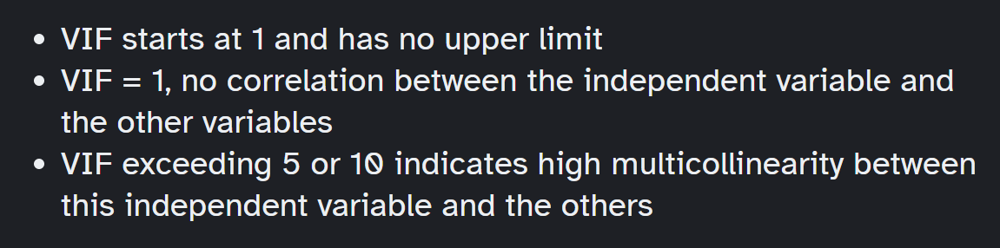

### Variance Inflation Factor (VIF)

https://www.analyticsvidhya.com/blog/2020/03/what-is-multicollinearity/

In [ ]:
# VIF dataframe
vif_data = pd.DataFrame()
vif_data["feature"] = X_train_balanced.columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(X_train_balanced.values, i) for i in range(len(X_train_balanced.columns))]

vif_data = vif_data.sort_values(by='VIF', ascending=False)
vif_data

In [ ]:
VIF_features = ['categorical_processor__Gender_Male']

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# VIF dataframe
vif_data = pd.DataFrame()
vif_data["feature"] = X_train_balanced.drop(VIF_features, axis = 1).columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(X_train_balanced.drop(VIF_features, axis = 1).values, i) for i in range(len(X_train_balanced.drop(VIF_features, axis = 1).columns))]

vif_data = vif_data.sort_values(by='VIF', ascending=False)
vif_data

In [ ]:
vif_data.shape

In [ ]:
X_train_balanced

In [ ]:
X_train_multi = X_train_balanced.drop(VIF_features, axis = 1)

In [ ]:
X_val_multi = X_val_FE.drop(VIF_features, axis = 1)

In [ ]:
X_test_multi = X_test_FE.drop(VIF_features, axis = 1)

In [ ]:
X_train_multi

In [ ]:
X_val_multi

In [ ]:
X_test_multi

In [ ]:
model = RandomForestClassifier()
model.fit(X_train_multi,y_train_balanced)

In [ ]:
model = GradientBoostingClassifier()
model.fit(X_train_multi,y_train_balanced)

In [ ]:
model.feature_names_in_

In [ ]:
y_train_pred = model.predict(X_train_multi)
    
print(classification_report(y_train_balanced,y_train_pred))

In [ ]:
y_val_pred = model.predict(X_val_multi)
    
print(classification_report(y_val,y_val_pred))

#### See even if we remove 1 features ('categorical_processor__Gender_Female') we are able to get 82% of validation accuracy which is not good becoz we are losing nearly 5% accuracy 

### VarianceThreshold

In [ ]:
X_train_balanced

In [ ]:
# In this technique we will find the varince of all the features and we can remove the features which have low variance 
# by setting the threshold parameter

var_thres=VarianceThreshold()
var_thres.fit(X_train_balanced)

In [ ]:
variances = pd.DataFrame(data={
    'Feature': X_train_balanced.columns,
    'variance': var_thres.variances_
})
variances = variances.sort_values(by='variance', ascending=True)

In [ ]:
variances

In [ ]:
plt.figure(figsize = (10,10))
plt.barh(y=variances['Feature'], width=variances['variance'], color='#087E8B')
plt.title('Feature importances obtained from coefficients', size=20)
plt.xticks(rotation='vertical')
plt.show()

In [ ]:
variances['Feature'].values[-9:].tolist()

In [ ]:
X_train_balanced[variances['Feature'].values[-9:].tolist()]

In [ ]:
y_train_balanced

### Mutual Information for Classification

In [ ]:
mutual_info = mutual_info_classif(X_train_balanced, y_train_balanced)
mutual_info

In [ ]:
mutual_info_df = pd.DataFrame(data={
    'Feature': X_train_balanced.columns,
    'MI': mutual_info
})
mutual_info_df = mutual_info_df.sort_values(by='MI', ascending=True)

In [ ]:
plt.figure(figsize = (10,10))
plt.barh(y=mutual_info_df['Feature'], width=mutual_info_df['MI'], color='#087E8B')
plt.title('Feature importances obtained using Mutual Information', size=20)
plt.xticks(rotation='vertical')
plt.show()

In [ ]:
mutual_info_df

In [ ]:
mutual_info_df['Feature'].values[-8:].tolist()

In [ ]:
mutual_info_df.shape

In [ ]:
model = GradientBoostingClassifier()
model.fit(X_train_balanced[mutual_info_df['Feature'].values[-8:].tolist()],y_train_balanced)

In [ ]:
model.feature_names_in_

In [ ]:
y_train_pred = model.predict(X_train_balanced[mutual_info_df['Feature'].values[-8:].tolist()])
    
print(classification_report(y_train_balanced,y_train_pred))

In [ ]:
y_val_pred = model.predict(X_val_FE[mutual_info_df['Feature'].values[-8:].tolist()])
    
print(classification_report(y_val,y_val_pred))

#### See with just 8 features out of 13 features, which are having high MI gain we are able to get the ~84 validation accurcy.

## PCA

In [ ]:
# we are not going to do PCA because we are having few features only.

## Building the final Model

In [171]:
X_train_balanced

,numeric_processor__CreditScore,numeric_processor__Age,numeric_processor__Tenure,numeric_processor__Balance,numeric_processor__NumOfProducts,numeric_processor__HasCrCard,numeric_processor__IsActiveMember,numeric_processor__EstimatedSalary,categorical_processor__Geography_France,categorical_processor__Geography_Germany,categorical_processor__Geography_Spain,categorical_processor__Gender_Female,categorical_processor__Gender_Male
0,-0.246478,0.408415,-0.815181,-0.885167,0.000000,0.000000,0.0,0.012255,1.0,0.0,0.0,1.0,-1.0
1,-0.321912,0.337396,-1.269531,-0.027113,0.000000,-1.000000,0.0,0.117401,0.0,0.0,1.0,1.0,-1.0
2,-1.114734,0.408415,0.806944,0.266434,1.244781,0.000000,-1.0,0.130126,1.0,0.0,0.0,1.0,-1.0
3,0.351726,0.174769,-1.269531,-0.885167,1.000000,-1.000000,-1.0,-0.054900,1.0,0.0,0.0,1.0,-1.0
4,3.873264,0.477393,-0.815181,0.105790,0.000000,0.000000,0.0,-0.200341,0.0,0.0,1.0,1.0,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
14307,-1.521201,0.786997,0.475221,0.285828,0.000000,0.000000,-1.0,-0.987677,0.0,1.0,0.0,1.0,-1.0
14308,0.138835,0.431784,0.900942,0.179743,1.362583,-0.220284,-1.0,0.587827,1.0,0.0,0.0,0.0,0.0
14309,0.086727,0.130758,0.000000,0.143096,0.000000,-0.082167,-1.0,0.858370,0.0,1.0,0.0,1.0,-1.0
14310,0.261125,0.855048,0.084537,0.183972,0.000000,-1.000000,-1.0,-0.512548,0.0,1.0,0.0,1.0,-1.0


In [172]:
y_train_balanced

0        1
1        0
2        1
3        0
4        0
        ..
14307    1
14308    1
14309    1
14310    1
14311    1
Name: target, Length: 14312, dtype: int64

In [173]:
final_pipe

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numeric_processor',
                                                  Pipeline(steps=[('imputation_mean',
                                                                   SimpleImputer(add_indicator=True,
                                                                                 strategy='median')),
                                                                  ('quantiletransformer',
                                                                   QuantileTransformer(output_distribution='normal'))]),
                                                  ['CreditScore', 'Age',
                                                   'Tenure', 'Balance',
                                                   'NumOfProducts', 'HasCrCard',
                                                   'IsActiveMember',
                                                   'EstimatedSalary']),
                                                 ('categorical_processor',
                                                  Pipeline(steps=[('imputation_consatnt',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 max_categories=15,
                                                                                 min_frequency=0.01,
                                                                                 sparse_output=False))]),
                                                  Index(['Geography', 'Gender'], dtype='object'))])),
                ('scaler', RobustScaler())])

In [174]:
model = GradientBoostingClassifier()

In [175]:
model.fit(X_train_balanced,y_train_balanced)

GradientBoostingClassifier()

In [176]:
X_val_FE

,numeric_processor__CreditScore,numeric_processor__Age,numeric_processor__Tenure,numeric_processor__Balance,numeric_processor__NumOfProducts,numeric_processor__HasCrCard,numeric_processor__IsActiveMember,numeric_processor__EstimatedSalary,categorical_processor__Geography_France,categorical_processor__Geography_Germany,categorical_processor__Geography_Spain,categorical_processor__Gender_Female,categorical_processor__Gender_Male
0,0.580536,0.174769,-0.242460,0.087210,0.000000,0.0,0.0,0.616268,1.0,0.0,0.0,0.0,0.0
1,0.646049,1.177880,-0.815181,0.143641,1.779552,0.0,-1.0,-0.794256,0.0,1.0,0.0,0.0,0.0
2,-0.246478,-0.867611,0.238899,0.006391,1.000000,0.0,-1.0,-0.526760,0.0,1.0,0.0,1.0,-1.0
3,-0.016820,-1.177819,-0.815181,0.058781,0.000000,0.0,0.0,-0.854822,0.0,1.0,0.0,1.0,-1.0
4,-0.022429,1.664369,1.233657,0.068546,1.000000,-1.0,0.0,0.068463,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,0.886859,-0.558887,-0.503087,0.246692,1.000000,0.0,0.0,1.092840,1.0,0.0,0.0,0.0,0.0
496,0.101214,0.861852,0.496913,0.039974,0.000000,0.0,0.0,0.391849,0.0,1.0,0.0,1.0,-1.0
497,-1.188989,-0.177368,1.233657,0.052827,1.000000,0.0,-1.0,1.039091,1.0,0.0,0.0,1.0,-1.0
498,-0.295424,1.400805,-0.815181,0.109683,0.000000,-1.0,0.0,0.476345,1.0,0.0,0.0,1.0,-1.0


In [177]:
y_val

0      0
1      1
2      0
3      0
4      0
      ..
495    0
496    1
497    0
498    0
499    0
Name: target, Length: 500, dtype: int64

In [178]:
y_train_pred = model.predict(X_train_balanced)
train_score = accuracy_score(y_train_balanced,y_train_pred)
    
precision = precision_score(y_train_balanced,y_train_pred,average='macro')
recall = recall_score(y_train_balanced,y_train_pred,average='macro')
f1 = f1_score(y_train_balanced,y_train_pred,average='macro')
    
print(classification_report(y_train_balanced,y_train_pred))
    
y_val_pred = model.predict(X_val_FE)

print(classification_report(y_val,y_val_pred))

              precision    recall  f1-score   support

           0       0.87      0.90      0.88      7156
           1       0.89      0.87      0.88      7156

    accuracy                           0.88     14312
   macro avg       0.88      0.88      0.88     14312
weighted avg       0.88      0.88      0.88     14312

              precision    recall  f1-score   support

           0       0.92      0.86      0.89       413
           1       0.50      0.63      0.56        87

    accuracy                           0.82       500
   macro avg       0.71      0.75      0.72       500
weighted avg       0.84      0.82      0.83       500



In [179]:
X_test_FE

,numeric_processor__CreditScore,numeric_processor__Age,numeric_processor__Tenure,numeric_processor__Balance,numeric_processor__NumOfProducts,numeric_processor__HasCrCard,numeric_processor__IsActiveMember,numeric_processor__EstimatedSalary,categorical_processor__Geography_France,categorical_processor__Geography_Germany,categorical_processor__Geography_Spain,categorical_processor__Gender_Female,categorical_processor__Gender_Male
0,0.877451,0.089346,0.238899,-0.885167,1.0,-1.0,-1.0,0.043544,0.0,0.0,1.0,0.0,0.0
1,-0.860814,-0.267902,0.496913,0.087848,1.0,0.0,0.0,-0.288632,1.0,0.0,0.0,1.0,-1.0
2,0.580536,-0.267902,1.233657,0.136300,0.0,-1.0,0.0,0.053735,1.0,0.0,0.0,1.0,-1.0
3,-0.246478,-0.658856,0.496913,-0.045857,0.0,0.0,0.0,0.632931,1.0,0.0,0.0,1.0,-1.0
4,-0.308619,-0.088813,-0.242460,0.124130,1.0,0.0,-1.0,0.025389,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,0.336142,1.889322,-0.503087,0.035965,1.0,0.0,0.0,-1.026115,0.0,1.0,0.0,1.0,-1.0
496,-0.688857,0.660353,-0.503087,0.134849,0.0,0.0,0.0,0.080721,0.0,0.0,1.0,0.0,0.0
497,0.281180,-1.532882,-0.242460,0.154437,0.0,0.0,-1.0,-0.487039,1.0,0.0,0.0,0.0,0.0
498,-0.257366,-1.290636,-0.242460,0.158355,1.0,0.0,0.0,-0.082673,1.0,0.0,0.0,1.0,-1.0


In [180]:
y_test

0      0
1      0
2      0
3      0
4      0
      ..
495    0
496    1
497    1
498    0
499    1
Name: target, Length: 500, dtype: int64

In [181]:
y_test_pred = model.predict(X_test_FE)

print(classification_report(y_test,y_test_pred))

              precision    recall  f1-score   support

           0       0.91      0.88      0.89       394
           1       0.60      0.66      0.63       106

    accuracy                           0.84       500
   macro avg       0.75      0.77      0.76       500
weighted avg       0.84      0.84      0.84       500



#### We got 84% accuracy on test data with our final 'GradientBoostingClassifier' model

### Save Trained Model Using joblib

In [182]:
import joblib

In [183]:
joblib.dump(model, '../Models/bank_customer_churn_model')

['../Models/bank_customer_churn_model']

In [184]:
joblib.dump(final_pipe, '../Pipelines/bank_customer_churn_pipelines')

['../Pipelines/bank_customer_churn_pipelines']

### Load Saved Model

In [185]:
model = joblib.load('../Models/bank_customer_churn_model')

In [186]:
final_pipe = joblib.load('../Pipelines/bank_customer_churn_pipelines')

In [187]:
test_df.head()

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,target
0,769,Spain,Male,38,6,0.00,2,0,0,104393.78,0
1,534,France,Female,34,7,121551.58,2,1,1,70179.00,0
2,729,France,Female,34,9,132121.71,1,0,1,105409.31,0
3,619,France,Female,30,7,70729.17,1,1,1,160948.87,0
4,610,France,Male,36,4,129440.30,2,1,0,102638.35,0


In [188]:
test = pd.DataFrame(columns=X_train.columns)
test.loc[0] = [769,'spain','Male',38,6,0,2,0,0,104393.78]
test

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary
0,769,spain,Male,38,6,0,2,0,0,104393.78


In [189]:
final_pipe

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('numeric_processor',
                                                  Pipeline(steps=[('imputation_mean',
                                                                   SimpleImputer(add_indicator=True,
                                                                                 strategy='median')),
                                                                  ('quantiletransformer',
                                                                   QuantileTransformer(output_distribution='normal'))]),
                                                  ['CreditScore', 'Age',
                                                   'Tenure', 'Balance',
                                                   'NumOfProducts', 'HasCrCard',
                                                   'IsActiveMember',
                                                   'EstimatedSalary']),
                                                 ('categorical_processor',
                                                  Pipeline(steps=[('imputation_consatnt',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 max_categories=15,
                                                                                 min_frequency=0.01,
                                                                                 sparse_output=False))]),
                                                  Index(['Geography', 'Gender'], dtype='object'))])),
                ('scaler', RobustScaler())])

In [190]:
final_pipe.transform(test)

array([[ 0.87745132,  0.08934609,  0.23889937, -0.88516686,  1.        ,
        -1.        , -1.        ,  0.04354412,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ]])

In [191]:
model.predict(final_pipe.transform(test))

array([0], dtype=int64)

In [192]:
X_test.head()

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary
0,769,Spain,Male,38,6,0.00,2,0,0,104393.78
1,534,France,Female,34,7,121551.58,2,1,1,70179.00
2,729,France,Female,34,9,132121.71,1,0,1,105409.31
3,619,France,Female,30,7,70729.17,1,1,1,160948.87
4,610,France,Male,36,4,129440.30,2,1,0,102638.35


In [193]:
final_pipe.transform(X_test.head())

array([[ 0.87745132,  0.08934609,  0.23889937, -0.88516686,  1.        ,
        -1.        , -1.        ,  0.04354412,  0.        ,  0.        ,
         1.        ,  0.        ,  0.        ],
       [-0.86081449, -0.26790196,  0.49691261,  0.08784838,  1.        ,
         0.        ,  0.        , -0.28863225,  1.        ,  0.        ,
         0.        ,  1.        , -1.        ],
       [ 0.58053575, -0.26790196,  1.23365692,  0.13629979,  0.        ,
        -1.        ,  0.        ,  0.05373523,  1.        ,  0.        ,
         0.        ,  1.        , -1.        ],
       [-0.24647795, -0.65885556,  0.49691261, -0.04585696,  0.        ,
         0.        ,  0.        ,  0.63293137,  1.        ,  0.        ,
         0.        ,  1.        , -1.        ],
       [-0.30861904, -0.08881256, -0.24246021,  0.12412975,  1.        ,
         0.        , -1.        ,  0.02538924,  1.        ,  0.        ,
         0.        ,  0.        ,  0.        ]])

In [194]:
test_df.iloc[5:10]

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,target
5,850,Germany,Female,40,4,97990.49,2,0,0,106691.02,0
6,585,France,Female,30,6,0.00,2,1,1,137757.69,0
7,747,Spain,Male,41,9,0.00,1,1,0,32430.94,1
8,626,France,Male,33,8,0.00,2,1,0,138504.28,0
9,693,Germany,Female,41,9,181461.48,3,1,1,187929.43,1


In [195]:
model.predict(final_pipe.transform(X_test.iloc[5:10]))

array([0, 0, 1, 0, 1], dtype=int64)

In [196]:
y_test.iloc[5:10]

5    0
6    0
7    1
8    0
9    1
Name: target, dtype: int64

### ANN

In [ ]:
import tensorflow as tf
from tensorflow import keras

In [ ]:
model_ANN = keras.Sequential([
    keras.layers.Dense(100, input_shape=(43,),activation='relu'),
    keras.layers.Dense(50,activation='relu'),
    keras.layers.Dense(25,activation='relu'),
    keras.layers.Dense(10,activation='relu'),
    keras.layers.Dense(1,activation='sigmoid')
])

model_ANN.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

model_ANN.fit(X_res,y_res,validation_data=(X_test_FE,y_test),epochs=100,batch_size=1000)

In [ ]:
model_ANN.evaluate(X_test_FE,y_test)

In [ ]:
y_test_pred = model_ANN.predict(X_test_FE)
y_test_pred[:5]

In [ ]:
y_pred = []
for element in y_test_pred:
    if element > 0.5:
        y_pred.append(1)
    else:
        y_pred.append(0)

In [ ]:
y_pred[:5]

In [ ]:
y_test[:5]

In [ ]:
from sklearn.metrics import confusion_matrix , classification_report

print(classification_report(y_test,y_pred))

In [ ]:
# The below is the sample code to deploy this model using Gradio. you can tweek the below code for this project needs and deploy it.

In [ ]:
X_train.columns

In [ ]:
1. num_preg - Number of times pregnant
2. glucose_conc - Plasma glucose concentration a 2 hours in an oral glucose tolerance test
3. diastolic_bp - Diastolic blood pressure (mm Hg)
4. thickness - Triceps skin fold thickness (mm)
5. insulin - 2-Hour serum insulin (mu U/ml)
6. bmi - Body mass index (weight in kg/(height in m)^2)
7. diab_pred - Diabetes pedigree function
8. age - Age (years)
9. skin - 
10. target - class

In [ ]:
train_df[['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age']].describe().T

## Gradio deployment

In [ ]:
import gradio as gr
import random
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
from datasets import load_dataset


matplotlib.use("Agg")
df = pd.read_csv('train_df.csv')
X_train = df.drop('target',axis=1)
y_train = df['target']



def predict(*args):
    df = pd.DataFrame([args], columns=X_train.columns)
    result = pipe_xgb.predict(final_pipe.transform(df))
    output = 'diabetic' if result[0]==1 else 'no diabetic' 
    return output



with gr.Blocks() as demo:
    gr.Markdown("""
    **Indian Loan Default Prediction **:  This demo uses an Random Forest classifier predicts loan default based on demographic factors.
    """)
    with gr.Row():
        with gr.Column():
            Pregnancies = gr.Slider(label="No.of Pregnensis", minimum=0, maximum=20, step=1, randomize=True)
            Glucose = gr.Slider(label="Glucose", minimum=0, maximum=400, step=1, randomize=True)
            BloodPressure = gr.Slider(label="blood pressure (mm Hg)", minimum=0, maximum=200, step=1, randomize=True)
            SkinThickness = gr.Slider(label="Triceps skin fold thickness (mm)", minimum=0, maximum=100, step=1, randomize=True)
            Insulin = gr.Slider(label="2-Hour serum insulin (mu U/ml)", minimum=0, maximum=1000, step=1, randomize=True)
            BMI = gr.Slider(label="Body mass index", minimum=0, maximum=100, step=0.5, randomize=True)
            DiabetesPedigreeFunction = gr.Slider(label="Diabetes pedigree function", minimum=0, maximum=10, step=0.5, randomize=True)
            Age = gr.Slider(label="Age", minimum=0, maximum=150, step=1, randomize=True)
            
            
        with gr.Column():
            label = gr.Label()
            with gr.Row():
                predict_btn = gr.Button(value="Predict")
            predict_btn.click(
                predict,
                inputs=[
                    Pregnancies,
                    Glucose,
                    BloodPressure,
                    SkinThickness,
                    Insulin,
                    BMI,
                    DiabetesPedigreeFunction,
                    Age,
                ],
                outputs=[label],
            )

demo.launch()

In [ ]:
demo.close()

# Feature Engineering

### 1.Handling Missing values

### All the techniques of handling Missing values

### For Numerical Features
1. Mean, Median,Mode replacement
2. Random Sample Imputation
3. Capturing NAN values with a new feature
4. End of Distribution imputation
5. Arbitrary imputation

### For Categorical Features
6. Frequent categories imputation
7. If too many are missing, Impute with new category 'Missing'
8. Capturing NAN values with a new feature

In [ ]:
print(train_df[categorical_features].columns)
print(len(train_df[categorical_features].columns))

In [ ]:
print(train_df[numerical_features].columns)
print(len(train_df[numerical_features].columns))

In [ ]:
# prints the no.of null values in each feature
# prints the % of null values in each feature

df_cat = train_df[categorical_features]

total = df_cat.isnull().sum().sort_values(ascending=False)
percent = np.round_(((df_cat.isnull().sum()/df_cat.isnull().count())*100),decimals=2).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head()

#### We dont have any null values in categorical_features (less work)

In [ ]:
df_num = train_df[numerical_features]

total = df_num.isnull().sum().sort_values(ascending=False)
percent = np.round_(((df_num.isnull().sum()/df_num.isnull().count())*100),decimals=2).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head()

In [ ]:
# Drop only if NaN in 'Engine' column you know the reason

train_df = train_df.dropna(subset = ['Engine'])

In [ ]:
df_cat = train_df[categorical_features]

total = df_cat.isnull().sum().sort_values(ascending=False)
percent = np.round_(((df_cat.isnull().sum()/df_cat.isnull().count())*100),decimals=2).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head()

In [ ]:
num_features_nan=[feature for feature in train_df.columns if train_df[feature].isnull().sum()>0 and train_df[feature].dtypes!='O']
print(num_features_nan)
print(len(num_features_nan))

In [ ]:
## Replacing the numerical Missing Values

for feature in num_features_nan:
    
    ## We will replace by using median since there are outliers
    median_value=train_df[feature].median()
    
    print(feature,train_df[feature].median())
    
    ## create a new feature to capture nan values
    train_df[feature+'_nan']=np.where(train_df[feature].isnull(),1,0)
    train_df[feature].fillna(median_value,inplace=True)
    
train_df[num_features_nan].isnull().sum()

In [ ]:
train_df.head(20)

### 2.Handling Rare Categorical Feature

We will remove categorical variables that are present less than 1% of the observations

In [ ]:
train_df[categorical_features].nunique()

In [ ]:
# We want to perform this operation only on 'Model' because there are too many models. we gonna keep the brands as they are.

In [ ]:
temp=train_df.groupby('Model')['Price'].count()/len(train_df)
temp_df=temp[temp>0.01].index
print(temp_df)
train_df['Model']=np.where(train_df['Model'].isin(temp_df),train_df['Model'],'Rare_var')

In [ ]:
train_df[categorical_features].nunique()

In [ ]:
for col in categorical_features:
    print(col,(train_df[col] == 'Rare_var').sum())

In [ ]:
train_df[categorical_features]

### 3.Handling Ouliers 

In [ ]:
continuous_features

In [ ]:
for col in continuous_features:
    print(col)
    #plt.figure(figsize = (35,8))
    #plt.subplot(1, 2, 1)
    sns.scatterplot(data=train_df, x=col,y='Price')
    plt.xlabel(col)
    plt.ylabel('Price')
    #plt.subplot(1, 2, 2)
    #sns.lineplot(data=train_df, x=train_df[col], y="Price",estimator=np.median)
    plt.show()

In [ ]:
for col in continuous_features:
    print(col)
    #plt.figure(figsize = (35,8))
    #plt.subplot(1, 2, 1)
    sns.boxplot(x=train_df[col])
    plt.xlabel(col)
    plt.ylabel('Price')
    #plt.subplot(1, 2, 2)
    #sns.lineplot(data=train_df, x=train_df[col], y="Price",estimator=np.median)
    plt.show()

In [ ]:
discrete_features

In [ ]:
for col in discrete_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    plt.figure(figsize = (18,5))
    plt.subplot(1, 2, 1)
    sns.scatterplot(data=train_df, x=col,y='Price')
    plt.xlabel(col)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=train_df[col])
    plt.show()

#### Its not always a good idea to remove outliers because we lose the training data and our model wont be robust (thumb rule always our model should be generalized) to the test data when there are outliers in train data..
#### The best way is to handle them
#### Ofcourse Linear Models will be sensitive to outliers like Linear Regression,L1,L2,Polynomial ,SVM regressors but the non-linear models like DT,ensemble models are not sensitive to the outliers

#### We gonna remove very few oulier data point based on some conditions because we gonna try Linear models initially 

#### Out of all continuous features 'Mileage' is the one close to Normal distribution. the rest are skewed(['Kilometers_Driven','Engine','Power','Price'])

In [ ]:
uppper_boundary=train_df['Mileage'].mean() + 3* train_df['Mileage'].std()
lower_boundary=train_df['Mileage'].mean() - 3* train_df['Mileage'].std()
print(lower_boundary), print(uppper_boundary),print(train_df['Mileage'].mean())

In [ ]:
train_df.loc[train_df['Mileage']>=30.8]

In [ ]:
train_df.loc[train_df['Mileage']>=30.8].shape

In [ ]:
# From above we can see that there 13 instances falling out of 3rd standard deviation. 
# And these 13 also not so deviated all are under 34 so we gonna leave those. 

In [ ]:
for col in continuous_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    print('no.of zeros :',(train_df[col]==0).sum())
    print('% of zeros :',np.round_((train_df[col]==0).sum()/len(train_df)*100,decimals=2))
    print('no.of nulls :',train_df[col].isna().sum())
    print('% of nulls :',np.round_(train_df[col].isna().sum()/len(train_df)*100,decimals=2))
    plot_comparison(train_df, train_df[col], col)

In [ ]:
continuous_features

In [ ]:
#### Lets compute the Interquantile range to calculate the boundaries

for col in ['Kilometers_Driven', 'Engine', 'Power']:
    IQR=train_df[col].quantile(0.75)-train_df[col].quantile(0.25)
    lower_bridge=train_df[col].quantile(0.25)-(IQR*1.5)
    upper_bridge=train_df[col].quantile(0.75)+(IQR*1.5)
    print(col), print(train_df[col].median(), lower_bridge, upper_bridge)

In [ ]:
train_df['Power'].median()

In [ ]:
#### Extreme outliers

for col in ['Kilometers_Driven', 'Engine', 'Power', 'Price']:
    IQR=train_df[col].quantile(0.75)-train_df[col].quantile(0.25)
    lower_bridge=train_df[col].quantile(0.25)-(IQR*3)
    upper_bridge=train_df[col].quantile(0.75)+(IQR*3)
    print(col), print(train_df[col].median(), lower_bridge, upper_bridge)

In [ ]:
train_df.loc[(train_df['Kilometers_Driven']>=131551.75)].shape

In [ ]:
train_df.loc[(train_df['Kilometers_Driven']>=190103.5)].shape

In [ ]:
train_df.loc[(train_df['Kilometers_Driven']>=190103.5)].sort_values(by=['Kilometers_Driven'],ascending=False)

In [ ]:
train_df.loc[(train_df['Kilometers_Driven']>=190103.5), 'Kilometers_Driven'] = 190103.5

In [ ]:
train_df.loc[(train_df['Kilometers_Driven']>190103.5)].shape

In [ ]:
train_df['Engine'].hist()

In [ ]:
train_df.loc[(train_df['Engine']>=3163.0)].shape

In [ ]:
train_df.loc[(train_df['Engine']>=4342.0)].shape

In [ ]:
train_df.loc[(train_df['Engine']>=4342.0)].sort_values(by=['Engine'],ascending=False)

In [ ]:
train_df.loc[(train_df['Engine']>=4342.0),'Engine'] = 4342.0

In [ ]:
train_df.loc[(train_df['Engine']>4342.0)].shape

In [ ]:
train_df.loc[(train_df['Power']>=229.75)].shape

In [ ]:
train_df.loc[(train_df['Power']>=321.4)].shape

In [ ]:
train_df.loc[(train_df['Power']>=321.4)].sort_values(by=['Power'],ascending=False)

In [ ]:
train_df.loc[(train_df['Power']>=321.4),'Power'] = 321.4

In [ ]:
train_df.loc[(train_df['Power']>321.4)].shape

### 4.Feature transformation

#### Linear models assumes that the data is normally disrtibutes
#### The Goal of Feature transformation is to convert non-normal distributed features into normal distribution

In [ ]:
train_df[continuous_features].columns

In [ ]:
transform_features = ['Kilometers_Driven', 'Mileage', 'Engine', 'Power', 'Price']

In [ ]:
skew = []
for col in transform_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    skew.append(train_df[col].skew())
print('avg_skew : ',round(sum(skew)/len(skew), 2))

In [ ]:
train_df

In [ ]:
def get_avg_skew(df,features):
    skew = []
    for col in features:
        skew.append(np.absolute(df[col].skew()))   
    return round(sum(skew)/len(skew), 2)

In [ ]:
get_avg_skew(train_df,transform_features)

In [ ]:
def plot_data(train_df,feature):
    plt.figure(figsize=(18,6))
    plt.subplot(1,2,1)
    train_df[feature].hist()
    plt.subplot(1,2,2)
    stat.probplot(train_df[feature],dist='norm',plot=pylab)
    plt.show()

In [ ]:
#log transformation 
#log1p Calculates log(1 + x).

log_df = train_df.copy()
for col in transform_features:
    log_df[col]=np.log1p(log_df[col])
get_avg_skew(log_df,transform_features)

In [ ]:
#boxcox transformation

bc_df = train_df.copy()
for col in transform_features:
    bc_df[col],parameters=stat.boxcox(bc_df[col]+1)
get_avg_skew(bc_df,transform_features)

In [ ]:
#reciprocal transformation

rp_df = train_df.copy()
for col in transform_features:
    rp_df[col]=1/(rp_df[col]+1)
get_avg_skew(rp_df,transform_features)

In [ ]:
#square root transformation

sq_df = train_df.copy()
for col in transform_features:
    sq_df[col]=(sq_df[col]+1)**(1/2)
get_avg_skew(sq_df,transform_features)

In [ ]:
#exponential transformation

ex_df = train_df.copy()
for col in transform_features:
    ex_df[col]=(ex_df[col]+1)**(1/1.2)
get_avg_skew(ex_df,transform_features)

In [ ]:
for col in transform_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    plot_data(train_df,col)

In [ ]:
#From above boxcox seems giving the least avg skew of features.I am not sure is this a good practice to follow but it's working for now.

In [ ]:
for col in transform_features:
    print(col)
    print('Skew :', round(bc_df[col].skew(), 2))
    plot_data(bc_df,col)

In [ ]:
## seems boxcox is giving us the best transformation so will go with that
## boxcox only takes positive values and the +1 is to handle the zero's in the data

for col in transform_features:
    if col == 'Price':
        train_df[col],parameters=stat.boxcox(train_df[col]+1)
        Price_Lambda = parameters
        print('Price Lambda : ',Price_Lambda)
    else:
        train_df[col],parameters=stat.boxcox(train_df[col]+1)
    
train_df.head(20)

In [ ]:
skew = []
for col in transform_features:
    print(col)
    print('Skew :', round(train_df[col].skew(), 2))
    skew.append(train_df[col].skew())
print('avg_skew : ',round(sum(skew)/len(skew), 2))

### 5.Categorical Feature Encoding

1. One Hot Encoding
2. Frequent labels one hot encoding (10 or 15)
3. Label encoding
4. count or frequency encoding
5. Target Guided Ordinal Encoding
6. Target Mean Encoding

In [ ]:
print(categorical_features)
print(len(categorical_features))

In [ ]:
print(discrete_features)
print(len(discrete_features))

In [ ]:
## we gonna leave all the discrete variables as they are becoz all are ordinal variables means if the value is more it has a more effect on target variable
## here take ['Car_Age', 'Seats'] if these variable values are more there is a definite positive effect on Price. there is exception for Seats becoz high price 
## cars have 2 seats but thats ok the info will be there in other features like brand

## any way in feature scaling they all come under on scale

In [ ]:
train_df[categorical_features].nunique()

In [ ]:
train_df['Model'].value_counts().plot.bar()

In [ ]:
# We will not go with one hot encoding here becoz too many feature will get generated and its a curse of dimentionality

# i think its a good idea to go with Target Encoding becoz the individual categories will get the respective wieghts according to their predictive power
# initially i wanted to go with Mean encoding but it will become too spesific for train data rather Target encoding and model will overfit

### Target Guided Ordinal Encoding

In [ ]:
categorical_features

In [ ]:
for col in categorical_features:  
    ordinal_labels=train_df.groupby([col])['Price'].mean().sort_values().index
    ordinal_labels2={k:i for i,k in enumerate(ordinal_labels,1)}
    train_df[col]=train_df[col].map(ordinal_labels2)
train_df.head(20)

In [ ]:
train_df.shape

### 6.Feature scaling

In [ ]:
from sklearn.preprocessing import RobustScaler

In [ ]:
features_to_scale = [feature for feature in train_df.columns if feature not in ['Price']]
print(features_to_scale)

In [ ]:
scaler=RobustScaler()
train_df_robust_scaler=pd.DataFrame(scaler.fit_transform(train_df[features_to_scale]),columns=train_df[features_to_scale].columns)

In [ ]:
train_df_robust_scaler.head(20)

In [ ]:
train_df_robust_scaler.shape

In [ ]:
train_df = pd.concat([pd.DataFrame(scaler.transform(train_df[features_to_scale]), columns=features_to_scale),
                     train_df[['Price']].reset_index(drop=True)],
                     axis=1)

In [ ]:
train_df.head(20)

### 7.Imbalanced dataset

In [ ]:
## Its the one main issue in classification problems where target classes are imbalanced
## ex: heart attack classification dataset contains 5000 records/observation
## but in that 372 are positive(there is a Heart attack) class and the rest 4628 are negative class(there is no heart attack)
## in that case the model will more likely to predict the test record as false class means model is baised towards the majority class


## when it comes to regressin problems like price prediction we dont have that problem becoz we are predicting continuous value not a class label
## but we need to make sure that the Target variable here the Price must be close to Normal distribution becoz linear models assumes variables are Normally distributed

In [ ]:
from scipy.special import boxcox, inv_boxcox

df['SalePrice'].to_numpy()

In [ ]:
#y = boxcox(df['SalePrice'].to_numpy(), SalePrice_Lambda)
SalePrice_Lambda = -0.10000692036172426
inv_boxcox(df['SalePrice'].to_numpy(), SalePrice_Lambda)

In [ ]:
pd.DataFrame(inv_boxcox(df['SalePrice'].to_numpy(), SalePrice_Lambda), columns = ['SalePrice'])

In [ ]:
train_df.head()

In [ ]:
train_df.shape

In [ ]:
X_train = train_df.iloc[ : , :-1]
y_train = train_df.iloc[ : ,-1]

In [ ]:
X_train.head()

In [ ]:
X_train.shape

In [ ]:
y_train

In [ ]:
y_train.shape